### uLoop plate reader data analysis

This notebook is to analyze the **uLoop paper data**

If you don´t want to run the whole analysis and just to load the saved database with the computed and reported values, go to the end of the notebook and run the "Load Data" section.

In [1]:
# import general packages
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pickle as pkl
from scipy.optimize import curve_fit
from scipy.stats import sem, t

#modify some matplotlib parameters to manage the images for illustrator
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

### Function to perform the analysis.
In this section are the functions neccesaries to manage and perform the analysis of the data.
It is neccesary to execute all of them previous to run the analysis.

In [2]:
def save_obj(obj, name, folder ):
    with open(folder+'/'+ name + '.pkl', 'wb') as f:
        pkl.dump(obj, f, pkl.HIGHEST_PROTOCOL)

def load_obj(name, folder ):
    with open(folder+'/' + name + '.pkl', 'rb') as f:
        return pkl.load(f)

In [8]:
def get_dict_cathegories(dictionary):
    cat_list = []
    for cat_name in dictionary.keys():
        cat_list.append(cat_name)
        
    return(cat_list)

In [9]:
def db_plot_dat_dat(db, x_sheetname, y_sheetname, x_units, y_units, label_cath, title_fig, folder = 'null', axis_lim = [0,0], index_dat = '', index_lab = '', x_logscale=False, y_logscale = False):
    
    all_data = {}
    labels = []    #to store the label of each data element ploted (i.e. of every curve in the plot)
    db_names = get_dict_cathegories(db)
    
    # go trought every dataset in the database (i.e. through every plate)
    for dataset in db_names:
        
        wsd = db[dataset]['data_sheets']
        wsl = db[dataset]['label_sheets']
        
        # define the well data index and well label index
        if index_dat == '': 
            wells = wsd['index']
        else:
            wells = index_dat

        if index_lab == '':
            index_label = wsd['index_lab']
        else:
            index_label = index_lab

        if len(wells) != len(index_label):
            print('ERROR: Wells index data and wells index label have to be same length!')
            return

        # get the data
        wells_num = len(wsd[x_sheetname]['data'][0,:])
        data = np.zeros((len(wsd[x_sheetname]['data'][:,0]), 2, wells_num))

        for i in range(wells_num):

            data[:,0,i] = wsd[x_sheetname]['data'][:,i]
            data[:,1,i] = wsd[y_sheetname]['data'][:,i]
            labels.append(get_labelstrings(wsl, index_label, i, label_cath))   
        all_data[dataset] = data
    # make a list of non-redundant labels
    nr_labels = non_redundant_list(labels)
    
    #print(nr_labels)
    #print(len(nr_labels))
    
    # define a color vector for labels
    colors = plt.cm.jet(np.linspace(0, 1, len(nr_labels)))
    #print(colors)
    #print(len(colors))
    
    f_size = 16  #chart font size
    fig= plt.figure()
    #fig.suptitle(x_sheetname + ' v/s '+ y_sheetname, fontsize=f_size+2)
    plt.title(title_fig,fontsize=f_size+3)
    counter = 0
    
    lines = []
    line_labels = []
    
    nr_aux = non_redundant_list(labels)
    
    for dataset in db_names:
        print(all_data[dataset].shape)
        for j in range(all_data[dataset].shape[2]):
            lab_num = nr_labels.index(labels[counter])       # get the position of the label in the non-redundant label list
            p,=plt.plot(all_data[dataset][:,0,j], all_data[dataset][:,1,j], color=colors[lab_num])
            
            #add the lines to make the legend
            if len(nr_aux) != 0:
                if labels[counter] in nr_aux:
                    nr_aux.remove(labels[counter])
                    lines.append(p)
                    line_labels.append(labels[counter])

            counter +=1     #increase in 1 for each dataset (-->data curve)
            
    print(line_labels)                
    plt.ylabel(y_sheetname +' '+ str(y_units), fontsize=f_size)
    plt.xlabel(x_sheetname +' '+ str(x_units), fontsize=f_size)
    #lgd = plt.legend([nr_labels[i] for i in range(len(nr_labels))], loc = 'upper right', bbox_to_anchor=(1.3, 1))
    lgd = plt.legend(lines,[line_labels[i] for i in range(len(line_labels))], loc = 'upper right', bbox_to_anchor=(1.35, 1))
    #plt.axis([0, 6, 0, 20])
    
    if axis_lim[1] != 0:
    
        plt.ylim([0,axis_lim[1]])
            
    #if axis_lim[0] != 0:
        
        #plt.xlim([0,axis_lim[0]])
    
    if x_logscale == True:
        plt.xscale('log')
        
    if y_logscale == True:
        plt.yscale('log')
        
    if folder != 'null':
        plt.savefig(folder+title_fig+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True) #
    
    plt.show()
    
    return(all_data,labels)

In [11]:
def db_get_group_index(db, db_all_names, label_groups):
    """
    Return the data index (well number) and the label index (label position) of the
    wells whose label coincide with at least one label of 'label_groups' (OR logic)
    In the future should be modified to choose between OR / AND logic classification
    accord the groups indicated in 'label_groups'
    
    Parameters
    ----------
    label_groups: list of strings
        contain the cathegories whose data sets are desired to select
        
    wsl: dictionary
        cointain the data from the workbook label sheets
    
    label_sheetnames: list of strings
        contain the names of the sheets with the labels
        
    db_all_names: list
        contains the names of the dataset in the database desired to look in
    
    Returns
    -------
    index_data: list
        contain the index of the selected data wells
        
    index_label: list
        coordinates of the selected wells in the label sheets
        
    """


    #wlabels = all_data[file_names[plate_num]]['label_sheets']
    all_index = {}
    
    for dataset in db_all_names:
        index_data=[]
        index_label=[]
        wsl = db[dataset]['label_sheets']
        label_sheetnames = get_dict_cathegories(wsl)
        
        for cat in label_groups:  #each indicated label (e.g Top10)
            for name in label_sheetnames: # search on each label sheet (e.g "Strains", 'media')
                counter=0
                labels = wsl[name]
                for i in range(len(labels)):
                    for j in range(len(labels[0])):
                        if cat == labels[i][j]:
                            if counter not in index_data:  #to make sure not choose more than once a position which 
                                                           # match more than one indicated label
                                index_data.append(counter)
                                index_label.append([i,j])
                        counter+=1
                        
        all_index[dataset] = {}
        all_index[dataset]['index_data'] = index_data
        all_index[dataset]['index_label'] = index_label
    return(all_index)

In [12]:
def db_get_group_values(db, db_all_names, index):
    """
    Get the values of desired set of wells
    
    Parameters
    ----------
    wsd: dictionary
        contain the data values of each well
    
    sheetnames: list
        names of the data sheets
        
    index_data: list
        contain the index of the selected data wells.
        can be obtained with get_group_index or set manually
        
    
    Returns
    -------
    data: dictionary
        data of the desired wells. 
        Its estructure is: data[sheetname]['data' or 'time'] 
        
    """
    all_data = {}
    
    for dataset in db_all_names:
        index_data = index[dataset]['index_data']
        if index_data != []:
            
            data = {}
            ind_len = len(index_data)
            wsd = db[dataset]['data_sheets']
            wsl = db[dataset]['label_sheets']
            sheetnames = get_dict_cathegories(wsd)

            for name in sheetnames:
                data[name] = {}

                data[name]['time'] = wsd[name]['time']
                data[name]['data'] = np.zeros((wsd[name]['time'].shape[0], ind_len))

                for i in range(ind_len):
                    data[name]['data'][:,i]=wsd[name]['data'][:,index_data[i]]

            data['index'] = index_data
            data['index_lab'] = index[dataset]['index_label']
            all_data[dataset] = {}
            all_data[dataset]['data_sheets'] = data
            all_data[dataset]['label_sheets'] = wsl
    return(all_data) 

In [13]:
def db_plot_group(db, data_sheets, index_data, index_label, label_cath, y_axis_labels, log = False):
    """
    Plot the data from 'wsd' of wells indicated on 'index_data' putting the labels from 'label_cath' whos positions
    are indicated in 'index_label'.  
    
    Parameters
    ----------
    wsd: dictionary
        contain the data values of each well
    
    wsl:dictionary
        contain the labels of each well
        
    datasheets: list
        list of datasheet names. If you only put one name, make sure to make it a list
        e.g. ['sheet_name'] and not only 'sheetname'
    
    index_data: list
        contain the index of the selected data wells.
        can be obtained with get_group_index or set manually
        
    index_label: list
        coordinates of the selected wells in the label sheets
        can be obtained with get_group_index or set manually
    
    label_cath: list
        sheet names of the cathegories to use in the labels
    
    y_axis_labels: list
        y axis labels to write in the plots. It have to be in the same order
        as the data is included. 
        e.g: y_axis_labels = ['OD_600', 'Intensity [AU]', 'Intensity [AU]']
        
    
    Returns
    -------
    Plots of the desired data
        
    """
    db_names = get_dict_cathegories(db)
    
    for dataset in db_names:
        if type(data_sheets) == str:
            
            wsd = db[dataset]['data_sheets']
        else: #in case you input directly some data not obtained directly from db 
              #but with same dataset organization
                
            wsd[dataset] = data_sheets[dataset]
            
        wsl = db[dataset]['label_sheets']     
        
        data = {}
        labels = []
        ind_len = len(index_data)

        for name in datasheets:
            # make a list with arrays of zeros with the size of each dataset
            data[name] = np.zeros((wsd[name]['time'].shape[0], ind_len))

            # assign the corresponding values to each array
            for i in range(ind_len):
                data[name][:,i]=wsd[name]['data'][:,index_data[i]]

                # get the labels of the selected wells - datasets
                labels.append(get_labelstrings(wsl, index_label, i, label_cath))   

        print(labels)
    # make a list of non-redundant labels
    nr_labels = non_redundant_list(labels)

    # define a color vector for labels
    colors = plt.cm.jet(np.linspace(0, 1, len(nr_labels)))

    # make plots
    for dataset in db_names:
        for name,m in zip(datasheets, range(len(y_axis_labels))):
            fig= plt.figure()
            fig.suptitle(name + ' series')
            time=wsd[name]['time']

            for j in range(ind_len):
                lab_num = nr_labels.index(labels[j])       # get the position if the label in the non-redundant label list
                p=plt.plot(time, data[name][:,j], color=colors[lab_num])
                
        plt.ylabel(y_axis_labels[m])
        plt.xlabel('Time [hr]')
        if log == True:
            plt.yscale('log')
        #plt.axis([0, 6, 0, 20])
        plt.legend([nr_labels[i] for i in range(len(nr_labels))], loc = 'upper right', bbox_to_anchor=(1.3, 1))
        plt.show()

In [14]:
def get_labelstrings(wsl, index_label, index, label_cathegories):
    # get the labels of the selected wells - datasets
    # index = well index number
    label_string=''
    for cat in label_cathegories:

        label_name = str(wsl[cat][index_label[index][0]][index_label[index][1]])
                
        if label_string == '':
            label_string = label_name
        else:
            label_string = label_string + ' , ' + label_name
        
    return(label_string)

In [15]:
def non_redundant_list(labels):
    # make a list of non-redundant labels
    nr_labels=[]
    for label in labels:
        if label not in nr_labels:
            nr_labels.append(label)
    return(nr_labels)

In [16]:
def f_sigma(t, p):
    """
    Compute the sigmoide function value using the given input values
    
    Parameters
    ----------
        t: vector
            independent variable ( "x axis", suposed to be time) 
        
        p: vector
            parameters. it have to include:
            
            p[0]: double
                f asymptotic value

            p[1]: double
                delay parameter
                when f=a/2 then t = -b

            p[2]: double
                slope parameter
        
    Returns
    -------
    function evaluation
    
    """
    return((p[0] /(1+np.exp(-(t+p[1])*p[2]))))
    #return((a /(1+np.exp(-(t+b)*c)))+d)    


In [17]:
def function_fit(xdata, ydata, init=0, end=-1, func=f_sigma, param0 = [1,1,1],
                 param_bounds=([0,-np.inf,0.01],[np.inf,-1,1])):
    """
    Fit a given function to given data
    
    Parameters
    ----------
        xdata: vector
            independent variable ( "x axis", suposed to be time vector) 
        
        ydict: array like
            array of dependent variable vectors 
        
        init: double
            point on the time vector to init the fitting
            
        end: double
            point on the time vector to end the fitting
        
        func: function
            function to be fitted
        
        param_bounds: array of vectors
            lower and upper bounds of each parameters
            para_bounds=([lower bounds],[upper bounds])
        
    Returns
    -------
        Y_fit: dictionay
            contain the fitting result for each colony in the dictionary. 
            It is:
                
                Y_fit[evalF]: matrix
                    result matrix of the fitted function, where each column is a well:  
                    evalF=func(xdata, optimal_parameters)
                    
                Y_fit[z]: vector
                    fitted parameters
    
    """
    if len(ydata.shape) < 2:
        ydata_aux = np.zeros([ydata.shape[0],1])
        ydata_aux[:,0] =ydata
        
    else:
        ydata_aux = ydata
    
    Y_fit = {}
    Y_fit['evalF']=np.zeros((ydata_aux.shape))
    Y_fit['z'] = {}
    for i in range(ydata_aux.shape[1]):
        z,_ = curve_fit(func, xdata[init:end], ydata_aux[init:end,i], p0=param0,
                        bounds=param_bounds)
        print(z)
        Y_fit['z'][i] = z
        Y_fit['evalF'][:,i] = func(xdata, *z)
        
    return(Y_fit)

In [18]:
def f_gompertz(t, *p):
    
    k = np.exp(p[0])
    lbd = p[1]       #lambda
    mu = np.exp(p[2])
    
    return(k*np.exp(-np.exp(mu*np.exp(1)*(lbd-t)/k +1)))

In [19]:
def gompertz_exp_index2(p, growth_times, inf_percent=0.2, sup_percent=0.9):
    #recibes the gompertz k constant and the growth data
    # also the inf and sup exponencial phase limitis of the relative growth 
    # return the time point that correspont to the limits
        
    norm = f_gompertz(growth_times, *p)/np.exp(p[0])
    
    i_index=0
    while norm[i_index] < inf_percent:
        i_index +=1
        
    s_index=0
    while norm[s_index] < sup_percent:
        s_index +=1
        
    index = [i_index,s_index]
    return(index)

In [20]:
def f_line(x, *p):
    # a strighline
    # p = [slope , position_value]
            
    return(p[0] * x + p[1])    
        

In [22]:
def plot_ind_dat_time(ind_data, time, labels, y_axis_label, title, folder = 'null', ylim=8.1, log = False):
    """
    Plot the data from 'wsd' of wells indicated on 'index_data' putting the labels from 'label_cath' whos positions
    are indicated in 'index_label'.  
    
    Parameters
    ----------
    ind_data: dictionary
        contains the "indi" data for each datasets. e.g. ind_data['plate1']
    
    time: dictionary
        contain the time values for each dataset
    
    labels: list
        contain the labels of each well. It is obtained from plot_dat_dat
        
    y_axis_lalbel: str
        string to write in the plot y-axis.
    
    title: str
        string to display in the title of the plot
    
    y_axis_label: list
        y axis labels to write in the plots.
        
    
    Returns
    -------
    Plot of the desired data
        
    """
    db_names = get_dict_cathegories(ind_data)
    
    # make a list of non-redundant labels
    nr_labels = non_redundant_list(labels)
    
    # define a color vector for labels
    colors = plt.cm.jet(np.linspace(0, 1, len(nr_labels)))
    
    #nrl= len(nr_labels)
    #if nrl > 3:
        #colors = plt.cm.jet(np.linspace(0, 1, nrl))
    #else:
        #colors = plt.cm.gnuplot(np.linspace(0, 1, nrl))
    
    fig= plt.figure()
    #fig.suptitle(title)
    f_size = 16  #char font size
    counter = 0
    
    lines = []
    nr_aux = non_redundant_list(labels)
    
    for dataset in db_names:
        
        for j in range(ind_data[dataset].shape[1]):
            lab_num = nr_labels.index(labels[counter])       # get the position of the label in the non-redundant label list
            p,=plt.plot(time[dataset], ind_data[dataset][:,j], color=colors[lab_num])
            
            #add the lines to make the legend
            if len(nr_aux) != 0:
                if labels[counter] in nr_aux:
                    nr_aux.remove(labels[counter])
                    lines.append(p)
            counter +=1
                    
    plt.ylabel(y_axis_label,fontsize=f_size)
    plt.xlabel('Time [h]',fontsize=f_size)
    plt.title(title,fontsize=f_size)
    #plt.legend([nr_labels[i] for i in range(len(nr_labels))], loc = 'upper right', bbox_to_anchor=(1.4, 1))       
        
    if log == True:
        plt.yscale('log')
    #plt.axis([0, 6, 0, 20])
    lgd=plt.legend(lines,[nr_labels[i] for i in range(len(nr_labels))], loc = 'upper right', bbox_to_anchor=(1.4, 1))
    plt.ylim([-0.1,ylim])
    
    if folder != 'null':
        plt.savefig(folder+title_fig+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True) # 
    
    plt.show()


### Data Analysis

#### Load the data

In [23]:
all_data = load_obj('managed_database','data')
file_names = get_dict_cathegories(all_data)

#### Defining the desired dataset
strains labels is the variable where you define the "labels" to search for. If you include more than one label, it operates in a OR logic.

In [24]:
## UNCOMMENT ONLY ONE OF THE SETS TO USE IT

## set used to compute fluorescent ratio

strain_label=['pCO','pCA', 'pSB', 'pAN','AKR1','TOP10']  # to compute fluorescent ratio

## set used to compute mu

#strain_label=['pCO','pCA', 'pSB', 'pAN','pCAL1-4_sfGFP (Top10)','AKR1','TOP10']  

## Other sets of interest
#strain_label=['pCO','pCA', 'pSB', 'pAN', 'Level 1']
#strain_label=['pCO','pCA', 'pSB', 'pAN']
#strain_label=['pCA']
#strain_label = ['Level 1','Level 2', 'Level 3'] #, 'pCAL1_sfGFP (TOP10)', 'AKR1','TOP10']


# and get the wells index which have that/those lalbel(s)
indexs= db_get_group_index(all_data, file_names, strain_label)

#Check the number of series you select on any of the files (i.e. any book cathegory)
print(str(len(indexs[file_names[2]]['index_label']))+' series where selected')

84 series where selected


In [22]:
# get its data
s_data = db_get_group_values(all_data, file_names, indexs) #now use wdata2

# get and show the books (plates) which incluve wells with the desired labels
book_cats = get_dict_cathegories(s_data)

print(book_cats)

['Placa v2 - 01- python.xlsx', 'Placa v2 - 02- python.xlsx', 'Placa v2 - 03- python.xlsx']


 #### Perform its plots
 
 Let's take a look at the data

(145, 2, 84)
(145, 2, 84)
(145, 2, 84)
['pCO , Level 1 , pCOL1_sfGFP', 'pCO , Level 2 , pCOL2_sfGFP', 'pCO , Level 3 , pCOL3_sfGFP', 'pCA , Level 1 , pCAL1_sfGFP', 'pCA , Level 2 , pCAL2_sfGFP', 'pCA , Level 3 , pCAL3_sfGFP', 'pSB , Level 1 , pSBL1_sfGFP', 'pSB , Level 2 , pSBL2_sfGFP', 'pSB , Level 3 , pSBL3_sfGFP', 'pAN , Level 1 , pANL1_sfGFP', 'pAN , Level 2 , pANL2_sfGFP', 'pAN , Level 3 , pANL3_sfGFP', ' - ,  - , AKR1', ' - ,  - , TOP10']


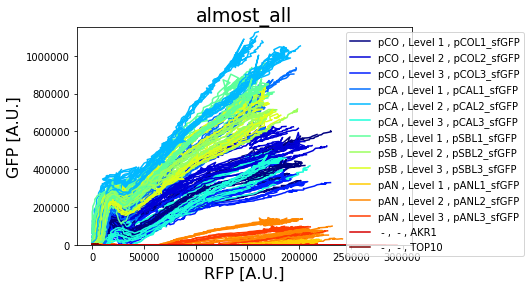

In [23]:
# chose the folder to save the plot
folder = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/'   
#folder = 'V4_Plots/Fluorescence/'

book_num = 0 # the book number chosen shouldn´t matters... is just to get the sheet name categories which should be the same for all

# Get the label cathegories
group_labels = get_dict_cathegories(s_data[book_cats[book_num]]['label_sheets'])


# Select the cathegories to take in account in the plot labels

#legend_labels = [ group_labels[1]]#, group_labels[2]]  --> by level
#legend_labels = [group_labels[2]]   # --> by plasmid
legend_labels = [ group_labels[2], group_labels[1], group_labels[0]]   # --> by both

#Chose valid data set cathegories to plot
xGroup = 'RFP'
yGroup = 'GFP'

# Plot definitions
title_dd= 'almost_all'  # choose a plot title
xlim = 250000
ylim = 1150000
datdat,well_labels = db_plot_dat_dat(s_data, xGroup, yGroup, '[A.U.]', '[A.U.]', legend_labels, title_dd, folder, [xlim,ylim])  # it is the plot of all datasets.
#datdat[book_cats[book_num]].shape

 #### Perform linear fit to obtain fluorescent expression ratio
 As we can see in the previous graph, GFP fluorescent expression follows a linear relation tendence against RFP (i.e. constant ratio)

[2.70684881e+00 4.04929739e+04]


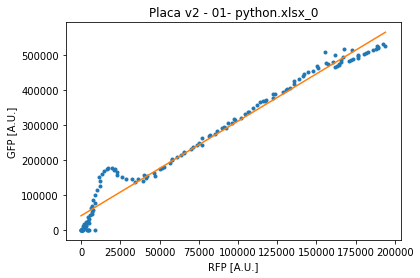

[3.27752917e+00 3.57190973e+04]


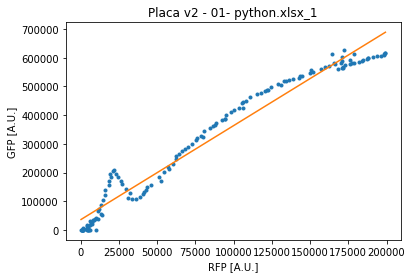

[2.55277965e+00 3.12505026e+04]


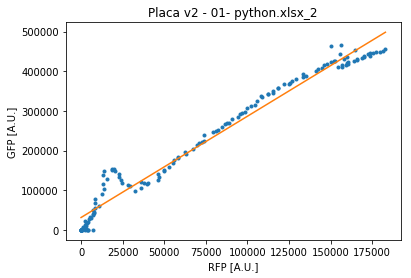

[2.90147220e+00 2.75843964e+04]


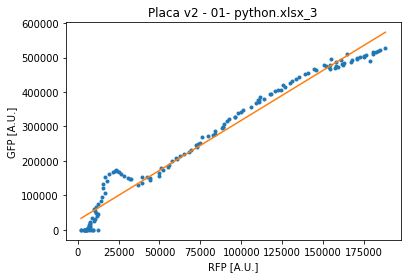

[3.26675397e+00 3.87020141e+04]


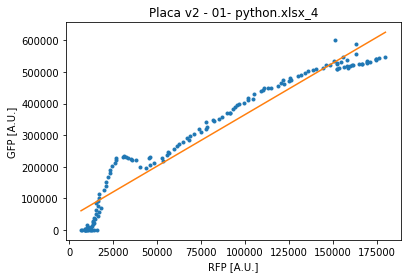

[2.15219693e+00 2.99074996e+04]


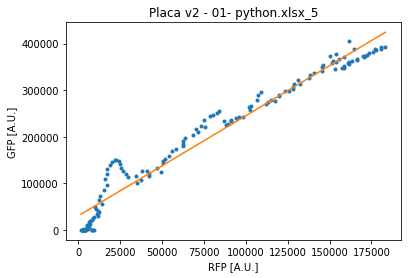

[2.74212074e+00 2.66298794e+04]


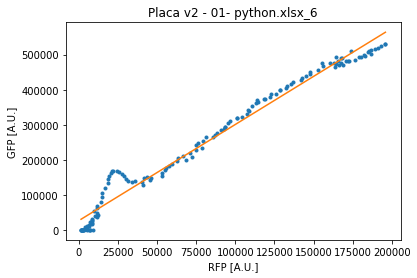

[3.41889344e+00 3.06043825e+04]


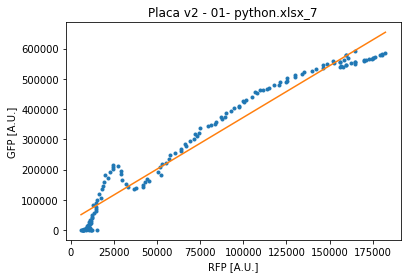

[2.59736731e+00 2.03150811e+04]


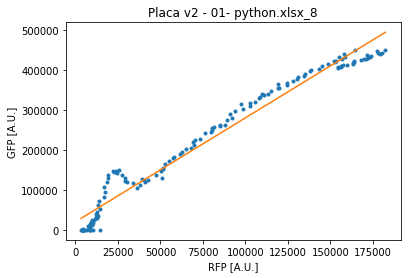

[2.84360916e+00 2.53281862e+04]


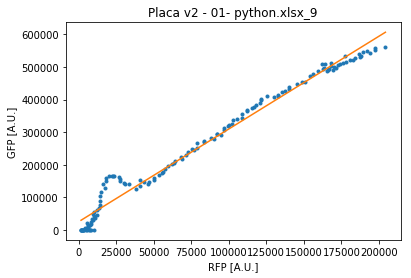

[3.48199932e+00 4.23446661e+04]


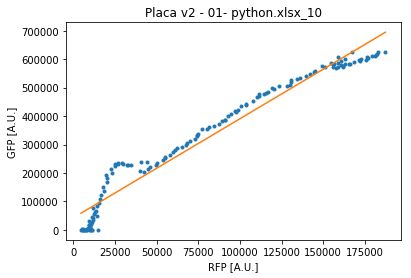

[2.73987265e+00 2.29285811e+04]


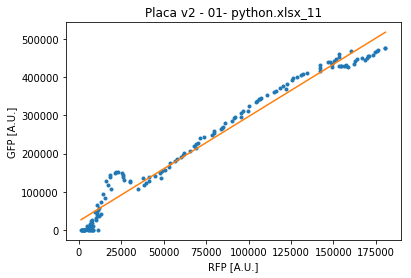

[2.60384158e+00 3.77602163e+04]


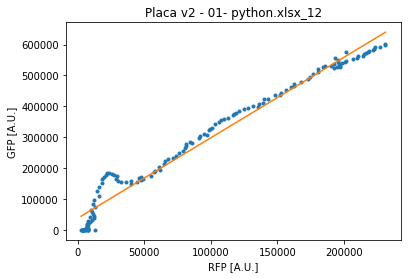

[3.35169735e+00 4.41563092e+04]


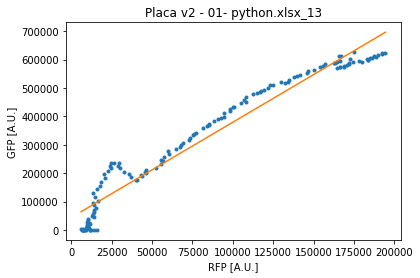

[2.67401595e+00 2.61610227e+04]


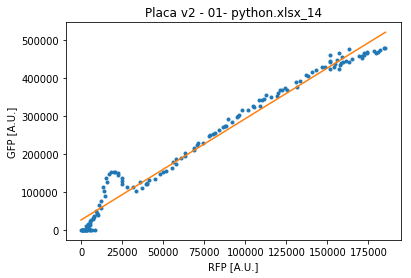

[2.72052676e+00 3.05854135e+04]


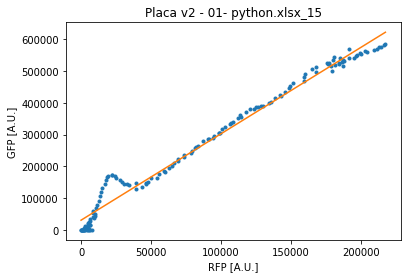

[3.27066296e+00 4.99935049e+04]


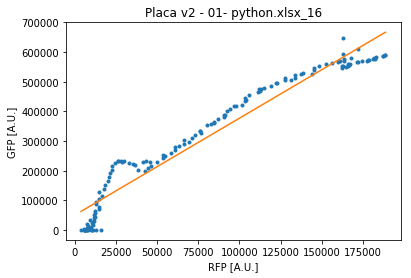

[2.56906658e+00 2.74357537e+04]


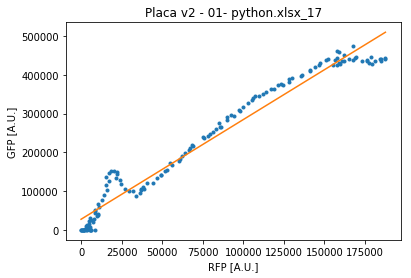

[4.96245913e+00 6.38140383e+04]


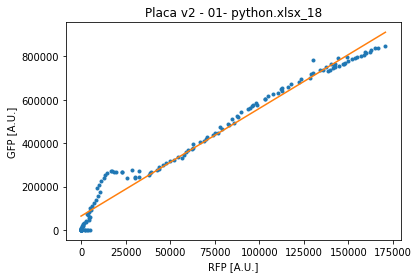

[6.47118569e+00 6.07308095e+04]


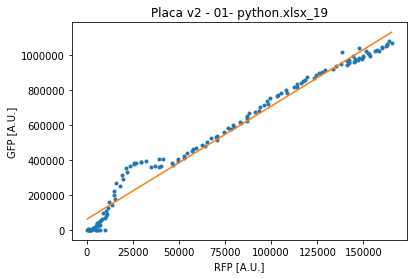

[ 3.00153286e+00 -2.18727612e+04]


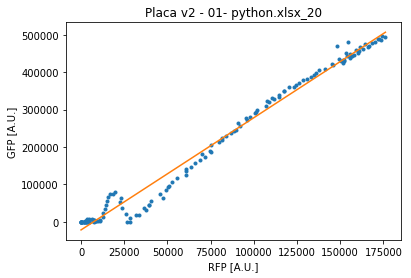

[4.99268868e+00 5.35044831e+04]


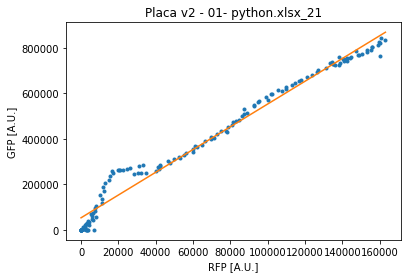

[7.11216755e+00 1.87609044e+04]


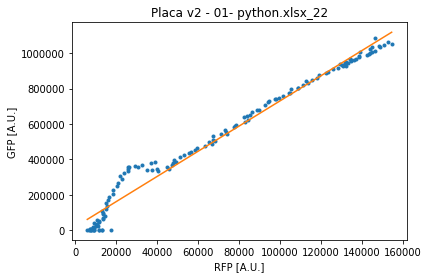

[ 3.00724143e+00 -3.06559336e+04]


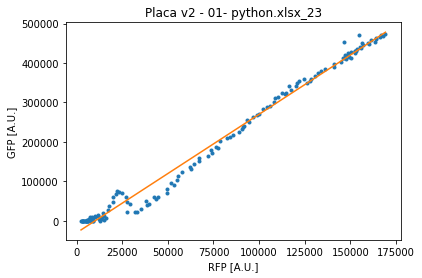

[4.96302969e+00 3.88931526e+04]


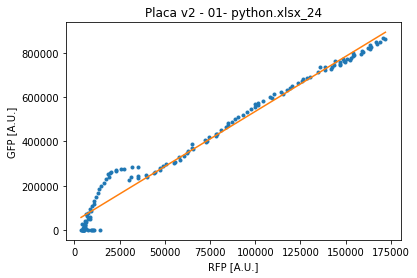

[6.92743325e+00 2.41230375e+04]


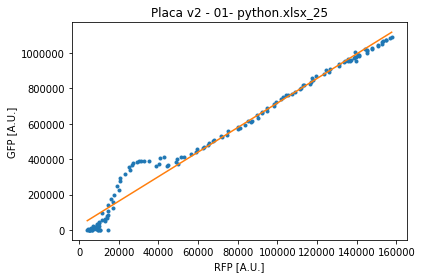

[ 3.01529496e+00 -1.47798975e+04]


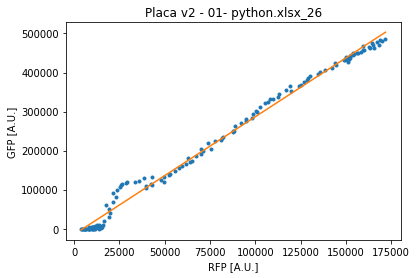

[4.65403777e+00 5.43464498e+04]


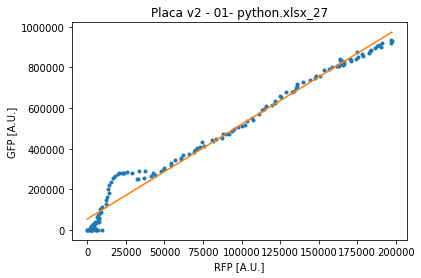

[   7.04926525 3627.98255485]


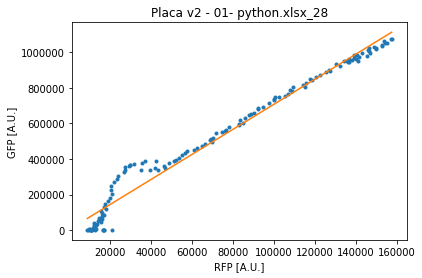

[ 2.97616973e+00 -1.71121457e+04]


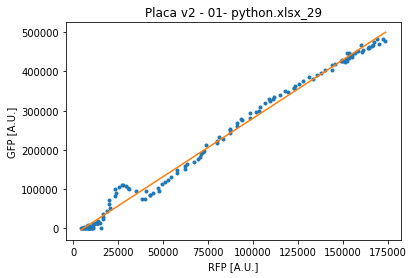

[4.72684411e+00 4.62071432e+04]


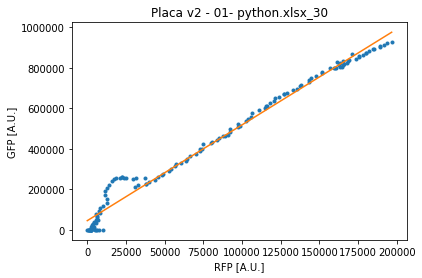

[7.00643313e+00 1.63095535e+04]


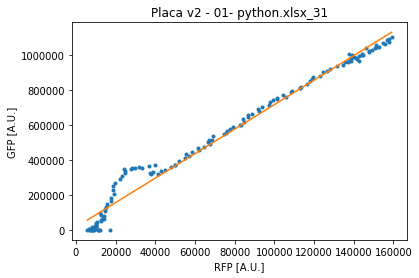

[ 2.88695083e+00 -1.31290173e+04]


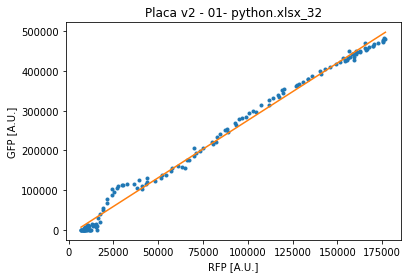

[4.60390187e+00 5.51658992e+04]


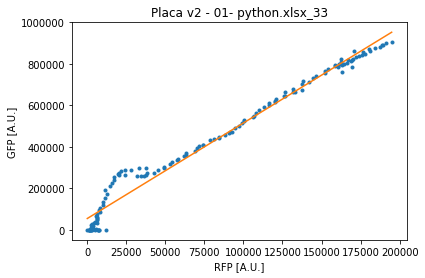

[7.09424005e+00 1.51006696e+04]


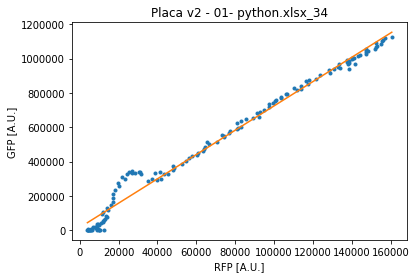

[ 2.98691948e+00 -1.00538241e+04]


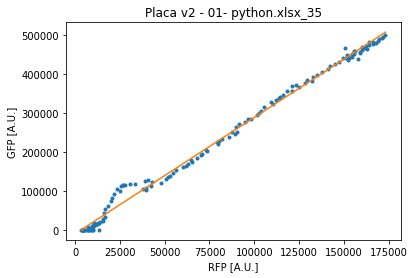

[5.88760536e+00 7.10277489e+04]


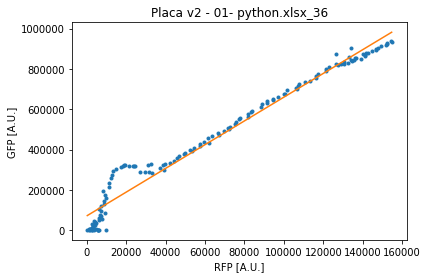

[4.88037501e+00 6.70431401e+04]


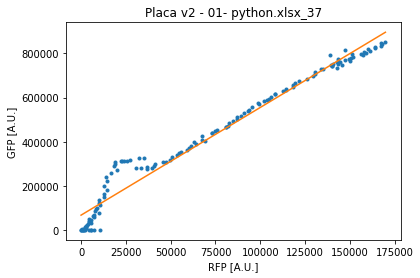

[4.72901805e+00 8.81049429e+04]


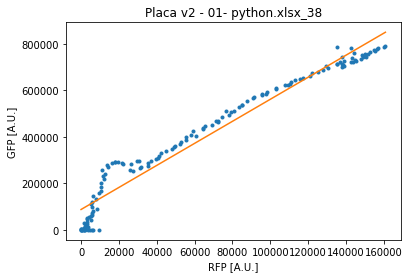

[5.85932124e+00 5.11179003e+04]


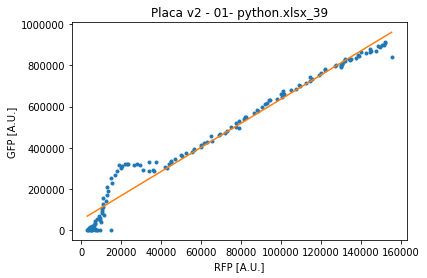

[5.04564623e+00 4.32871922e+04]


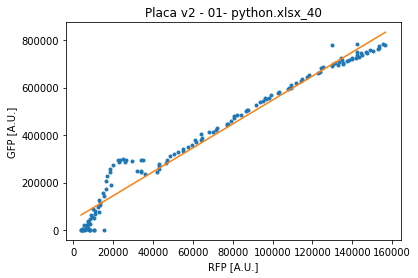

[4.61471159e+00 8.09823548e+04]


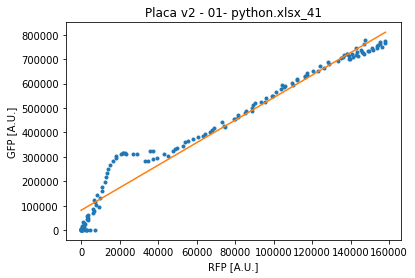

[5.80675271e+00 4.93739243e+04]


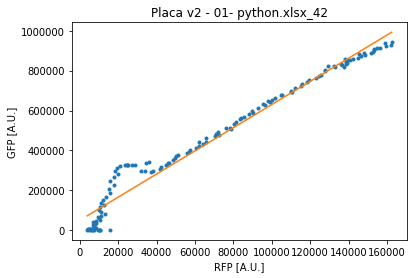

[5.16894131e+00 2.89679147e+04]


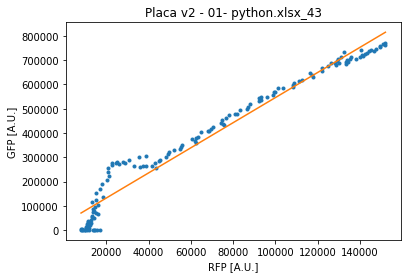

[4.64358762e+00 6.79669695e+04]


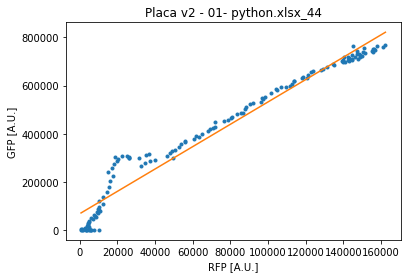

[5.49953841e+00 4.56868806e+04]


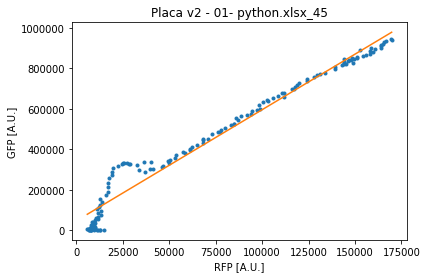

[5.10385624e+00 4.13577780e+04]


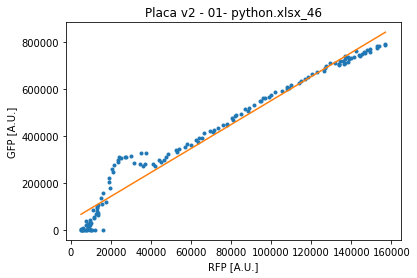

[4.60568203e+00 8.75756719e+04]


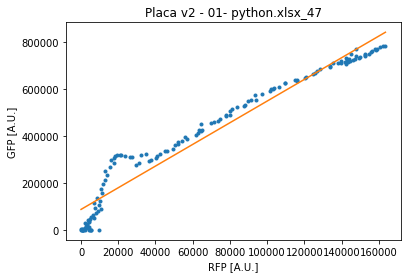

[5.62337037e+00 5.31470253e+04]


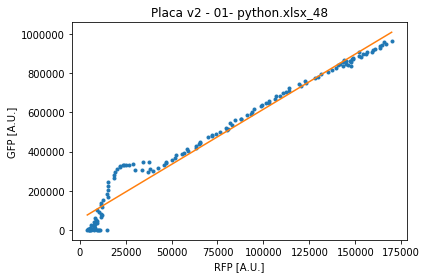

[4.98861705e+00 4.87605985e+04]


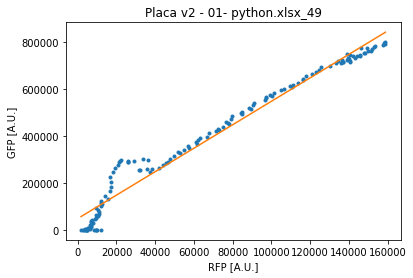

[4.81413382e+00 8.11415333e+04]


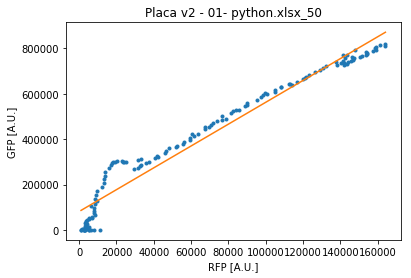

[5.38833469e+00 5.69297703e+04]


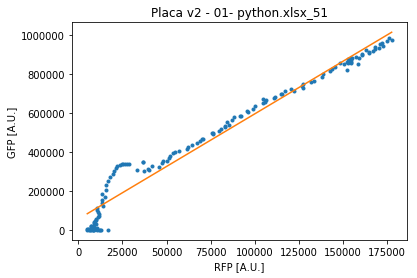

[4.91280057e+00 5.40052435e+04]


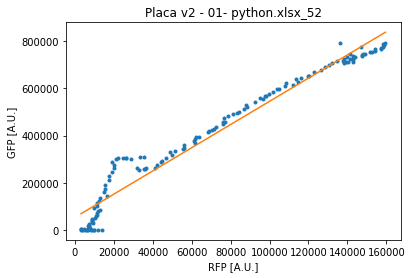

[4.70833959e+00 5.92343799e+04]


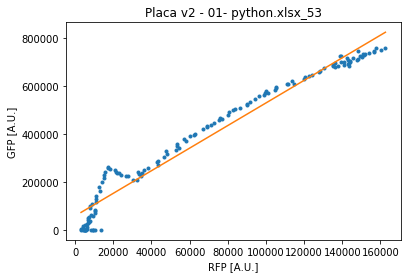

[ 2.14733119e-01 -6.37758356e+03]


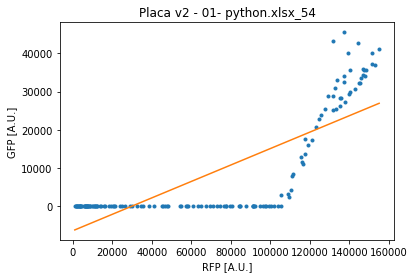

[ 7.62376109e-01 -1.72809900e+04]


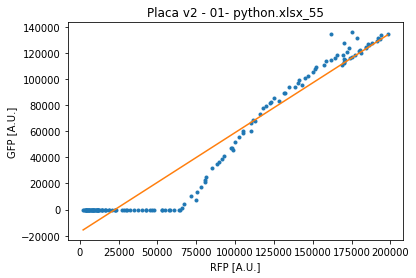

[ 4.20622951e-01 -9.01567208e+03]


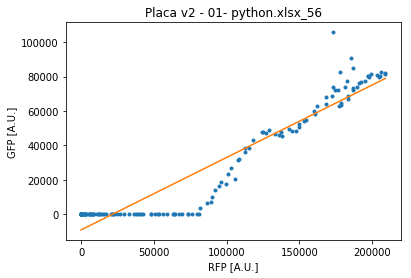

[9.16452968e-15 9.99999999e-01]


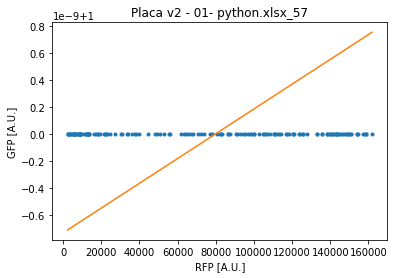

[ 7.68415555e-01 -2.02195701e+04]


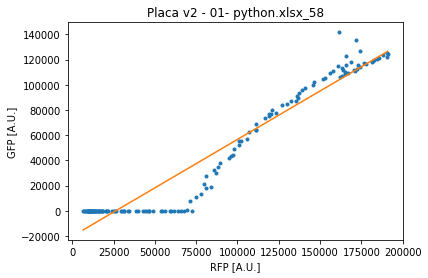

[ 4.55066208e-01 -1.03222575e+04]


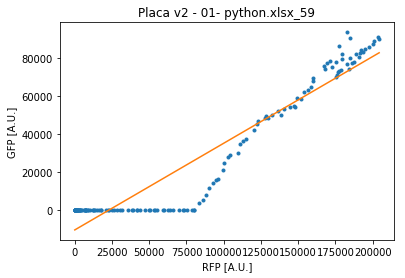

[7.75334336e-15 9.99999999e-01]


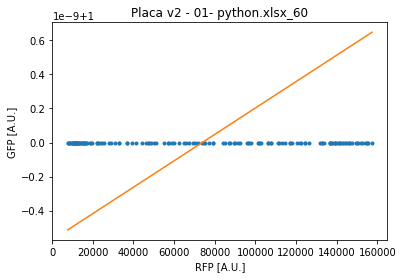

[ 7.31253372e-01 -1.91137140e+04]


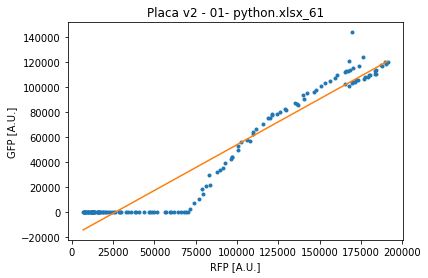

[ 4.94822054e-01 -1.02475376e+04]


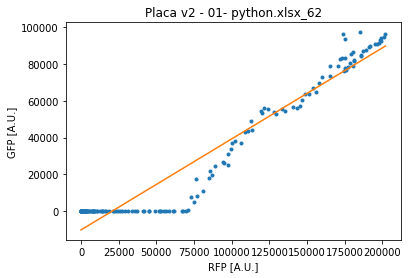

[-3.20672483e-15  1.00000000e+00]


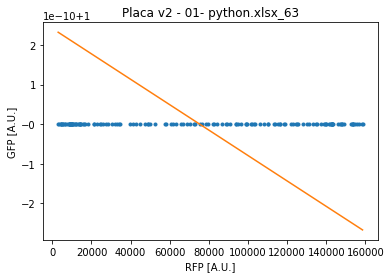

[ 8.15298082e-01 -2.13029012e+04]


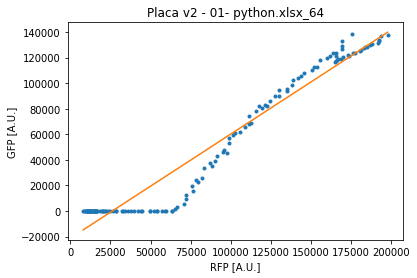

[ 5.02086879e-01 -1.03856613e+04]


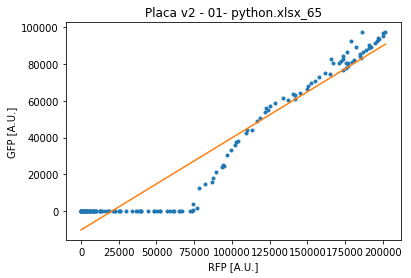

[ 9.32670379e-03 -3.61666173e+02]


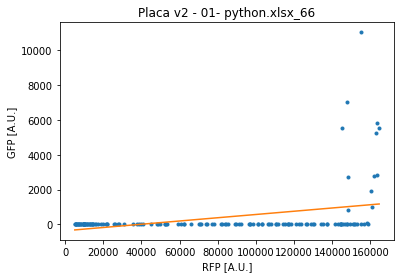

[ 7.47756799e-01 -1.79497268e+04]


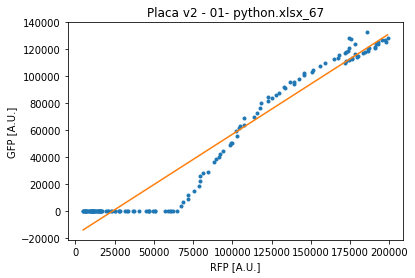

[ 4.50293765e-01 -1.07998395e+04]


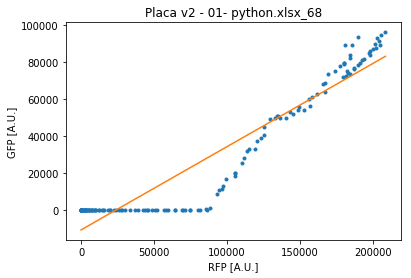

C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\minpack.py:785: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


[4.17833709e-17 1.00000000e+00]


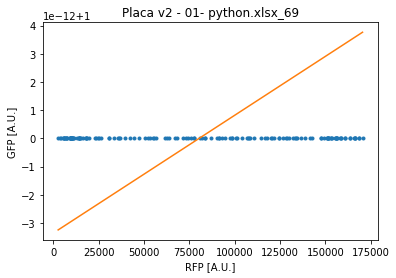

[ 7.60785961e-01 -1.77292139e+04]


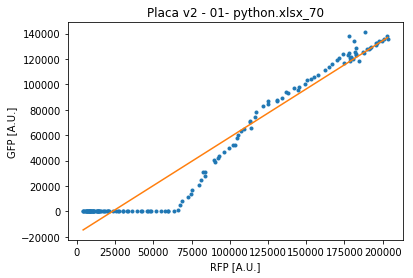

[ 4.60960700e-01 -9.89947079e+03]


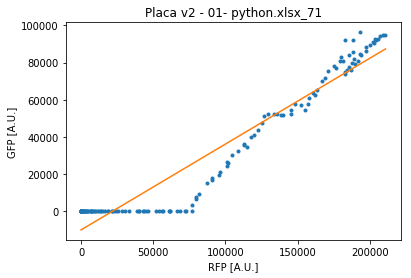

[1.80987058e-16 1.00000000e+00]


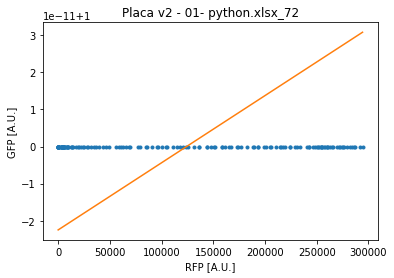

[-6.31676948e-15  1.00000000e+00]


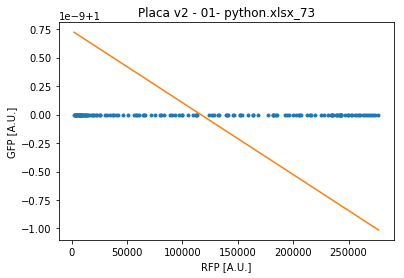

[-2.1096834e-15  1.0000000e+00]


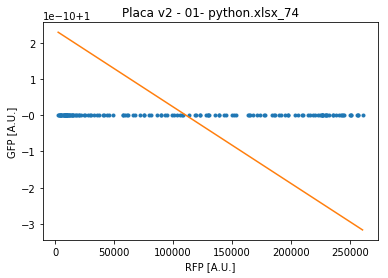

[4.45709449e-15 9.99999999e-01]


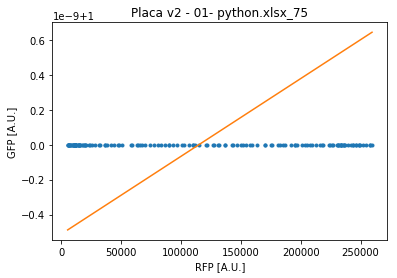

[5.49188657e-15 9.99999999e-01]


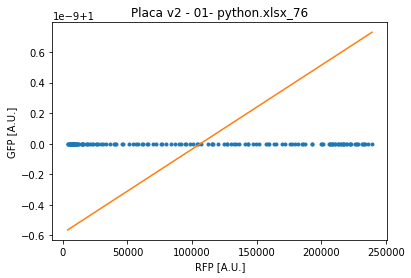

[5.97379066e-16 1.00000000e+00]


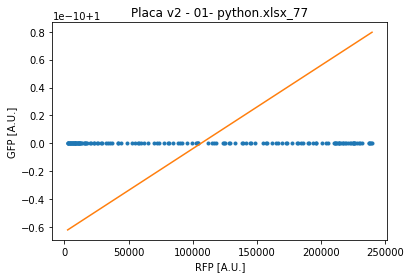

[-2.5100175e-13  1.0000000e+00]


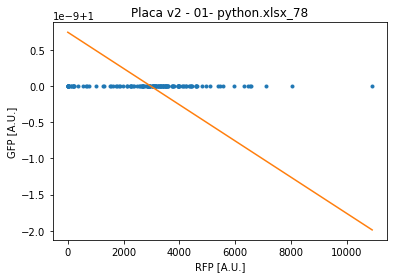

[-3.9982827e-13  1.0000000e+00]


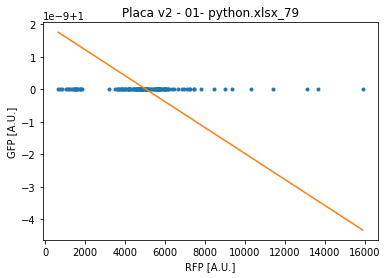

[-6.48120948e-14  1.00000000e+00]


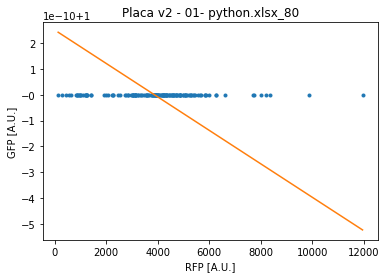

[-4.04726933e-13  1.00000000e+00]


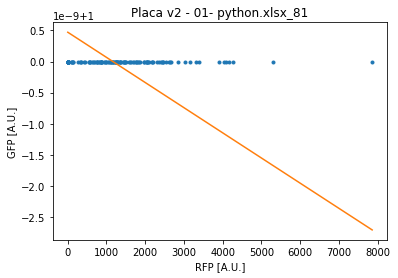

[-7.11138498e-13  1.00000000e+00]


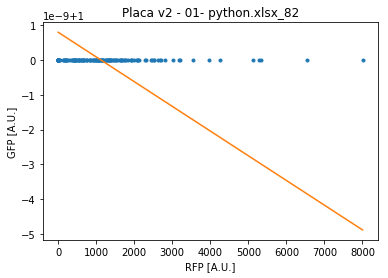

[1.30893891e-12 1.00000000e+00]


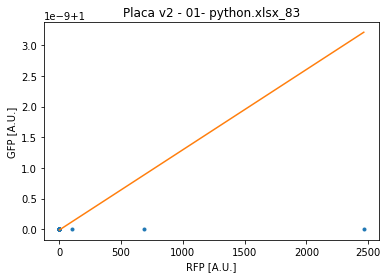

[1.93606105e+00 2.47034145e+04]


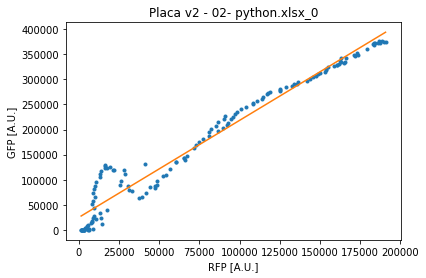

[1.86551283e+00 1.25010327e+04]


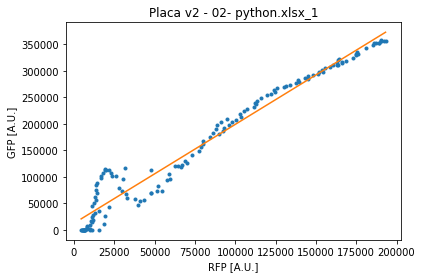

[2.37357044e+00 6.67718960e+04]


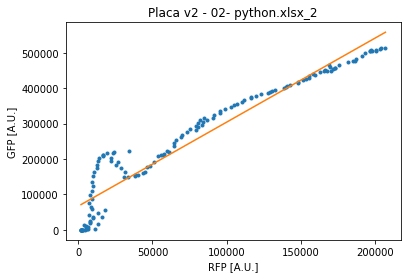

[1.90814922e+00 2.76959181e+04]


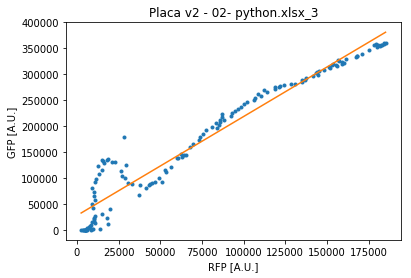

[1.81483989e+00 1.37535257e+04]


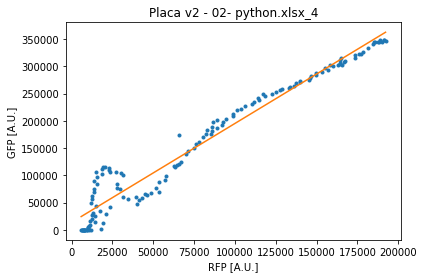

[2.36327367e+00 6.72945193e+04]


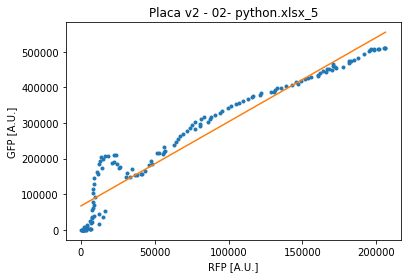

[1.84103566e+00 3.40788292e+04]


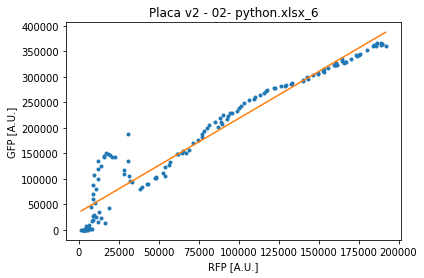

[1.88702472e+00 7.83787842e+03]


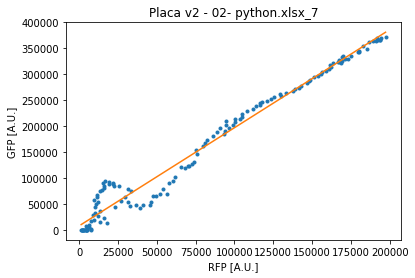

[2.33041040e+00 6.79441602e+04]


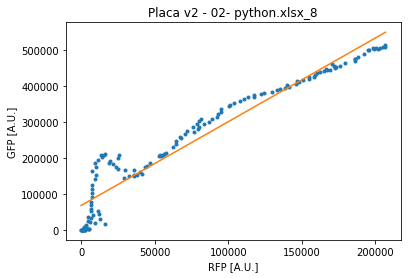

[1.75046916e+00 2.61195389e+04]


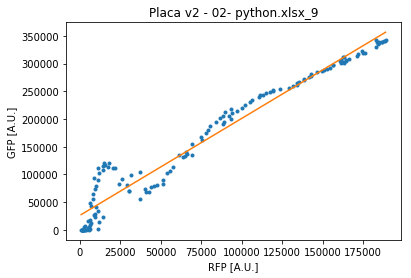

[1.74265211e+00 1.54001395e+04]


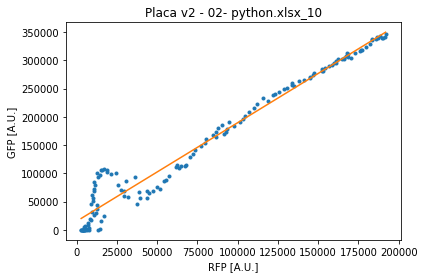

[2.15176313e+00 6.66223508e+04]


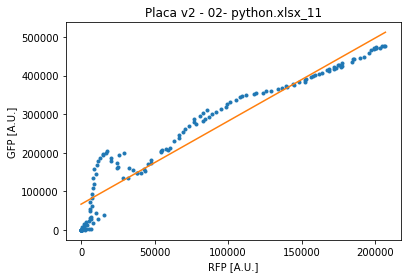

[1.58317462e+00 2.39178711e+04]


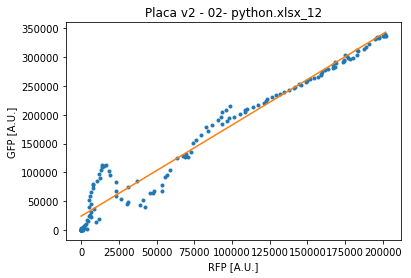

[1.79978339e+00 2.79623493e+04]


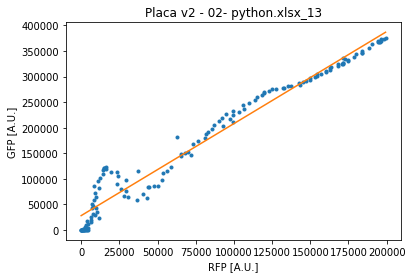

[2.26948811e+00 7.85396130e+04]


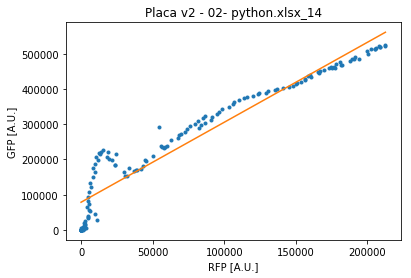

[1.51412939e+00 3.58773594e+04]


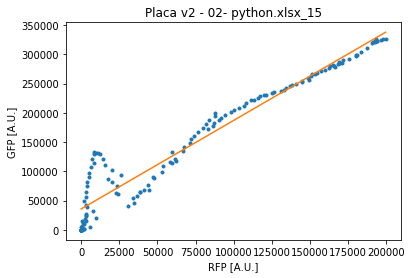

[1.33199289e+00 3.12990726e+04]


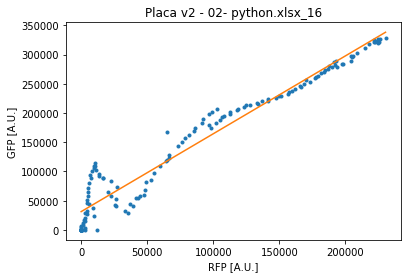

[2.14050153e+00 6.17946575e+04]


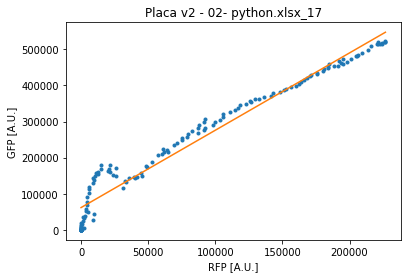

[3.90252794e+00 2.24934109e+04]


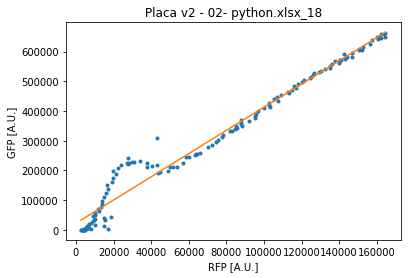

[ 2.24552559e+00 -1.41511714e+04]


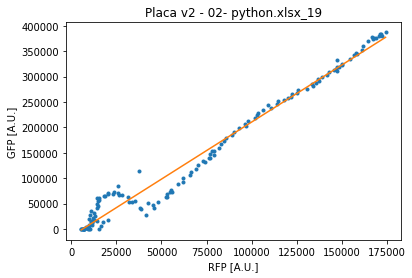

[5.15953791e+00 1.04985617e+05]


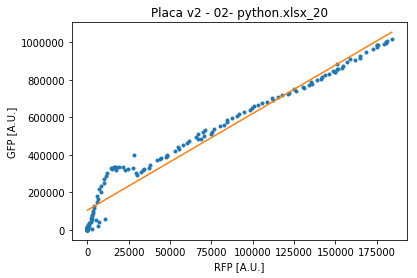

[4.18942101e+00 8.01312911e+03]


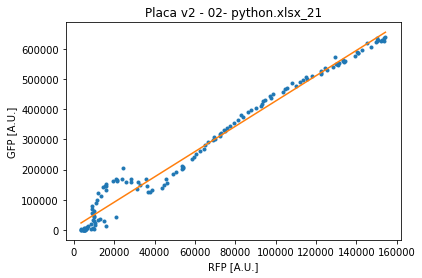

[ 2.17339554e+00 -1.90645771e+04]


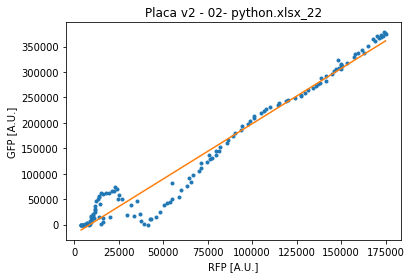

[5.11825655e+00 1.11513806e+05]


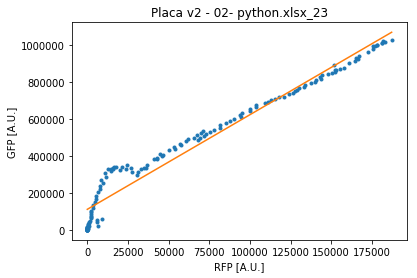

[4.01915150e+00 3.90492301e+04]


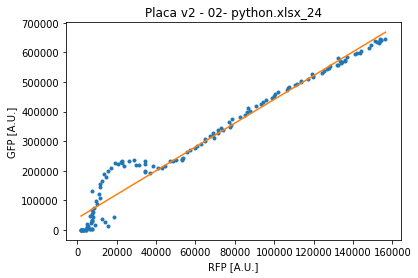

[ 2.12135552e+00 -1.24509761e+04]


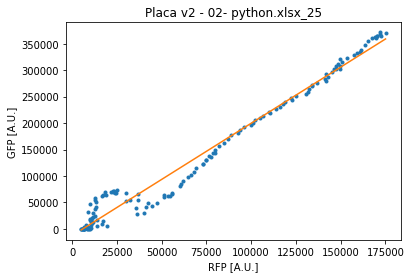

[5.02982840e+00 1.13253279e+05]


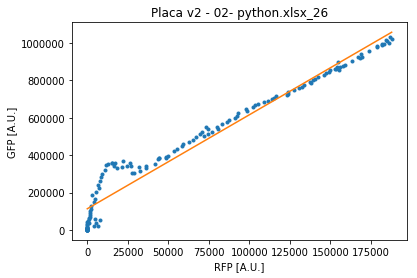

[3.95801876e+00 2.96350233e+04]


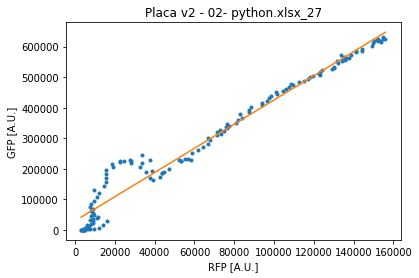

[ 2.16812003e+00 -1.23382416e+04]


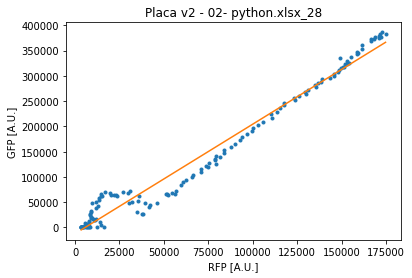

[4.91363222e+00 1.19198882e+05]


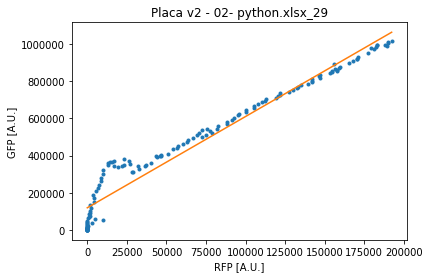

[3.50339590e+00 4.31339497e+04]


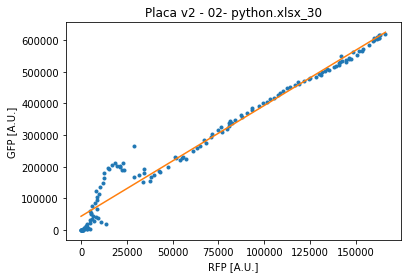

[    2.24846753 -1987.19000894]


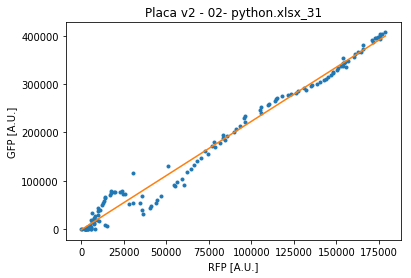

[4.99712213e+00 1.07842032e+05]


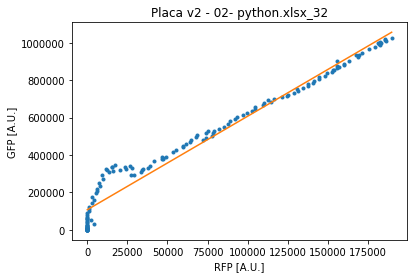

[3.39856468e+00 5.84726765e+04]


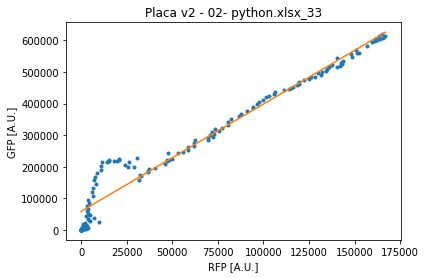

[1.82955497e+00 3.09558608e+03]


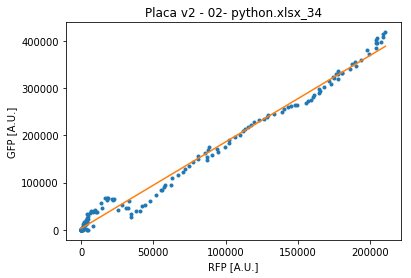

[4.79591404e+00 1.22258627e+05]


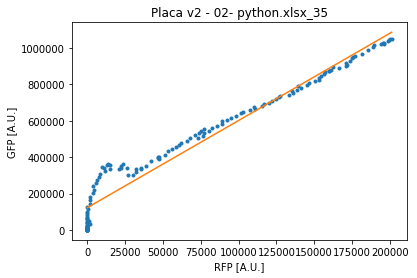

[4.32768456e+00 7.47204751e+04]


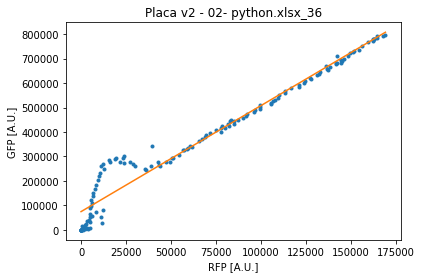

[4.03775276e+00 4.15495083e+04]


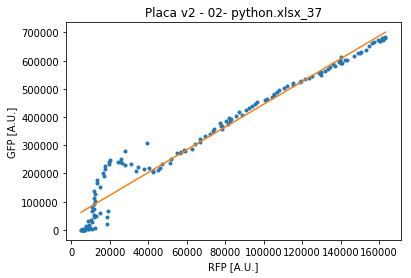

[3.91799787e+00 4.22057549e+04]


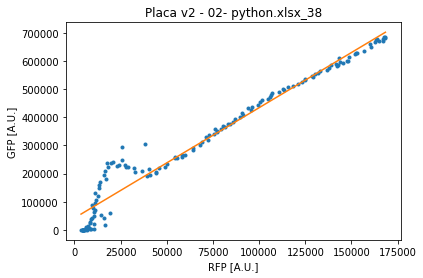

[4.43475155e+00 7.72047061e+04]


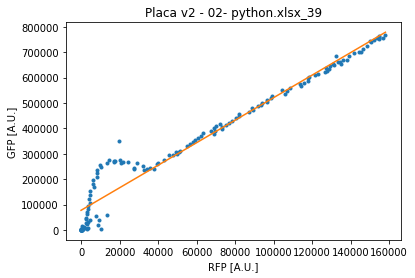

[3.92135085e+00 3.42722439e+04]


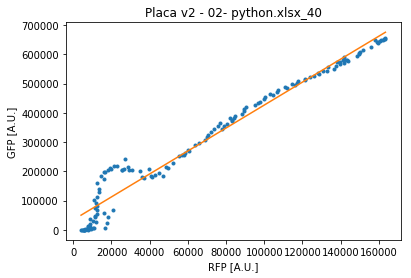

[3.85810966e+00 5.81769354e+04]


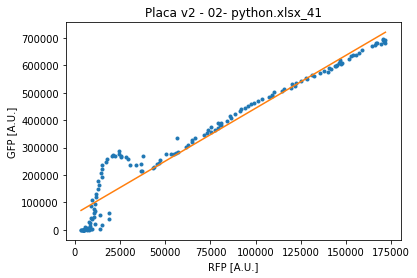

[4.24947315e+00 8.76159595e+04]


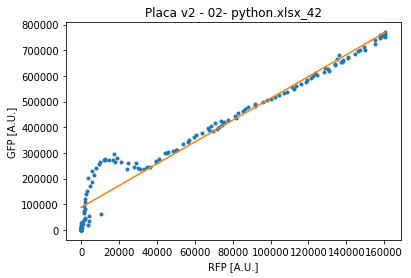

[3.81394772e+00 3.53550840e+04]


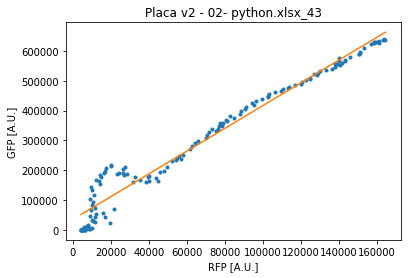

[3.83176251e+00 5.50560349e+04]


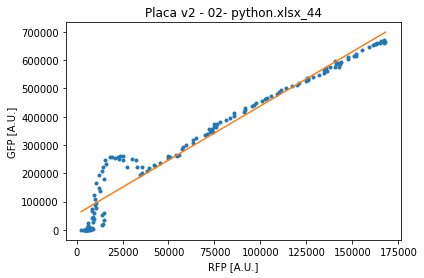

[4.14425213e+00 8.50592273e+04]


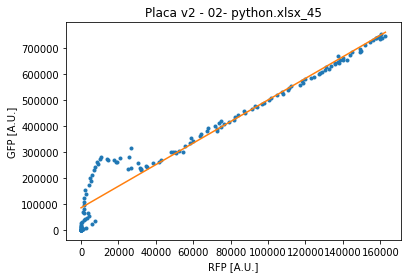

[3.69197454e+00 5.71153896e+04]


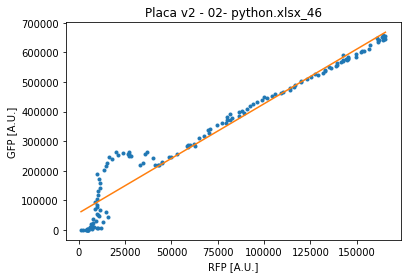

[3.69729570e+00 6.19380598e+04]


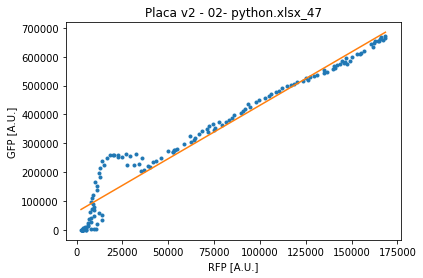

[4.02356554e+00 8.95346797e+04]


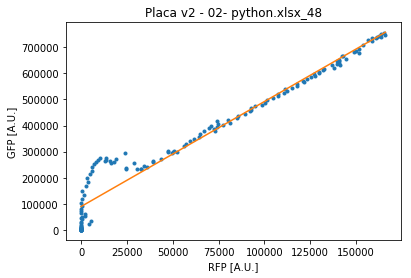

[3.60828109e+00 6.92003042e+04]


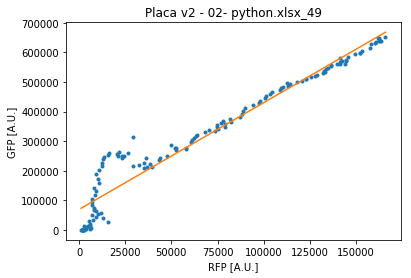

[3.72497702e+00 6.44963790e+04]


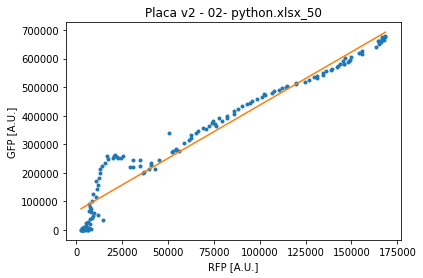

[4.02662461e+00 9.55827176e+04]


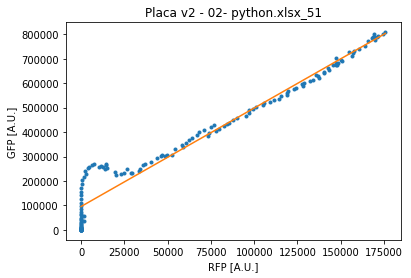

[3.21830632e+00 8.20116303e+04]


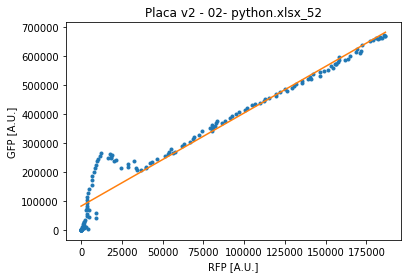

[3.34623601e+00 6.00384573e+04]


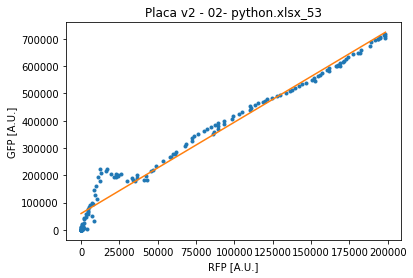

[8.74301682e-16 1.00000000e+00]


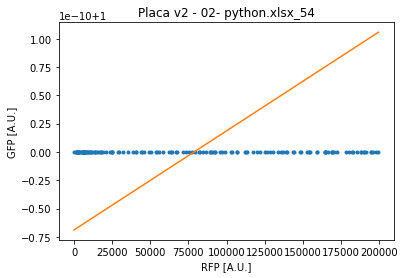

[ 7.43587772e-02 -3.28815817e+03]


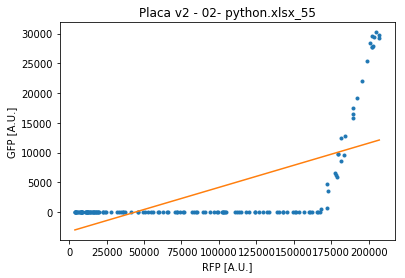

[ 2.50797136e-01 -9.13010193e+03]


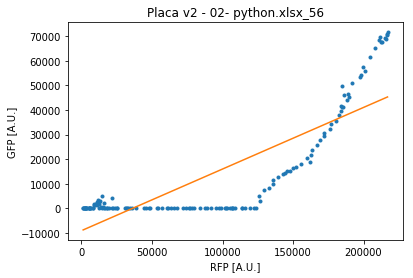

[-3.81949528e-15  1.00000000e+00]


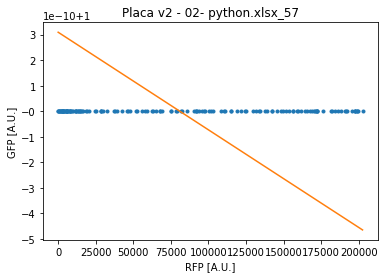

[ 7.77801550e-02 -3.44391211e+03]


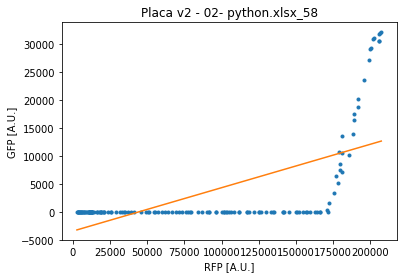

[ 1.8508628e-01 -6.5180733e+03]


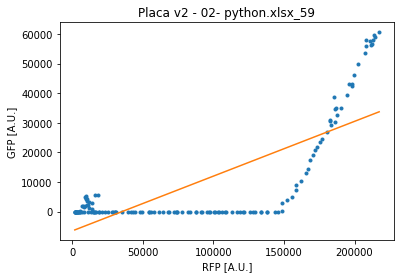

[1.52795677e-15 1.00000000e+00]


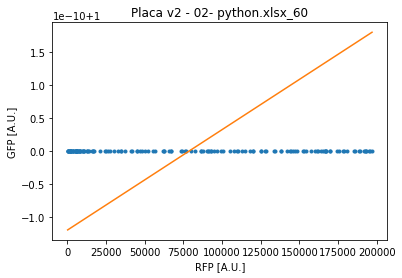

[ 1.51079843e-01 -6.19133114e+03]


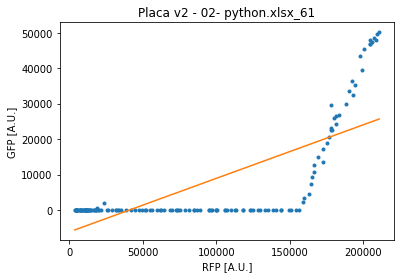

[ 1.37686493e-01 -4.27429117e+03]


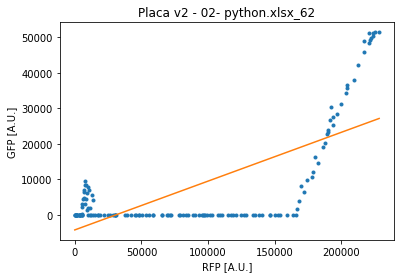

[-3.26052061e-15  1.00000000e+00]


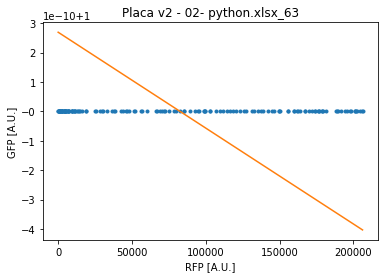

[ 1.13958614e-01 -4.71230465e+03]


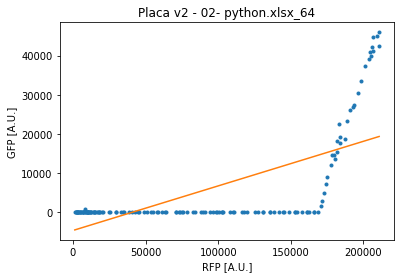

[ 1.73895559e-01 -6.13211011e+03]


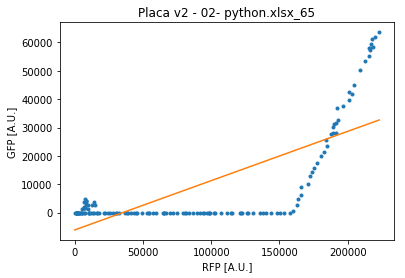

[-2.32788598e-15  1.00000000e+00]


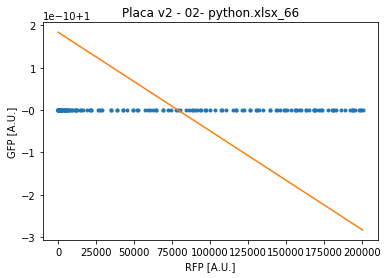

[ 2.12136078e-01 -8.56846879e+03]


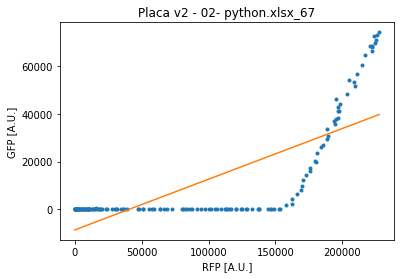

[ 3.30142373e-01 -1.08674404e+04]


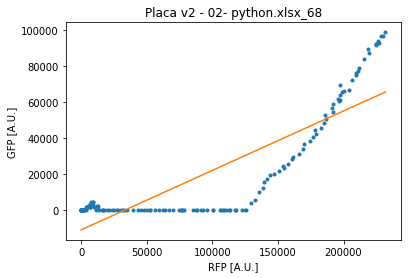

[-2.93679778e-15  1.00000000e+00]


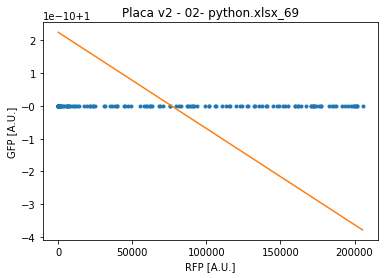

[-5.2343999e-05  1.0246333e+01]


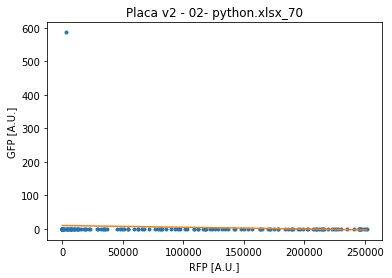

[ 6.73521337e-02 -2.53645357e+03]


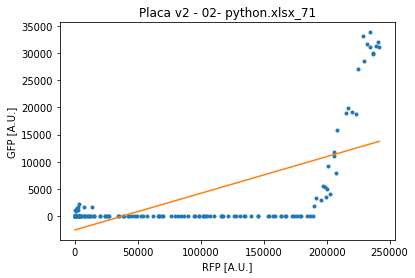

[-6.81697475e-16  1.00000000e+00]


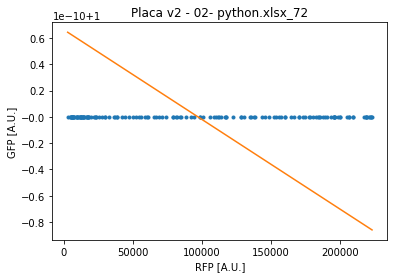

[1.54528163e-14 9.99999998e-01]


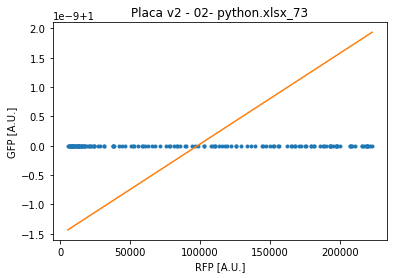

[-8.40840136e-15  1.00000000e+00]


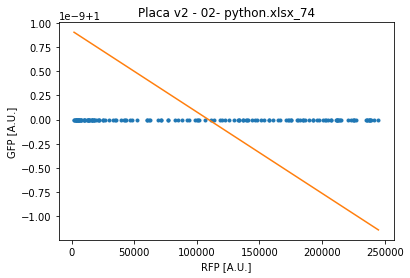

[1.42027993e-14 9.99999999e-01]


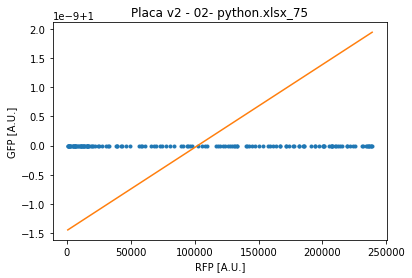

[1.67432092e-15 1.00000000e+00]


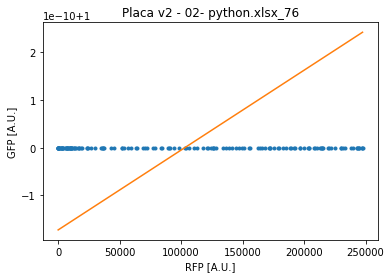

[5.88391211e-15 9.99999999e-01]


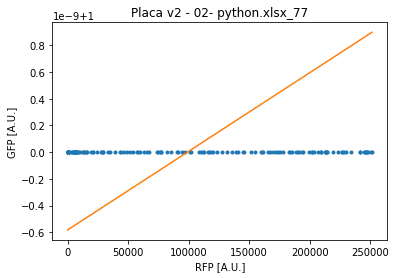

[-7.93933424e-14  1.00000000e+00]


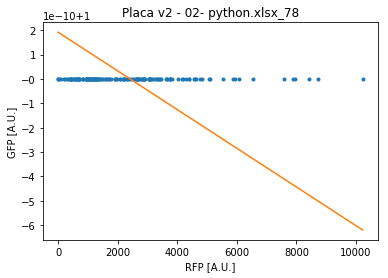

[-1.30851595e-13  1.00000000e+00]


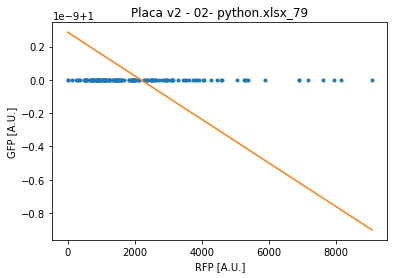

[-1.77041799e-13  1.00000000e+00]


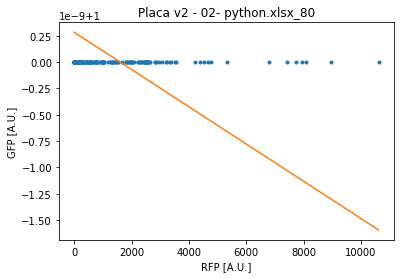

[-2.02487836e-13  1.00000000e+00]


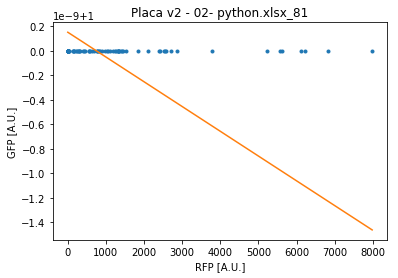

[-2.80713583e-13  1.00000000e+00]


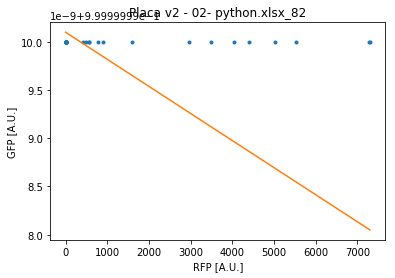

[2.595871e-14 1.000000e+00]


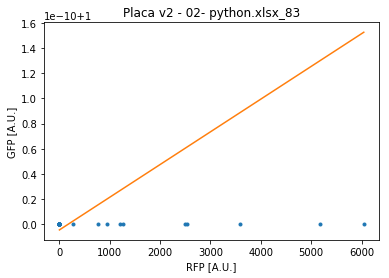

[2.3912173e+00 1.6183751e+04]


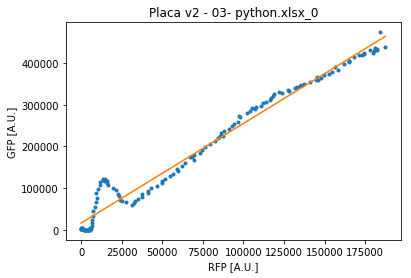

[   2.45296283 -451.21665456]


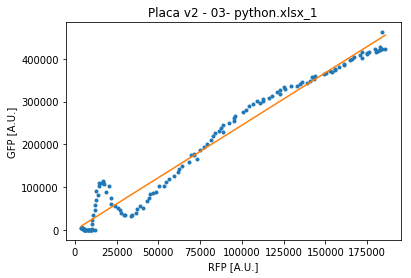

[2.63001744e+00 5.26885953e+04]


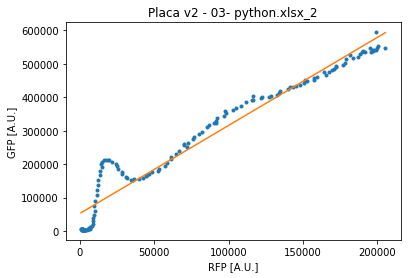

[2.06443698e+00 2.77035477e+03]


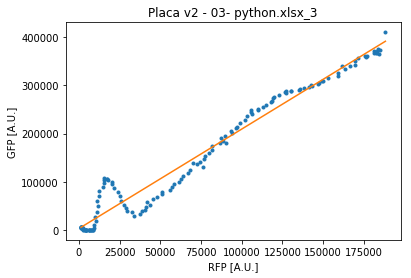

[ 2.41880652e+00 -6.91805452e+03]


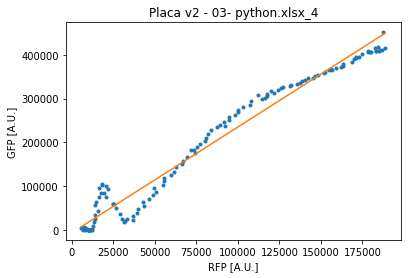

[3.00899721e+00 2.06875516e+04]


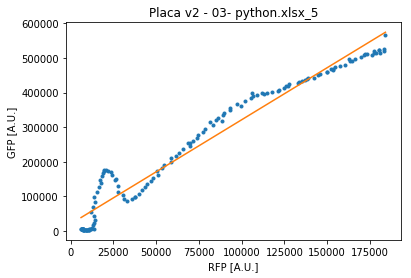

[1.89054619e+00 3.01743403e+03]


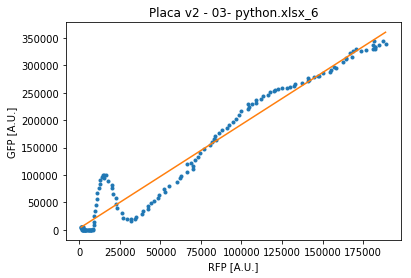

[2.36701749e+00 9.86448551e+03]


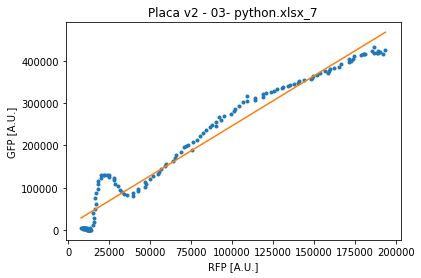

[3.05181259e+00 2.96904929e+04]


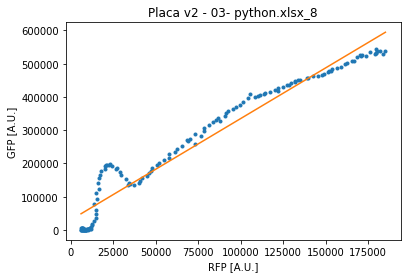

[1.63251665e+00 3.65422508e+03]


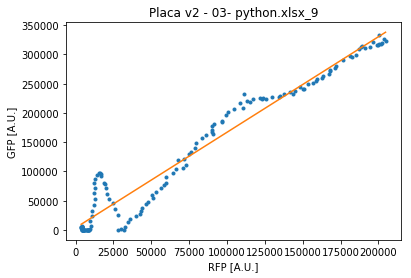

[ 2.33289705e+00 -6.86156210e+03]


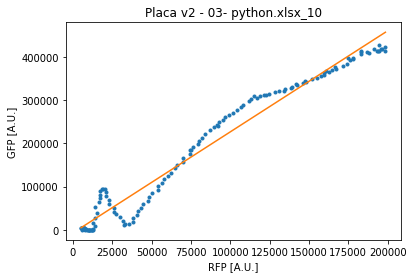

[2.72011612e+00 4.26001564e+04]


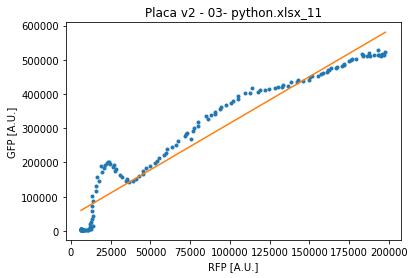

[   1.60431611 -360.88627826]


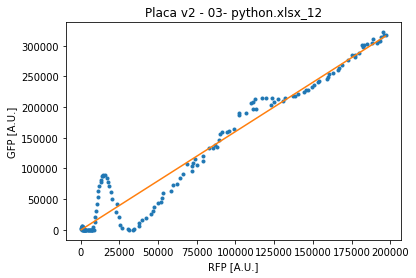

[2.26378728e+00 1.00294880e+04]


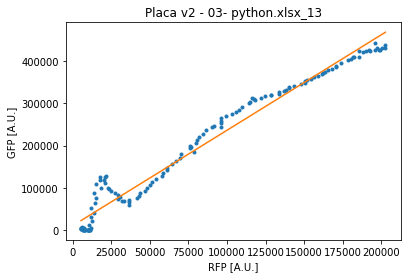

[2.59267578e+00 4.92314760e+04]


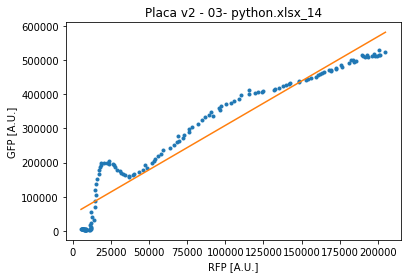

[1.56805654e+00 5.70017831e+03]


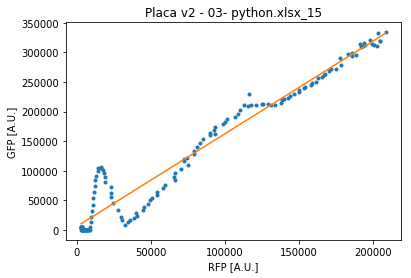

[2.16358984e+00 8.38781893e+03]


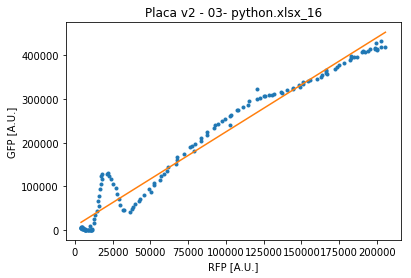

[2.62084149e+00 5.68519642e+04]


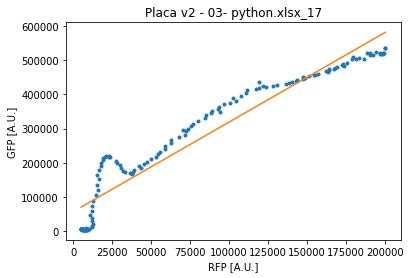

[ 2.75994282e+00 -2.92026990e+04]


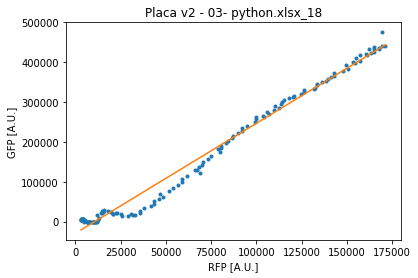

[4.77950056e+00 3.02478377e+04]


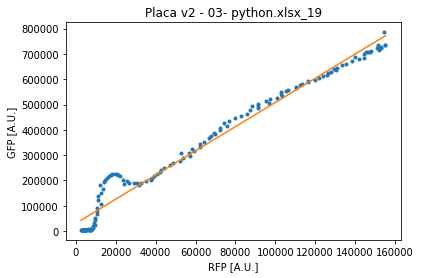

[5.72444759e+00 5.40565355e+04]


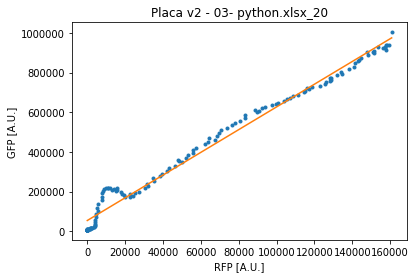

[ 2.75380111e+00 -4.03992292e+04]


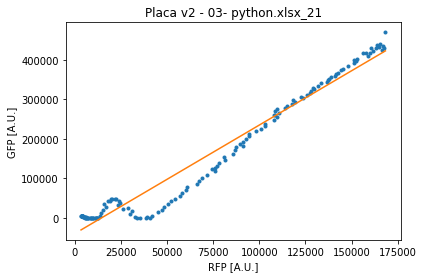

[   4.65904134 4266.01752647]


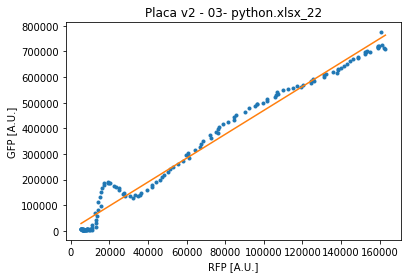

[5.42358497e+00 6.34466438e+04]


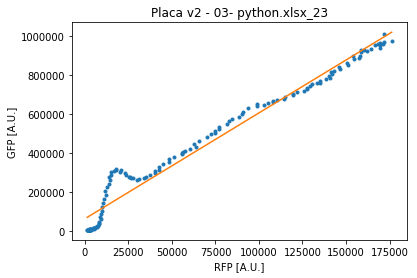

[ 2.68783145e+00 -3.28359601e+04]


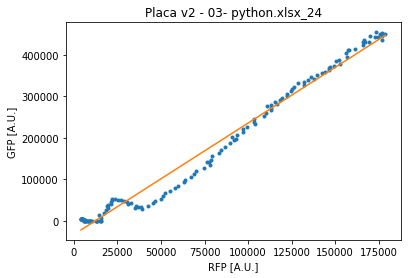

[4.56540601e+00 1.84761235e+04]


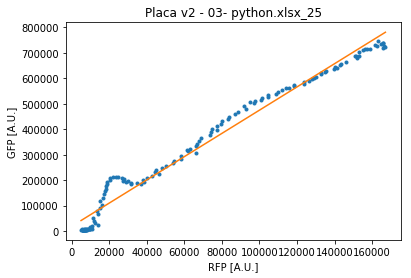

[5.44644100e+00 7.21887781e+04]


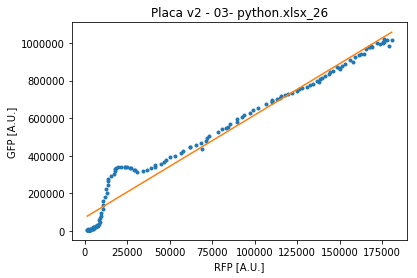

[ 2.61178852e+00 -2.54361123e+04]


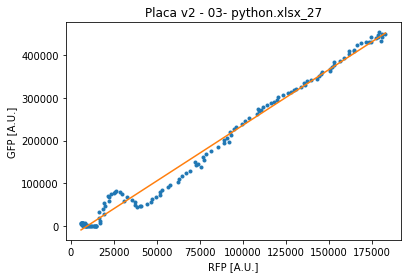

[4.66985388e+00 2.85305463e+04]


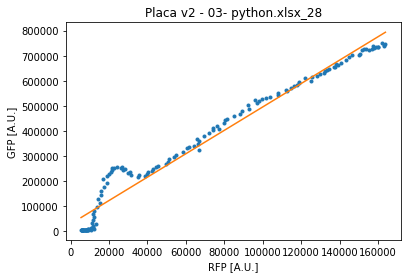

[5.50753237e+00 6.26253562e+04]


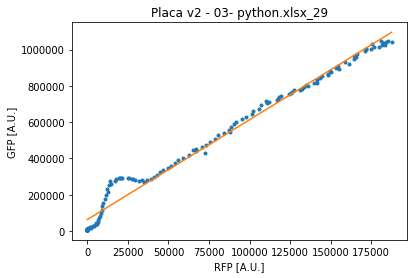

[ 2.51736036e+00 -1.60824072e+04]


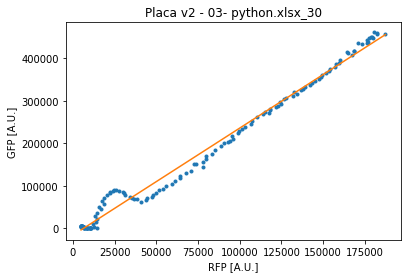

[4.66374913e+00 1.36455541e+04]


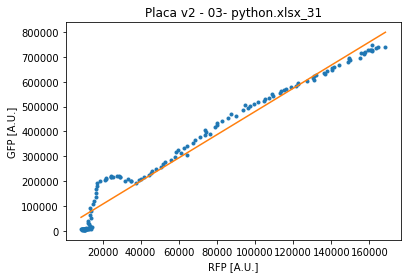

[5.34531434e+00 5.74271797e+04]


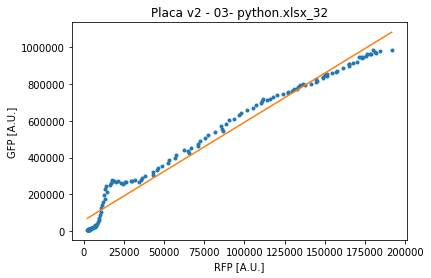

[ 2.20308458e+00 -2.25825045e+04]


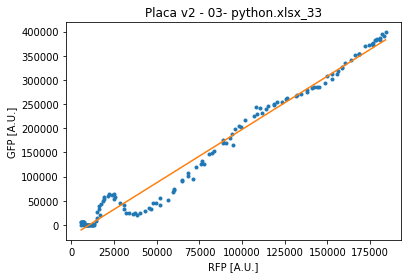

[4.59167227e+00 3.43281067e+04]


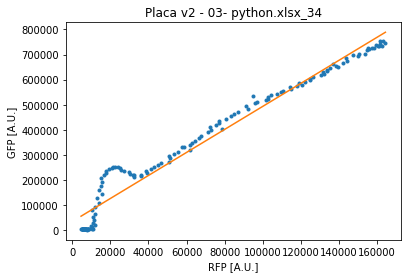

[5.38778862e+00 5.43191577e+04]


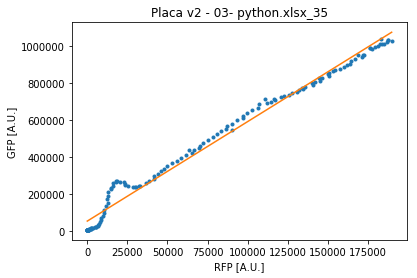

[4.51673540e+00 5.69990499e+04]


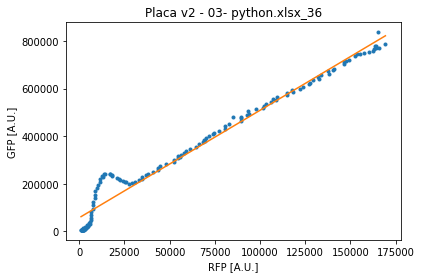

[5.33320002e+00 3.69253442e+04]


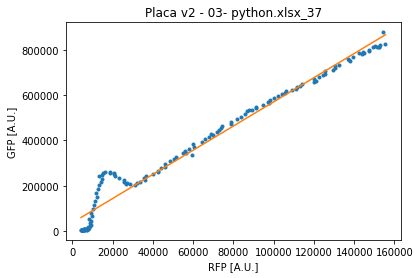

[4.19592901e+00 6.63472515e+04]


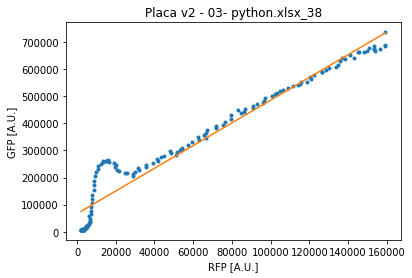

[4.58842394e+00 4.30287386e+04]


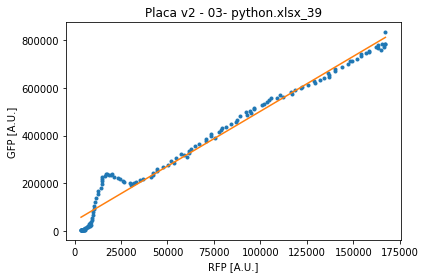

[5.06499447e+00 2.90301861e+04]


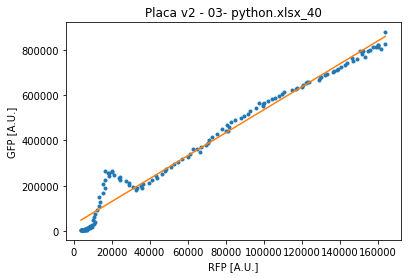

[4.47669776e+00 4.59164977e+04]


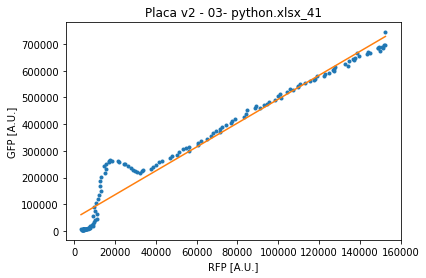

[4.32805066e+00 2.52587475e+04]


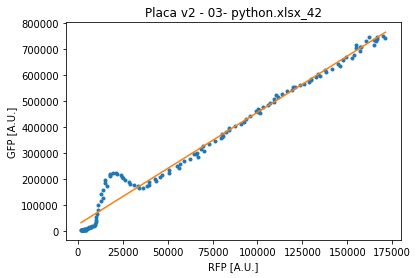

[5.21172797e+00 2.54749542e+04]


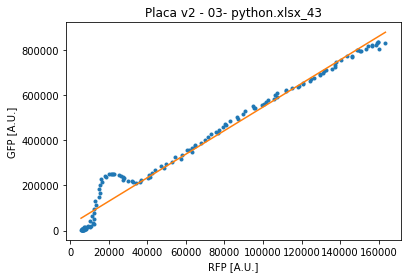

[4.19110751e+00 4.58014160e+04]


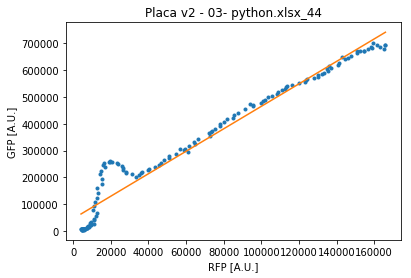

[3.96113578e+00 3.58361299e+04]


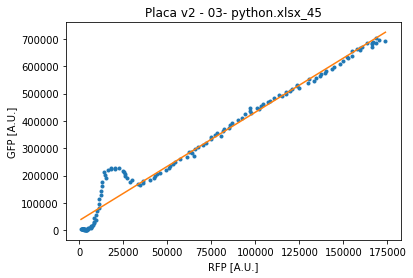

[   5.39487925 3056.66606892]


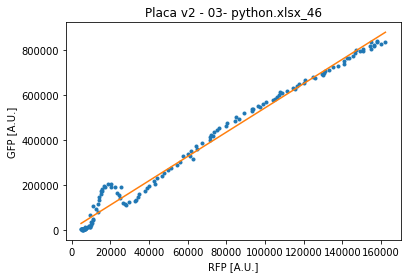

[4.32022915e+00 5.63195194e+04]


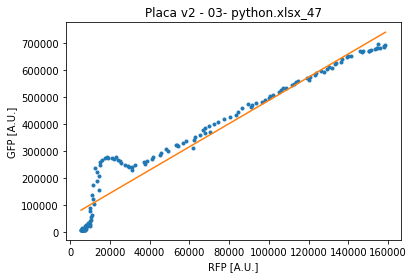

[3.65112316e+00 3.75867381e+04]


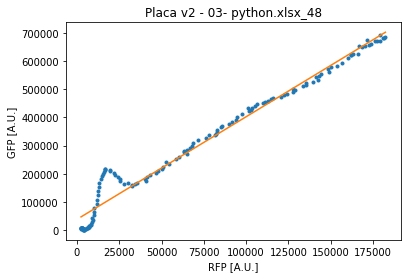

[4.99466373e+00 4.89639241e+04]


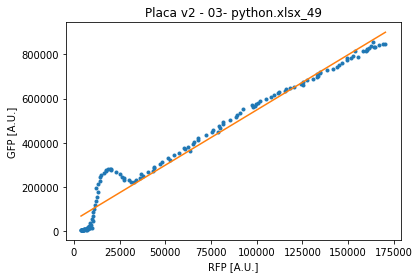

[3.95010744e+00 5.60468535e+04]


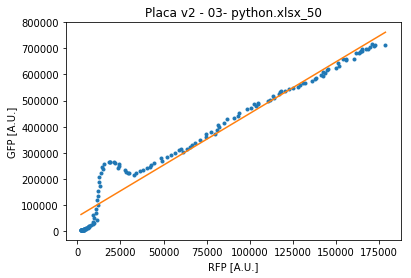

[3.79668565e+00 3.78768897e+04]


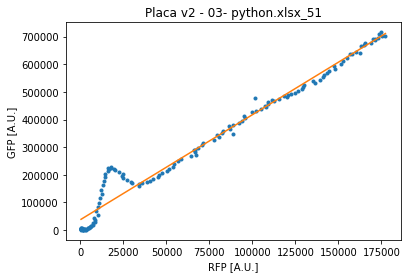

[4.99950243e+00 3.98461533e+04]


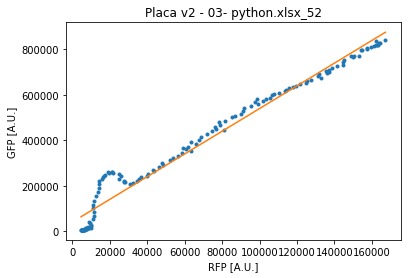

[4.33700364e+00 6.38489987e+04]


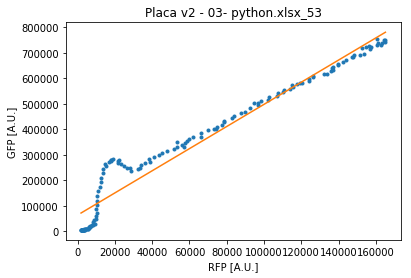

[ 1.92125717e-01 -5.86608398e+03]


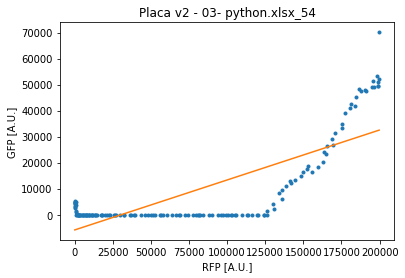

[ 9.77551197e-02 -2.81964602e+03]


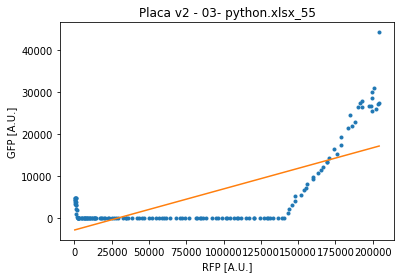

[ 1.14033322e-01 -3.44448079e+03]


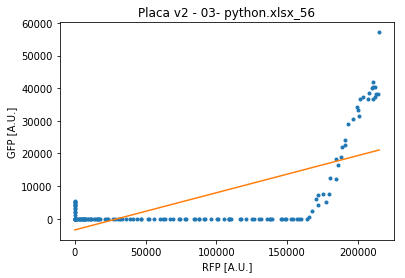

[ 3.00055805e-01 -9.06806847e+03]


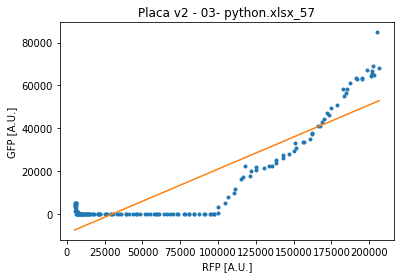

[9.08269120e-03 1.08116363e+02]


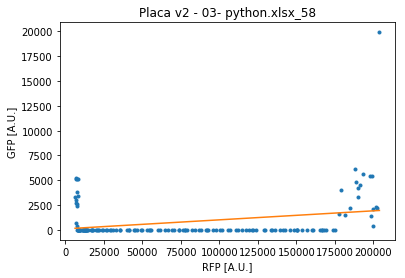

[ 1.55482452e-01 -4.74710887e+03]


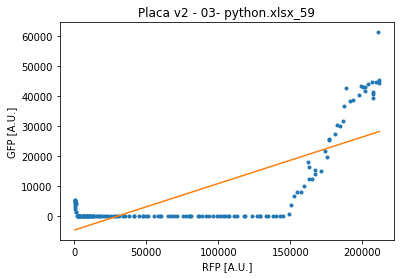

[ 2.44674161e-01 -8.21651142e+03]


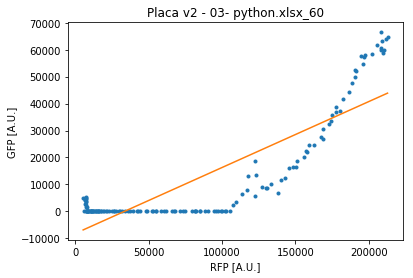

[ 7.36512733e-02 -2.16846102e+03]


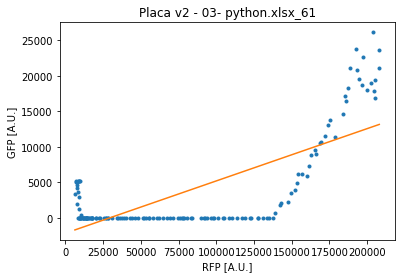

[ 3.25992356e-01 -9.36915718e+03]


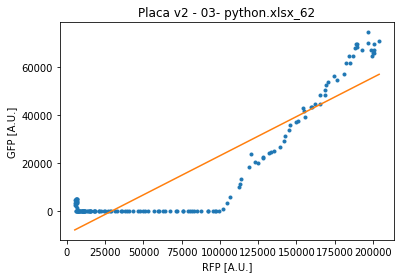

[ 0.00882537 -5.57497844]


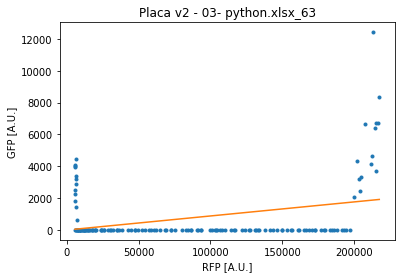

[ 5.37147274e-02 -1.66249582e+03]


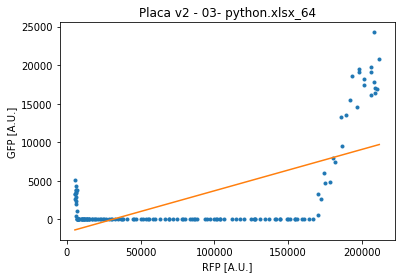

[ 3.20052084e-01 -9.89270079e+03]


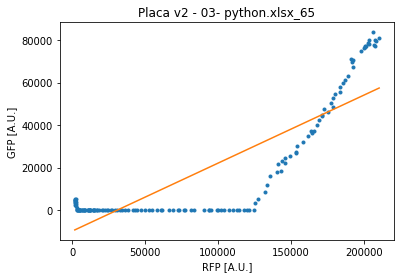

[-3.89815651e-03  5.93361928e+02]


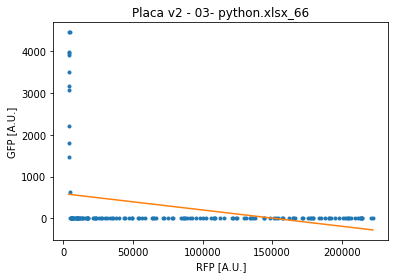

[ 2.64656028e-02 -5.50896460e+02]


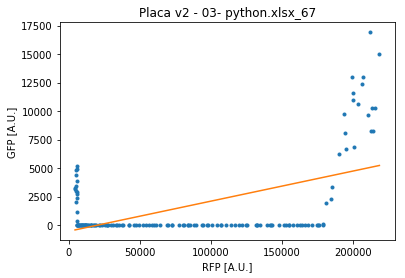

[ 3.03862762e-01 -8.59528444e+03]


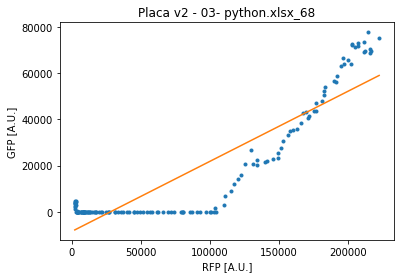

[-4.99956826e-03  7.54979580e+02]


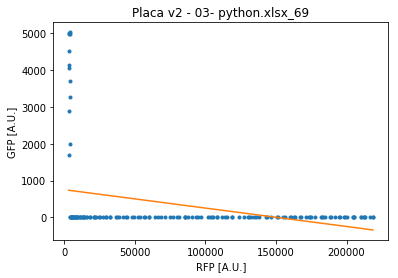

[ 5.89891703e-02 -1.91965370e+03]


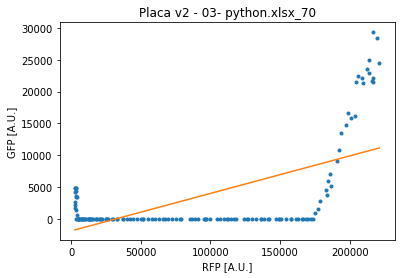

[ 3.73782368e-01 -9.66889886e+03]


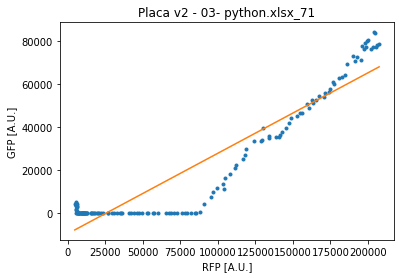

[-3.27847731e-03  6.39087467e+02]


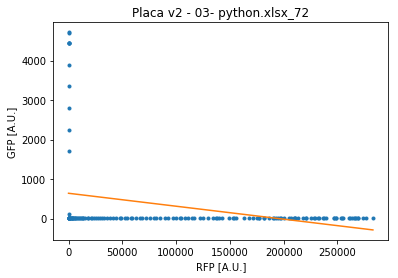

[-3.84377165e-03  6.94128800e+02]


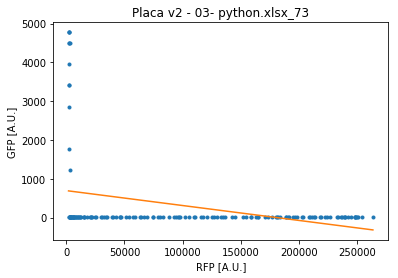

[-2.62253937e-03  4.70772991e+02]


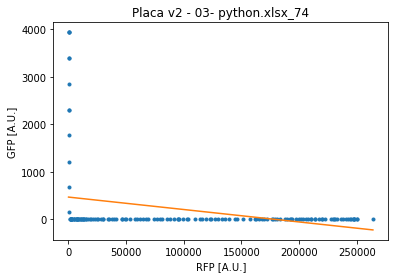

[-3.53555722e-03  6.40035309e+02]


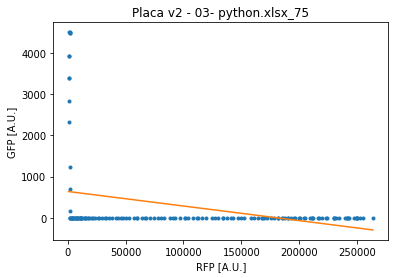

[-3.59653926e-03  6.24019461e+02]


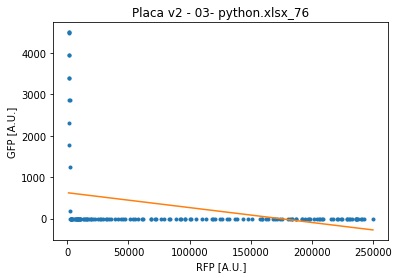

[-1.46111356e-03  2.65260637e+02]


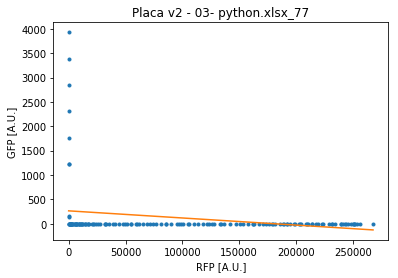

[-2.21462990e-01  2.63408611e+02]


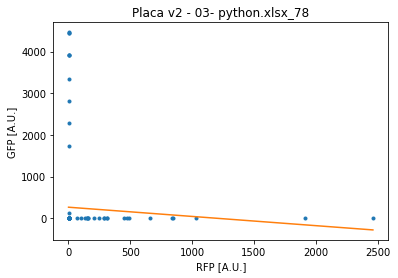

[  0.33873911 -44.09887598]


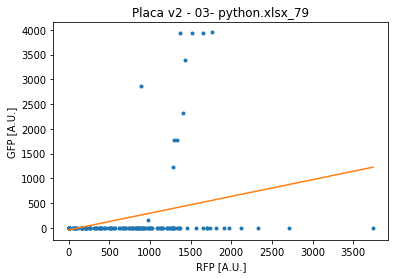

[ 4.75110796e-01 -1.26735098e+03]


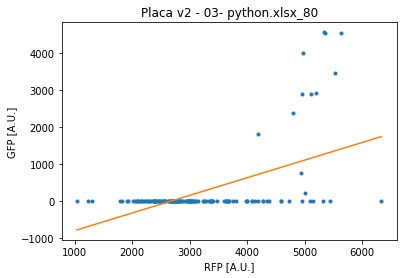

[-5.64313019e-02  3.31993456e+02]


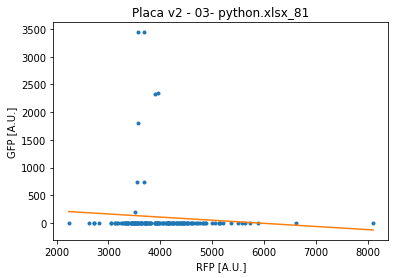

[-5.74208992e-02  3.01597581e+02]


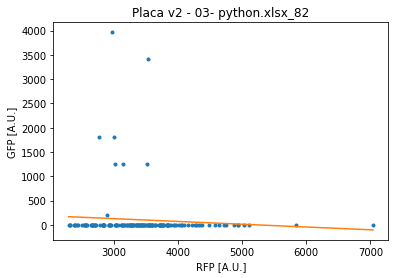

[-3.23941844e-14  1.00000000e+00]


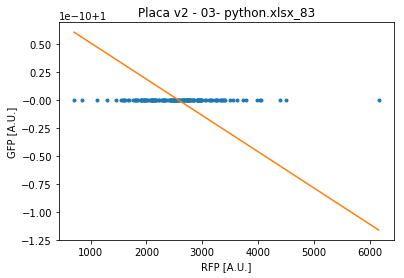

In [24]:

pg0 = [1, 0]
xGroup = 'RFP'
yGroup = 'GFP'
fit_name = xGroup+'_'+yGroup+'_linear'

data_sets = list(s_data.keys())

ro_list = []

for sets in data_sets:
    s_data[sets]['fit'] = {}
    x_vals = s_data[sets]['data_sheets'][xGroup]['data']
    y_vals = s_data[sets]['data_sheets'][yGroup]['data']
    
    set_fit = np.zeros([x_vals.shape[1],2])
    
    for i in range(x_vals.shape[1]):

        x_vals_i = x_vals[:,i]
        y_vals_i = y_vals[:,i]

        line = function_fit(x_vals_i, y_vals_i, init=0, end=x_vals.shape[0], func= f_line, param0 = pg0, param_bounds = ([-np.inf, -np.inf],[np.inf, np.inf]))
        set_fit[i,:] = line['z'][0]
        ro_list.append(line['z'][0][0])

        plt.plot(x_vals_i, y_vals_i,'.')

        x_to_fit = np.linspace(x_vals_i.min(),x_vals_i.max(), 5)
        plt.plot(x_to_fit, f_line(x_to_fit, *line['z'][0]),'-')
        plt.ylabel('GFP [A.U.]')
        plt.xlabel('RFP [A.U.]')
        plt.title(sets+'_'+str(i))
        plt.show()
    
    s_data[sets]['fit'][fit_name] = set_fit 

Next block is used to make the graphs with the format shown in the supplementary information (i.e. all with the same axis range)

In [44]:
# s_data[data_sets[0]]['fit']['RFP_GFP_linear'][i,0]  ## is equal to ro_list[i]

2.5527796483838108

Next block is used to make the graphs with the format shown in the supplementary information (i.e. all with the same axis range)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


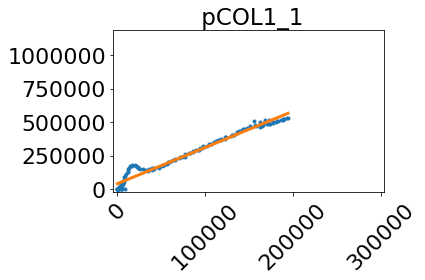

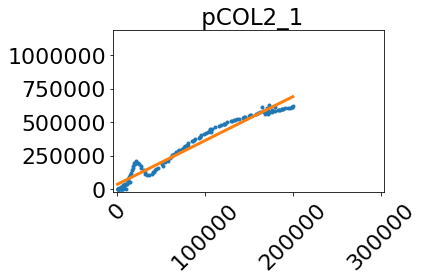

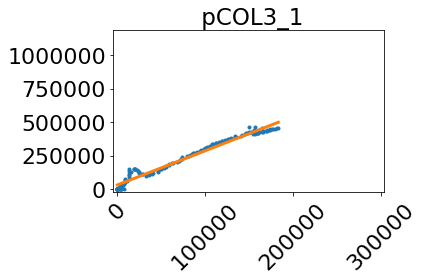

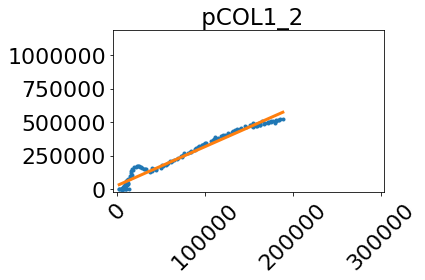

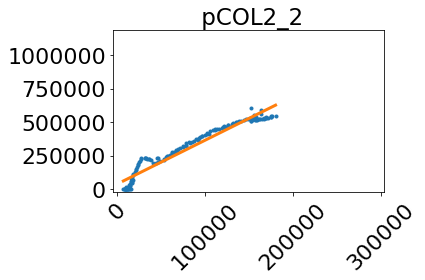

...

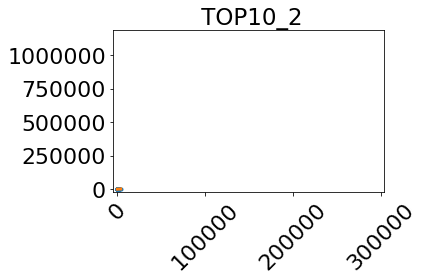

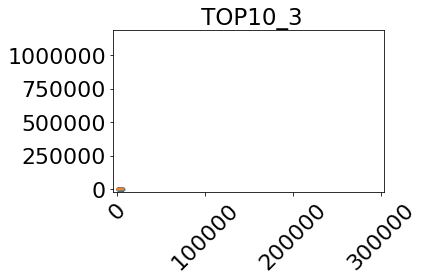

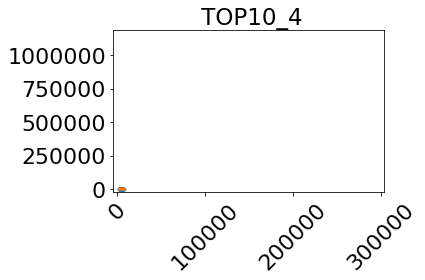

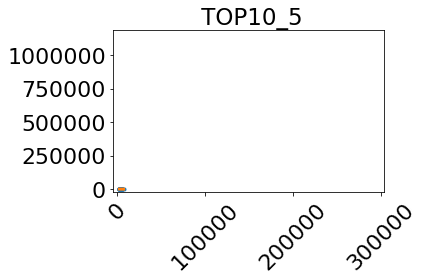

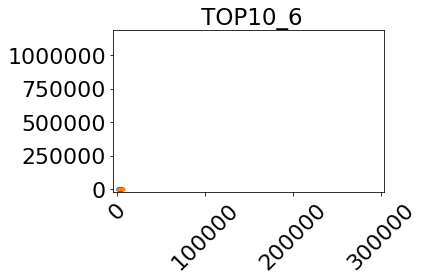

In [21]:
# plot linear fits

xGroup = 'RFP'
yGroup = 'GFP'
plasmids = ['pCO', 'pCA', 'pSB', 'pAN', 'AKR1']
fit_name = xGroup+'_'+yGroup+'_linear'

folder = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/'  #where to save the image

data_sets = list(s_data.keys())

# find the max and min values to fix the axis of plots

x_max = []
x_min = []
y_max = []
y_min = []

for sets in data_sets:
    x_max.append(s_data[sets]['data_sheets'][xGroup]['data'].max())
    x_min.append(s_data[sets]['data_sheets'][xGroup]['data'].min())
    y_max.append(s_data[sets]['data_sheets'][yGroup]['data'].max())
    y_min.append(s_data[sets]['data_sheets'][yGroup]['data'].min())  

x_max = max(x_max)
x_min = min(x_min)
y_max = max(y_max)
y_min = min(y_min)

# make the plots

for sets in data_sets:
    
    sub_folder = folder + sets.split('python')[0][0:-2] + '/'
    x_vals = s_data[sets]['data_sheets'][xGroup]['data']
    y_vals = s_data[sets]['data_sheets'][yGroup]['data']
    set_fit = s_data[sets]['fit'][fit_name]
    vector_counter = {}
    
    #for p in plasmids:
    #    vector_counter[p] = 0
    #plt.figure()
    
    for i in range(x_vals.shape[1]):
        
        x_vals_i = x_vals[:,i]
        y_vals_i = y_vals[:,i]

        fit_params = set_fit[i,:]
        
        vector_id = well_labels[i].split(',')[2].split('_')[0]
        title = vector_id
        
        #counte the number of replicate
        if vector_id in vector_counter.keys():
            vector_counter[vector_id] = vector_counter[vector_id] +1
        else:
            vector_counter[vector_id] = 1
        
        title = title +'_' + str(vector_counter[vector_id])
        
        #for p in plasmids:

            #if p in vector_id: # if plasmid name is in the vector identifier
         #       vector_counter[p] = vector_counter[p] + 1
         #       title = title +'_' + str(vector_counter[p])
        
                
            
        plt.figure()        
        plt.plot(x_vals_i, y_vals_i,'.')

        x_to_fit = np.linspace(x_vals_i.min(),x_vals_i.max(), 5)
        plt.plot(x_to_fit, f_line(x_to_fit, *fit_params),'-', linewidth = 3)
        plt.xticks(rotation = 45)
        #plt.ylabel('GFP [A.U.]')
        #plt.xlabel('RFP [A.U.]')
        plt.ylim([-20000, y_max*1.05])
        plt.xlim([-5000, x_max*1.03])
        plt.xticks(np.arange(0,310000,100000), np.arange(0,310000,100000), fontsize = 22)
        plt.yticks(np.arange(0,1100000,250000), np.arange(0,1100000,250000), fontsize = 22 )
        plt.title(title, fontsize = 23)
        plt.tight_layout()  # to avoid axis text keep out the image
        #plt.savefig(sub_folder+title+".png", transparent=True)
    

to help in the statistics analysis, obtained parameters are organized accord plasmids and level:

In [74]:
for i in range(len(data_sets)):
    s_data[data_sets[i]]['Labels'] = well_labels[84*i:84*(i+1)]

84
84
84


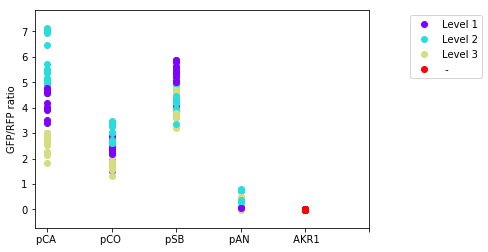

In [270]:
plasmids = ['pCA ', 'pCO ', 'pSB ', 'pAN ', ' AKR1']
lvls = ['Level 1', 'Level 2', 'Level 3', ' - ']
colors_labels = plt.cm.rainbow(np.linspace(0, 1, len(lvls))) # the third element is the number of colors

# "tokens" are to make sure to only add each legend one time

token = []
token_aux = []

for i in range(len(lvls)):
    token.append(True)
    token_aux.append(True)

plot_aux = []
dot_labels = []
fit_name = 'RFP_GFP_linear'
ro_organized = {}

for setn in data_sets:
    
    ro_organized[setn] = {}
    wells = s_data[setn]['Labels']
    
    for j in range(len(plasmids)):
        
        ro_organized[setn][plasmids[j]] = {}
        
        for lvl in lvls:
            
            ro_organized[setn][plasmids[j]][lvl] = {}
            ro_organized[setn][plasmids[j]][lvl]['values'] = []

        for i in range(len(wells)):
            
            ro_i = s_data[setn]['fit'][fit_name][i,0]
            add_aux = False
            if plasmids[j] in wells[i]:       

                for m in range(len(lvls)):
                    if lvls[m] in wells[i]:
                        ro_organized[setn][plasmids[j]][lvls[m]]['values'].append(ro_i)
                        colord = colors_labels[m]
                        token[m] = False
                        label_aux = lvls[m]

                p, = plt.plot(j,ro_i, 'o', color=colord)

                for n in range(len(token)):
                    if token[n] != token_aux[n]:
                        add_aux = True
                        token_aux[n] = False

                if add_aux == True:
                    plot_aux.append(p)
                    dot_labels.append(label_aux)
                    add_aux = False
    
    #plt.title()
    plt.ylabel('GFP/RFP ratio')
    plt.legend(plot_aux,dot_labels, loc = 'upper right', bbox_to_anchor=(1.35, 1))
    x_points = np.arange(len(plasmids)+1)
    plt.xticks(x_points,plasmids)
    plt.ylim([min(ro_list)-0.5,max(ro_list)*1.1])

Compute the statistics by means of the scipy.stats library

In [271]:
confidence = 0.95
CI_name = 'CI_'+str(confidence)
    
for setn in data_sets:

    for plasm in plasmids:
    
        plasm_values = []    #create the list to save all the ro values for the plasmid
        
        for lvl in lvls:
            
            plasm_values.extend(ro_organized[setn][plasm][lvl]['values'])
            
            ro_values = np.asarray(ro_organized[setn][plasm][lvl]['values'])
               
            std_err = sem(ro_values)
            
            ro_organized[setn][plasm][lvl]['mean'] = np.mean(ro_values) 
            ro_organized[setn][plasm][lvl]['std'] = np.std(ro_values, dtype=np.float64, ddof = 1)
            ro_organized[setn][plasm][lvl]['sem'] = std_err
            ro_organized[setn][plasm][lvl][CI_name] = std_err * t.ppf((1 + confidence) / 2, len(ro_values) - 1)
            
        
            
        #compute the plasmid statistics
    
        arr_plasm = np.asarray(plasm_values)[~np.isnan(np.asarray(plasm_values))]
        
        p_mean = np.mean(arr_plasm)
        p_std = np.std(arr_plasm, dtype=np.float64, ddof = 1)
        p_sem = sem(arr_plasm)
        
        ro_organized[setn][plasm]['mean'] = p_mean
        ro_organized[setn][plasm]['std'] = p_std        
        ro_organized[setn][plasm]['sem'] = p_sem
        ro_organized[setn][plasm][CI_name] = p_sem * t.ppf((1 + confidence) / 2, len(arr_plasm) - 1)
        ro_organized[setn][plasm]['CV'] = 100*(p_std/np.abs(p_mean))

for plasm in plasmids:
    ro_organized[plasm] = {}
    plasm_values = []
    
    for lvl in lvls:
        ro_organized[plasm][lvl] = {}
        set_values = []
        
        for setn in data_sets:
            set_values.append(ro_organized[setn][plasm][lvl]['mean'])  #set value
        
        plasm_values.extend(set_values)

        ro_mean = np.mean(np.asarray(set_values))
        ro_std = np.std(np.asarray(set_values),dtype=np.float64, ddof = 1)
        ro_sem = sem(np.asarray(set_values))
        
        ro_organized[plasm][lvl]['mean'] = ro_mean
        ro_organized[plasm][lvl]['std'] = ro_std
        ro_organized[plasm][lvl]['sem'] = ro_sem
        ro_organized[plasm][lvl][CI_name] = ro_sem * t.ppf((1 + confidence) / 2, len(set_values) - 1)
    
    #by plasmid
    plasm_values = np.asarray(plasm_values)[~np.isnan(np.asarray(plasm_values))] # eliminate nan values
    
    p_mean = np.mean(plasm_values)
    p_std = np.std(plasm_values,dtype=np.float64, ddof = 1)
    p_sem = sem(plasm_values)
    
    ro_organized[plasm]['mean'] = p_mean
    ro_organized[plasm]['std'] = p_std
    ro_organized[plasm]['CV'] = 100*(p_std/np.abs(p_mean))
    ro_organized[plasm]['sem'] = p_sem
    ro_organized[plasm][CI_name] = p_sem * t.ppf((1 + confidence) / 2, len(plasm_values) - 1)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


**Let's to plot them**

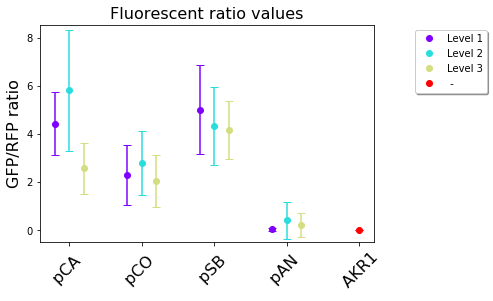

In [277]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(lvls)):
        
        mean_val = ro_organized[plasmids[j]][lvls[i]]['mean']
        std_val = ro_organized[plasmids[j]][lvls[i]]['std']
        #std_err = ro_organized[plasmids[j]][lvls[i]]['sem']
        ci= ro_organized[plasmids[j]][lvls[i]][CI_name]
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this graph instance
            pos = j+ 1*separation 
            
        p, = plt.plot(pos,mean_val, 'o', color=colors_labels[i])
        #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_val, color=colors_labels[i],capsize = 4)
        #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
        plt.errorbar(pos, mean_val, yerr=ci, color=colors_labels[i], capsize = 4)   # error dado por CI
        #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('GFP/RFP ratio', fontsize=16)
lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(ro_list),max(ro_list)]) # for std plot
plt.ylim([-0.5,max(ro_list)*1.2])     # for CI plot
plt.title('Fluorescent ratio values', fontsize=16)

filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_CI95_dot_N3'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

##### Perform the dotplot

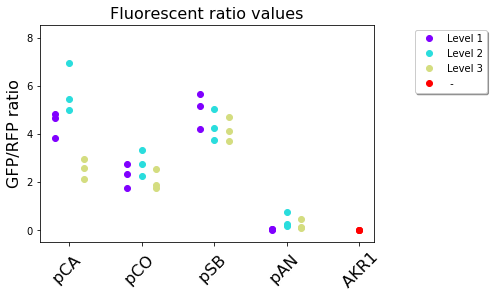

In [315]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(lvls)):
        
        mean_val = ro_organized[plasmids[j]][lvls[i]]['mean']
        std_val = ro_organized[plasmids[j]][lvls[i]]['std']
        #std_err = ro_organized[plasmids[j]][lvls[i]]['sem']
        ci= ro_organized[plasmids[j]][lvls[i]][CI_name]
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this graph instance
            pos = j+ 1*separation 
        
        
        days = list(ro_organized.keys())[0:3]
        
        for day in days:
            ro_value = ro_organized[day][plasmids[j]][lvls[i]]['mean']
            p, = plt.plot(pos,ro_value, 'o', color=colors_labels[i])
        
        
        #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_val, color=colors_labels[i],capsize = 4)
        #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=ci, color=colors_labels[i], capsize = 4)   # error dado por CI
        #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('GFP/RFP ratio', fontsize=16)
lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(ro_list),max(ro_list)]) # for std plot
plt.ylim([-0.5,max(ro_list)*1.2])     # for CI plot
plt.title('Fluorescent ratio values', fontsize=16)

filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_dots_N3'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

In [273]:
# display the statistic you are interested in:

stat = 'CV'   # asign a "stat" variable one of those: ['mean', 'std', 'sem, 'CV', 'CI_0.95']

for plasm in plasmids:
    print(stat +' value plasmid '+ plasm +' is '+ str(ro_organized[plasm][stat]))

CV value plasmid pCA  is 35.950131469184974
CV value plasmid pCO  is 22.748899432979357
CV value plasmid pSB  is 14.929758043936427
CV value plasmid pAN  is 111.31107776069109
CV value plasmid  AKR1 is 173.20508075731874


Store the values in database

In [598]:
database = {}
database['Fluorescence ratio'] = ro_organized

###### let's make a zoom on pAN and AKR1

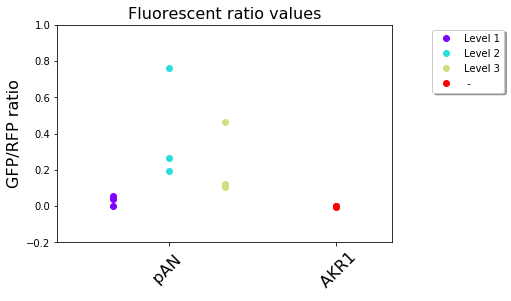

In [319]:
plasmids = ['pAN ', ' AKR1']

plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(lvls)):
        mean_val = ro_organized[plasmids[j]][lvls[i]]['mean']
        std_val = ro_organized[plasmids[j]][lvls[i]]['std']
        ci= ro_organized[plasmids[j]][lvls[i]][CI_name]

        separation = 0.1
        pos = j*0.8+i*separation
         
        if i == 3 :               #this is a particular solution for this example
            pos = j*0.3+ 1*separation 
                
        days = list(ro_organized.keys())[0:3]
        
        for day in days:
            ro_value = ro_organized[day][plasmids[j]][lvls[i]]['mean']
            p, = plt.plot(pos,ro_value, 'o', color=colors_labels[i])
        #p, = plt.plot(pos,mean_val, 'o', color=colors_labels[i])
        #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_val, color=colors_labels[i],capsize = 4)
        #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=ci, color=colors_labels[i],capsize = 4)   # error dado por CI
        #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('GFP/RFP ratio', fontsize=16)
lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points*0.3+separation,plasmids,fontsize=16, rotation = 45)
plt.xlim([-0.1,0.5])
#plt.ylim([-0.05,0.8])  # for std plot
plt.ylim([-0.2,1])    # for CI plot
plt.title('Fluorescent ratio values', fontsize=16)

filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_dotN3_zoom'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

#### ANOVA test

In order to test the differences in the mean GFP/RFP value between different uLoop Levels and groups we will perform ANOVA test over them.

In [326]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

import pandas as pd

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


First of all, we tested the differences in expression between uLoop levels (without considering the plasmid group).

In [503]:
plasm_means = []


for plasmid in plasmids[0:-1]:
    days = list(ro_organized.keys())[0:3]
    
    count = 1
    for day in days:
        
        for lvl in lvls[0:-1]:
            
            mean_val = ro_organized[day][plasmid][lvl]['mean']
            plasm_means.append([mean_val, lvl, 'day '+str(count), plasmid])
        
        count +=1


df = pd.DataFrame(plasm_means, columns = ['value', 'Level', 'day', 'plasmid']) 

print(df)


           value    Level    day plasmid
0   4.817160e+00  Level 1  day 1    pCA 
1   6.943454e+00  Level 2  day 1    pCA 
2   2.979018e+00  Level 3  day 1    pCA 
3   3.828513e+00  Level 1  day 2    pCA 
4   5.002382e+00  Level 2  day 2    pCA 
5   2.131070e+00  Level 3  day 2    pCA 
6   4.654871e+00  Level 1  day 3    pCA 
7   5.472518e+00  Level 2  day 3    pCA 
8   2.588968e+00  Level 3  day 3    pCA 
9   2.753070e+00  Level 1  day 1    pCO 
10  3.344589e+00  Level 2  day 1    pCO 
11  2.547550e+00  Level 3  day 1    pCO 
12  1.755503e+00  Level 1  day 2    pCO 
13  2.271501e+00  Level 2  day 2    pCO 
14  1.740301e+00  Level 3  day 2    pCO 
15  2.333177e+00  Level 1  day 3    pCO 
16  2.770743e+00  Level 2  day 3    pCO 
17  1.858515e+00  Level 3  day 3    pCO 
18  5.677487e+00  Level 1  day 1    pSB 
19  5.016706e+00  Level 2  day 1    pSB 
20  4.685912e+00  Level 3  day 1    pSB 
21  4.201059e+00  Level 1  day 2    pSB 
22  3.729396e+00  Level 2  day 2    pSB 
23  3.715269e+00

In [500]:
results = ols('value ~ C(Level)', data=df).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  value   R-squared:                       0.054
Model:                            OLS   Adj. R-squared:                 -0.003
Method:                 Least Squares   F-statistic:                    0.9413
Date:                Fri, 26 Jul 2019   Prob (F-statistic):              0.400
Time:                        14:31:32   Log-Likelihood:                -73.514
No. Observations:                  36   AIC:                             153.0
Df Residuals:                      33   BIC:                             157.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               2.9398      0.562      5.229      0.000       1.796       4.084
C(Level)[T.Level 2]     0.3949      0.795      0.497      0.623      -1.223       2.013
C(Level)[T.Level 3]    -0.6833      0.795     -0.859      0.396      -2.301       0.934
==============================================================================
Omnibus:                        3.674   Durbin-Watson:                   0.562
Prob(Omnibus):                  0.159   Jarque-Bera (JB):                1.733
Skew:                          -0.181   Prob(JB):                        0.420
Kurtosis:                       1.988   Cond. No.                         3.73
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [504]:
aov_table = sm.stats.anova_lm(results)
aov_table

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


,df,sum_sq,mean_sq,F,PR(>F)
C(Level),2.0,7.141522,3.570761,0.941299,0.400345
Residual,33.0,125.183476,3.793439,NaN,NaN


No signficant difference between "Level" groups is shown

Also is good to test if there is some significant diferences between **days of experimentation**

In [505]:
results = ols('value ~ C(day)', data=df).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  value   R-squared:                       0.041
Model:                            OLS   Adj. R-squared:                 -0.017
Method:                 Least Squares   F-statistic:                    0.7023
Date:                Fri, 26 Jul 2019   Prob (F-statistic):              0.503
Time:                        14:32:56   Log-Likelihood:                -73.763
No. Observations:                  36   AIC:                             153.5
Df Residuals:                      33   BIC:                             158.3
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept           3.3359      0.566      5.892      0.000       2.184       4.488
C(day)[T.day 2]    -0.9467      0.801     -1.182      0.246      -2.576       0.682
C(day)[T.day 3]    -0.5298      0.801     -0.662      0.513      -2.159       1.099
==============================================================================
Omnibus:                        4.942   Durbin-Watson:                   0.675
Prob(Omnibus):                  0.084   Jarque-Bera (JB):                1.886
Skew:                          -0.109   Prob(JB):                        0.389
Kurtosis:                       1.900   Cond. No.                         3.73
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [506]:
aov_table = sm.stats.anova_lm(results)
aov_table

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


,df,sum_sq,mean_sq,F,PR(>F)
C(day),2.0,5.402509,2.701254,0.702329,0.502684
Residual,33.0,126.922490,3.846136,NaN,NaN


Again, there is no significant difference between days of experimentation

Next, it is interesting to test if there is some difference in the expression between levels inside each plasmid set:

In [514]:
df = {}

for plasmid in plasmids[0:-1]:
    
    days = list(ro_organized.keys())[0:3]
    
    plasm_means = []
    
    count = 1
    for day in days:
        
        for lvl in lvls[0:-1]:
            
            mean_val = ro_organized[day][plasmid][lvl]['mean']
            plasm_means.append([mean_val, lvl, 'day '+str(count)])
        count +=1
    
    #create the pandas data frame
    df[plasmid] = pd.DataFrame(plasm_means, columns = ['value', 'Level', 'day']) 
    
    print('\n'+str(plasmid))
    print(df[plasmid])


pCA 
      value    Level    day
0  4.817160  Level 1  day 1
1  6.943454  Level 2  day 1
2  2.979018  Level 3  day 1
3  3.828513  Level 1  day 2
4  5.002382  Level 2  day 2
5  2.131070  Level 3  day 2
6  4.654871  Level 1  day 3
7  5.472518  Level 2  day 3
8  2.588968  Level 3  day 3

pCO 
      value    Level    day
0  2.753070  Level 1  day 1
1  3.344589  Level 2  day 1
2  2.547550  Level 3  day 1
3  1.755503  Level 1  day 2
4  2.271501  Level 2  day 2
5  1.740301  Level 3  day 2
6  2.333177  Level 1  day 3
7  2.770743  Level 2  day 3
8  1.858515  Level 3  day 3

pSB 
      value    Level    day
0  5.677487  Level 1  day 1
1  5.016706  Level 2  day 1
2  4.685912  Level 3  day 1
3  4.201059  Level 1  day 2
4  3.729396  Level 2  day 2
5  3.715269  Level 3  day 2
6  5.166495  Level 1  day 3
7  4.245179  Level 2  day 3
8  4.140359  Level 3  day 3

pAN 
          value    Level    day
0  3.734330e-02  Level 1  day 1
1  7.643143e-01  Level 2  day 1
2  4.639754e-01  Level 3  day 1
3 -1.657

In [515]:
results = {}
for plasmid in plasmids[0:-1]:
    results[plasmid] = ols('value ~ C(Level)', data=df[plasmid]).fit()
    print('\n'+ plasmid)
    print(results[plasmid].summary())
    aov_table = sm.stats.anova_lm(results[plasmid])
    print('\nAnova Table')
    print(aov_table)
    print('\n\n')


pCA 
                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.790
Method:                 Least Squares   F-statistic:                     16.01
Date:                Fri, 26 Jul 2019   Prob (F-statistic):            0.00393
Time:                        16:21:46   Log-Likelihood:                -7.7865
No. Observations:                   9   AIC:                             21.57
Df Residuals:                       6   BIC:                             22.16
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               4.43

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1390: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=9
  "anyway, n=%i" % int(n))
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


Test shows that there is significant diference (under 95% confidence) in the expresion of pCA plasmids.

Then we perform *a posteriori* "Tukey honestly significant difference” test to determine which of the pCA level plasmids shows a significant difference

In [516]:
from statsmodels.stats.multicomp import (pairwise_tukeyhsd,
                                         MultiComparison)

In [523]:
# Set up the data for comparison (creates a specialised object)
MultiComp = MultiComparison(df[plasmids[0]]['value'],
                            df[plasmids[0]]['Level'])

# Show all pair-wise comparisons:

# Print the comparisons
THSD = MultiComp.tukeyhsd()
thsd_sum = THSD.summary()
print(thsd_sum)

Multiple Comparison of Means - Tukey HSD,FWER=0.05
 group1  group2 meandiff  lower   upper  reject
-----------------------------------------------
Level 1 Level 2  1.3726  -0.3889  3.1341 False 
Level 1 Level 3 -1.8672  -3.6287 -0.1057  True 
Level 2 Level 3 -3.2398  -5.0013 -1.4783  True 
-----------------------------------------------


This way, the **pCA Level 3** plasmid shows a significant diference under 95% confidence

We can obtain the exact p-values with the next boxes

In [519]:
from statsmodels.stats.libqsturng import psturng

In [524]:
p_values = psturng(np.abs(THSD.meandiffs / THSD.std_pairs), len(THSD.groupsunique), THSD.df_total)
print()
print("p values:", p_values)


p values: [0.11736963 0.03992132 0.00320701]


## Growth rate analysis

to know the exponential growth phase we can fit a model. We will use the gompertz model, then we need to compute $$ \mu = \frac{1}{A} \frac{dA}{dt} = \frac{d(ln(A/A_0))}{dt} $$

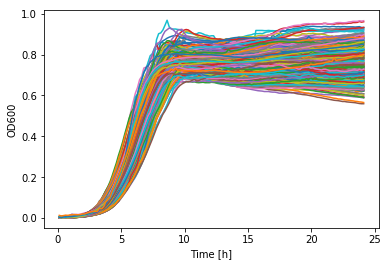

In [115]:
daux = {}
for cat in book_cats:
    
    daux[cat] = s_data[cat]['data_sheets']
    plt.plot(daux[cat]['OD600']['time'],daux[cat]['OD600']['data'])
    plt.ylabel('OD600')
    plt.xlabel('Time [h]')
    
plt.show() # put inside the "for" to see each cathegory in a separated plot

In [116]:
# construct the ln(A/Ao) matrix

A = {}
log_AA0 = {}
A_time = {}


for cat in book_cats:
    A[cat] = daux[cat]['OD600']['data']
    A_time[cat] = daux[cat]['OD600']['time']
    A_div_A0 = np.zeros((A[cat].shape))
    
    for i in range(A[cat].shape[1]):
        A_div_A0[:,i] = A[cat][:,i]/A[cat][0,i]

    log_AA0[cat] = np.log(A_div_A0)


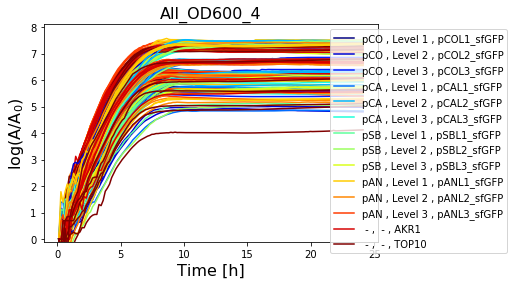

In [117]:
#make a proper plot
#title_fig = strain_label[0] + '_OD600'
title_fig = 'All_OD600_4'
folder = 'V3_Plots/OD600/'

plot_ind_dat_time(log_AA0, A_time, well_labels, 'log(A/A$_0$)',title_fig, folder )


#plt.savefig(folder+title_fig+".pdf", transparent=True) # , bbox_extra_artists=(lgd,), bbox_inches='tight'

In [134]:
# params[book_cats[0]][i][2] is equal to mu_list[i]

1.3565276439779301

[ 1.99753262 -0.12976567  0.38659789]
7.370846979113373 1.4719644805779672


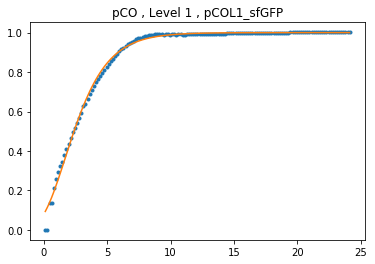

[1.8440117  0.42441386 0.3828071 ]
6.32184884057326 1.4663951320866517


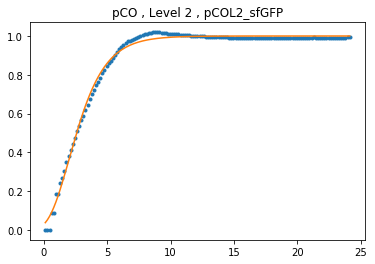

[1.69000088 0.96481012 0.19392286]
5.419485491463947 1.2140026341183967


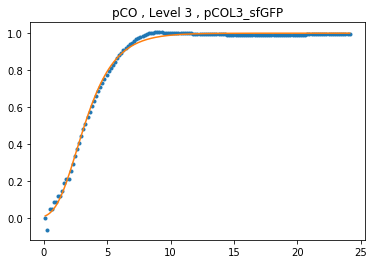

[1.83547925 0.38054021 0.30492823]
6.268137456416268 1.3565276439779301


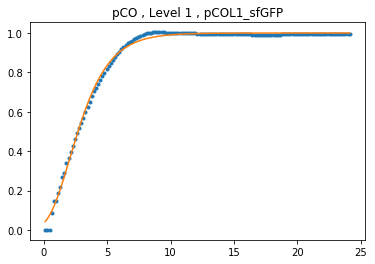

[ 1.96961962 -0.00734143  0.46042234]
7.167949397360841 1.58474314223101


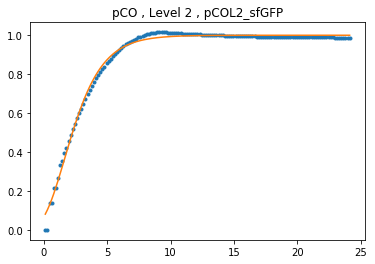

[1.85365934 0.49713516 0.3100754 ]
6.3831348961059415 1.3635279166515724


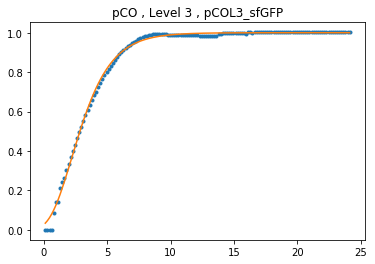

[1.74803552 0.66860647 0.2394847 ]
5.743308951027214 1.2705942493915907


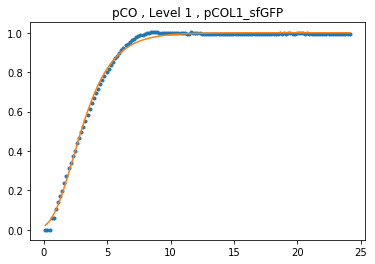

[1.98288576 0.0073828  0.4678157 ]
7.263674003380498 1.596503139256381


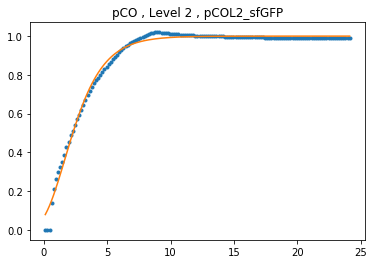

[1.84338314 0.61278432 0.35985529]
6.317876422698029 1.4331220071114497


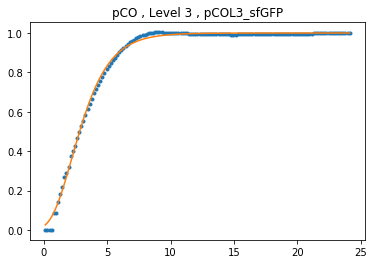

[1.83714678 0.22121533 0.25973061]
6.278598458426954 1.2965807509189424


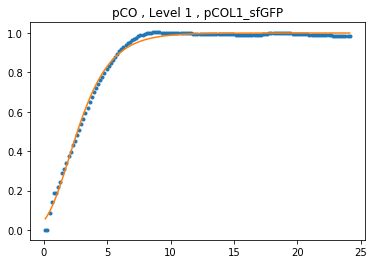

[ 1.98090069 -0.11251042  0.43500135]
7.249269379286112 1.5449651522496957


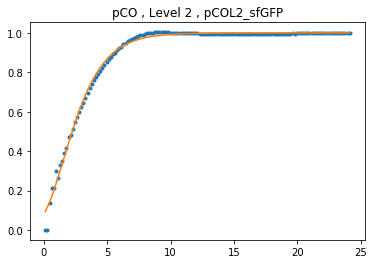

[1.83946465 0.68601185 0.38144079]
6.293168342598143 1.4643929483754503


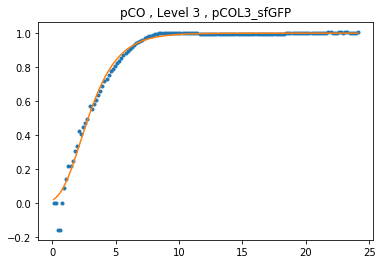

[ 1.99030561 -0.09486949  0.40271328]
7.317769838004822 1.495877935560228


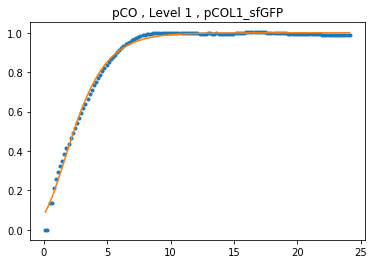

[ 1.98454673 -0.01182815  0.45084202]
7.275748730756255 1.5696332981769663


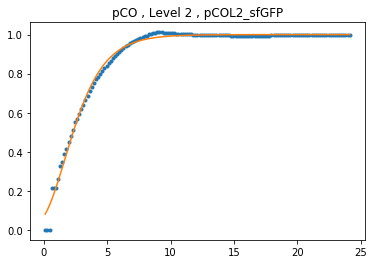

[1.84828192 0.40458845 0.27993289]
6.348902231872384 1.3230410217943633


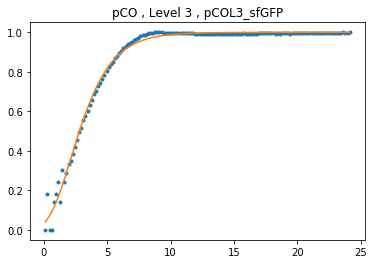

[ 1.98324959 -0.16832657  0.39984066]
7.2663172325283725 1.4915870025413678


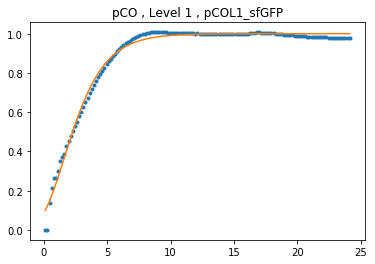

[1.97935023 0.09703401 0.48484553]
7.2380383822112675 1.6239241420177637


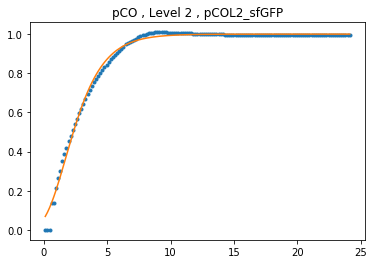

[1.84951456 0.60682333 0.34693375]
6.3567329550034755 1.4147229918188933


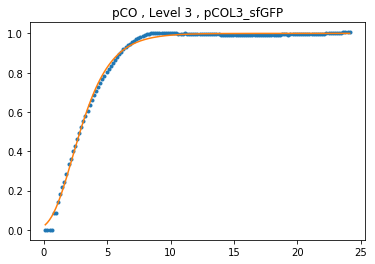

[1.99580704 0.02871541 0.3678317 ]
7.358138921845855 1.4445988940030856


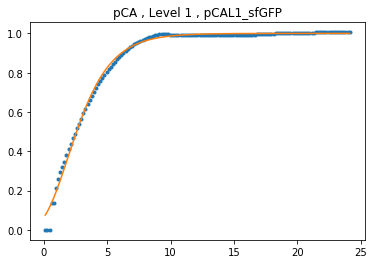

[1.84333047 0.50852649 0.28229712]
6.317543630957432 1.3261726994877632


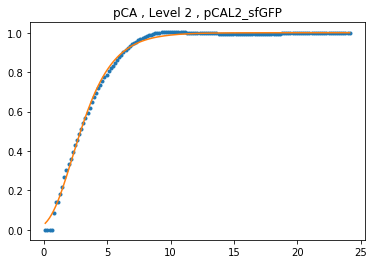

[1.84435479 0.692748   0.37579152]
6.324018167853917 1.4561435298366354


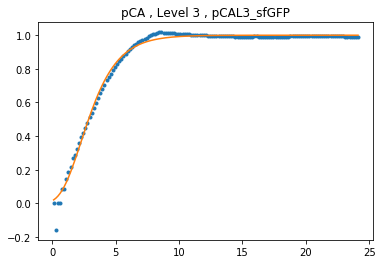

[1.99036458 0.19122022 0.41624551]
7.318201346918192 1.5162580740263927


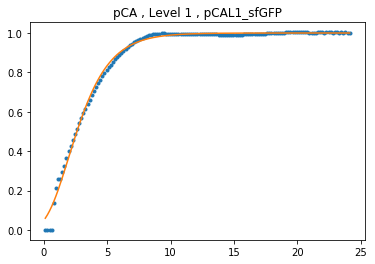

[1.9841119  0.21264002 0.43626892]
7.272585729770308 1.5469247421308379


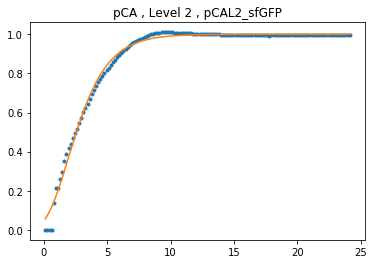

[1.98913302 0.19407054 0.45313121]
7.309194123963785 1.5732305895978784


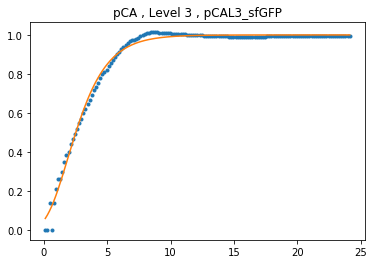

[1.99298562 0.31920793 0.44214814]
7.3374077960886614 1.556046243730662


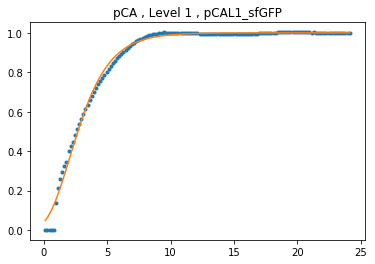

[1.84193326 0.39835839 0.25264389]
6.3087228771096795 1.2874247248607917


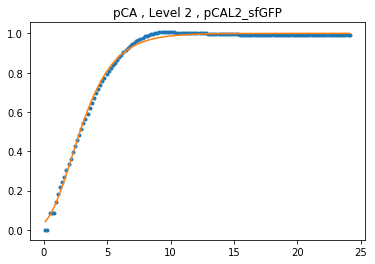

[1.83167965 0.53927894 0.3151991 ]
6.244366189406439 1.3705321616111115


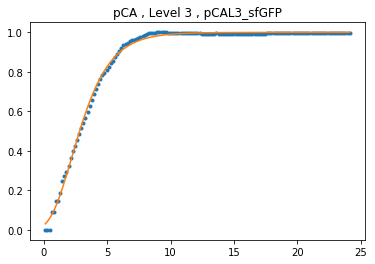

[1.98971226 0.22412989 0.42080579]
7.31342911621441 1.5231884386002903


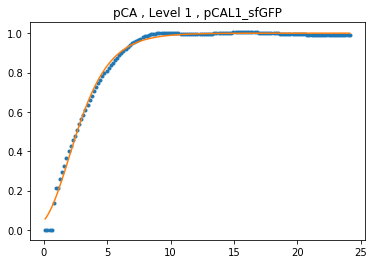

[1.98342356 0.33856842 0.46891211]
7.267581470731978 1.5982545146688232


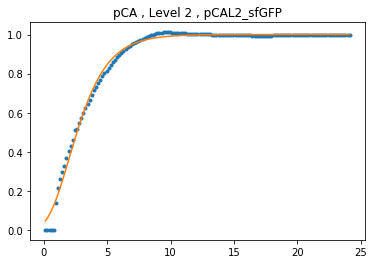

[1.98130494 0.00456665 0.39401674]
7.2522004938643025 1.4829253769235584


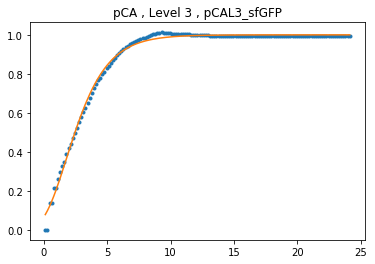

[1.98868594 0.20971852 0.42710005]
7.305927022226273 1.5328060050165406


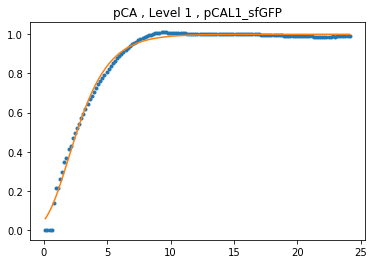

[1.75247954 0.65893465 0.16899486]
5.768889127804067 1.1841140555686565


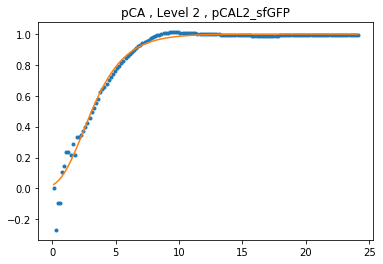

[1.97966186 0.31978907 0.48104207]
7.240294339622809 1.6177593405760344


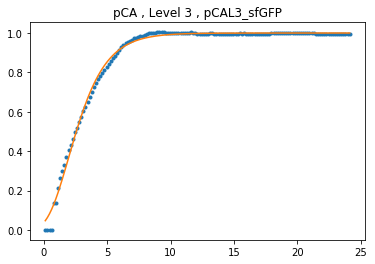

[ 1.99169321 -0.15990761  0.32051085]
7.327931021779529 1.3778314549212964


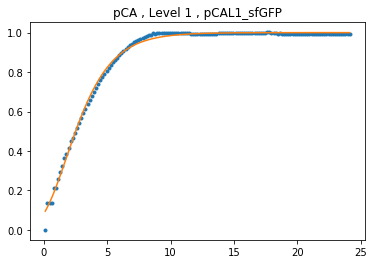

[1.99246441 0.15241528 0.42399241]
7.333584485912402 1.528050002580711


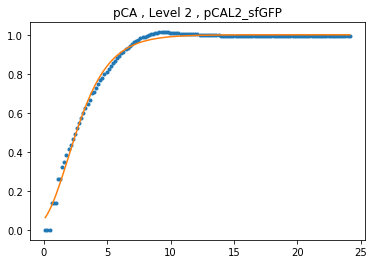

[ 1.98161293 -0.02307577  0.38869374]
7.254434439266839 1.475052726264302


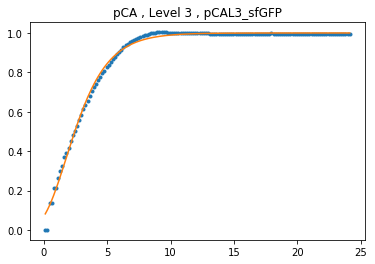

[ 1.99587406 -0.16744055  0.32563269]
7.358632127380438 1.3849065832645675


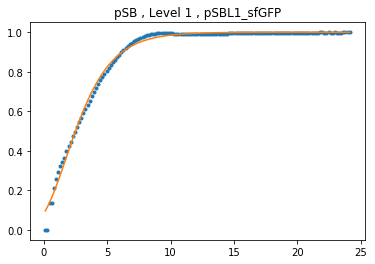

[1.84186096 0.60307594 0.26982773]
6.308266749694631 1.3097387984519724


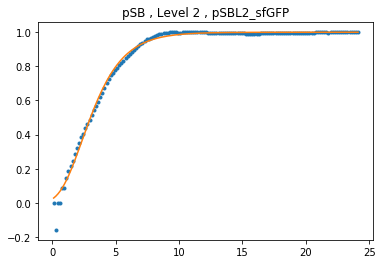

[ 1.99258682 -0.02085109  0.3972439 ]
7.3344822437108945 1.4877187400659961


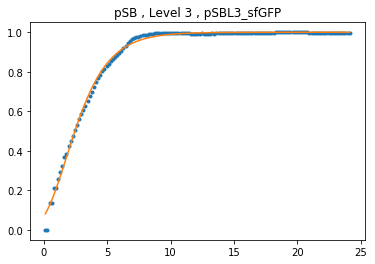

[ 1.98910734 -0.11003927  0.33643771]
7.309006423342754 1.399951659193298


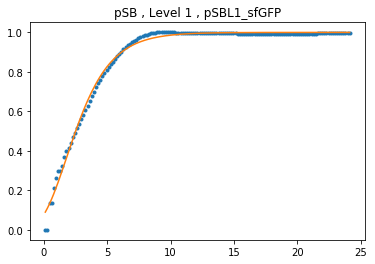

[1.98240425 0.20282069 0.40727143]
7.260177297805231 1.5027119307401746


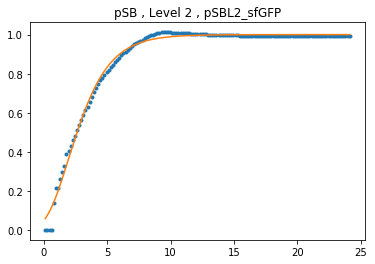

[1.98205962 0.1626372  0.44236367]
7.2576756477562085 1.5563816392519234


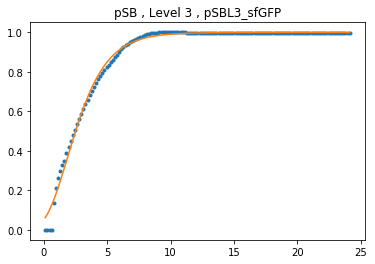

[ 1.9895459  -0.16414075  0.31823852]
7.312212562787978 1.3747041131495819


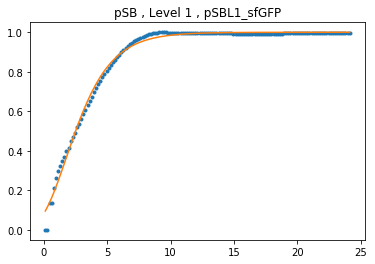

[1.97913586 0.20959663 0.41232854]
7.236486932919128 1.51033055488577


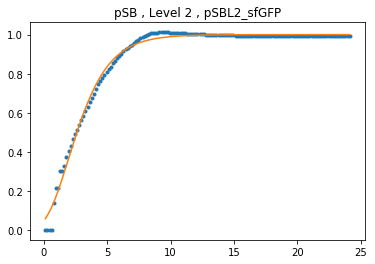

[1.98358309 0.28660107 0.48774453]
7.268740926139318 1.6286387252567796


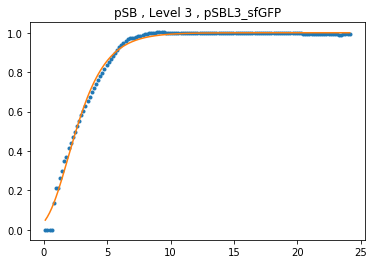

[1.8444474  0.28992579 0.19427364]
6.324603838091058 1.214428548158441


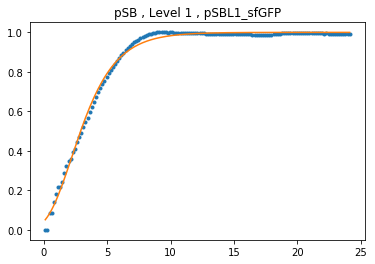

[1.98216666 0.17897171 0.41522917]
7.258452535480911 1.514717826463155


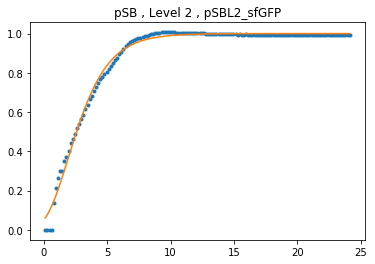

[1.84073495 0.50542651 0.31344403]
6.301167600057815 1.3681288932785405


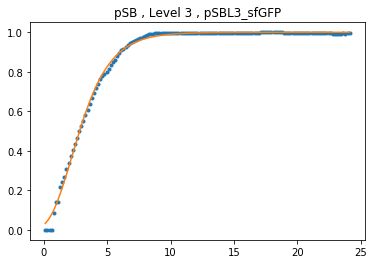

[1.84482986 0.17450974 0.16078253]
6.327023201142329 1.1744295337683912


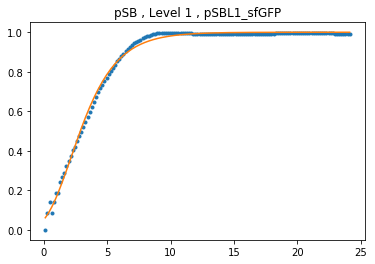

[1.98712408 0.09130505 0.37834626]
7.294525105115852 1.4598683460728612


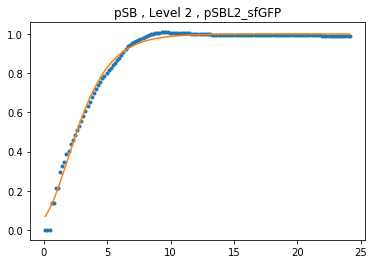

[1.84563743 0.32367506 0.26006137]
6.332134817787191 1.2970096864810887


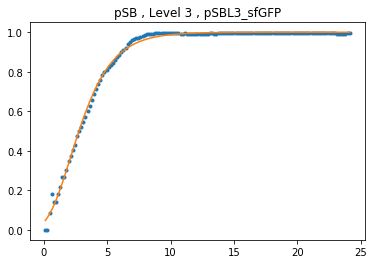

[1.98989059 0.0519764  0.36504518]
7.314733401672985 1.4405790968473737


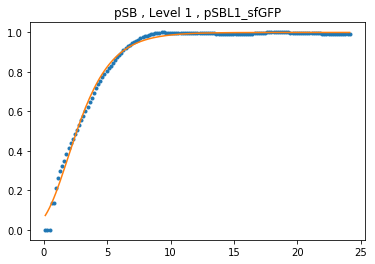

[1.98323052 0.22749267 0.40631237]
7.266178664050326 1.5012714248399137


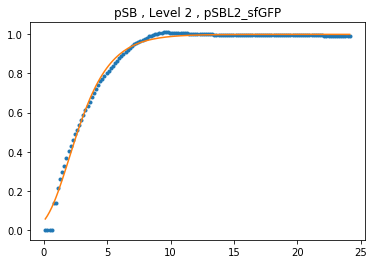

[1.98970012 0.21507027 0.4753834 ]
7.313340328120705 1.6086308361043316


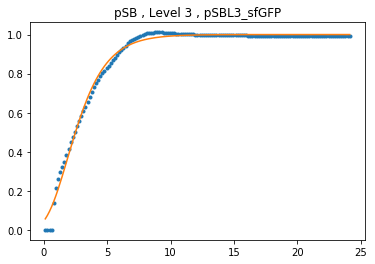

[1.98795617 0.19781132 0.55540933]
7.300597336302619 1.7426541585824216


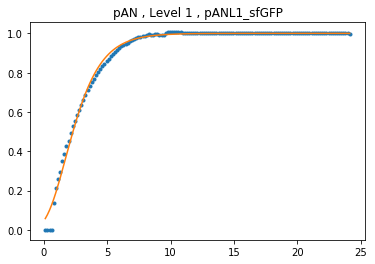

[1.82754127 0.38973708 0.35281209]
6.218578073037976 1.4230637043188505


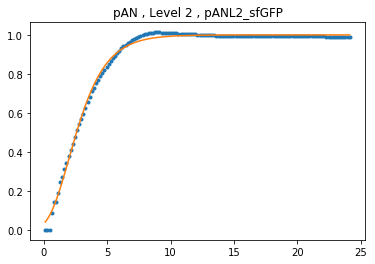

[1.99386445 0.24451939 0.59374319]
7.343858977083209 1.8107537336944382


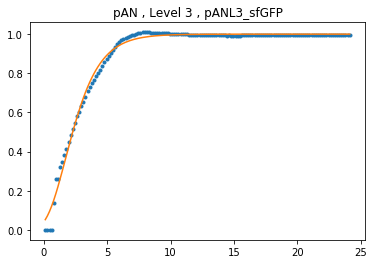

[1.66514903 1.02445878 0.22534276]
5.2864610249003166 1.252752032334626


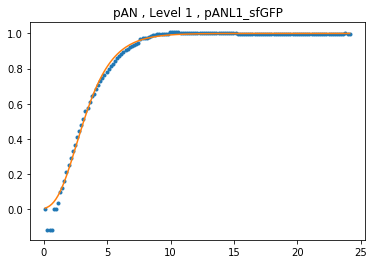

[1.82413106 0.59283437 0.43320378]
6.197407531928248 1.5421904618109903


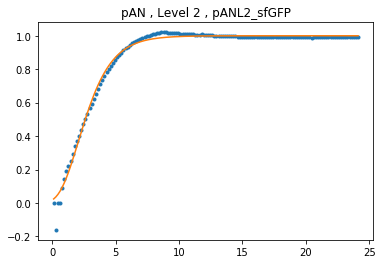

[1.99194844 0.22265075 0.59697457]
7.329801536696974 1.8166144298309819


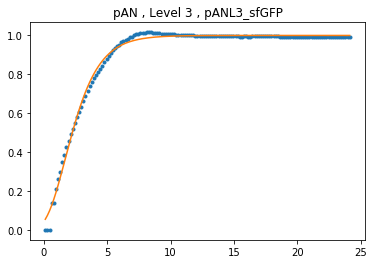

[2.00700354 0.16663974 0.51588045]
7.440987256378651 1.675112704457749


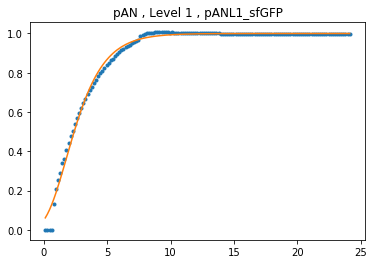

[1.97594726 0.19584975 0.54366837]
7.213449443516737 1.72231337230921


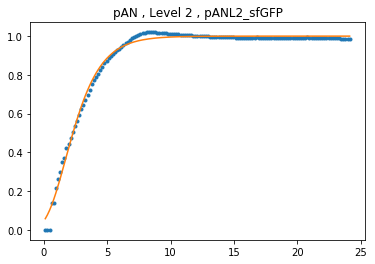

[1.98868222 0.01503487 0.53765434]
7.3058998232163805 1.7119864075644549


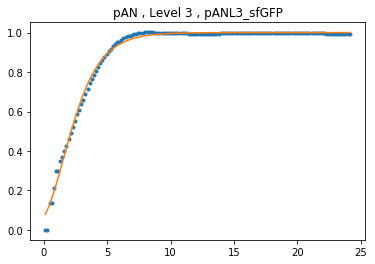

[2.00370055 0.20731948 0.54196739]
7.416450329854262 1.7193862393199382


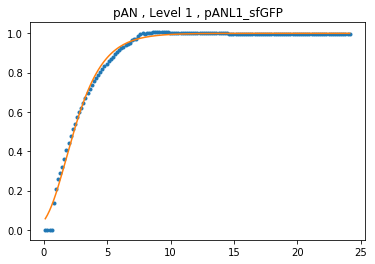

[1.8238602  0.70826718 0.45334463]
6.195729110130443 1.5735663835911065


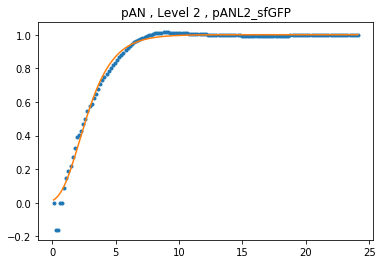

[1.84091072 0.58069374 0.46831703]
6.302275262257447 1.5973037146091775


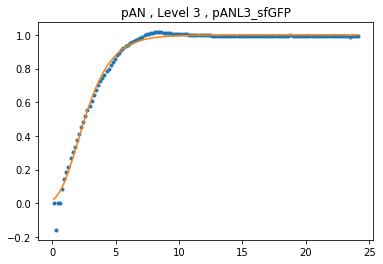

[1.76309762 0.76702429 0.3172736 ]
5.830470028680893 1.3733782779084776


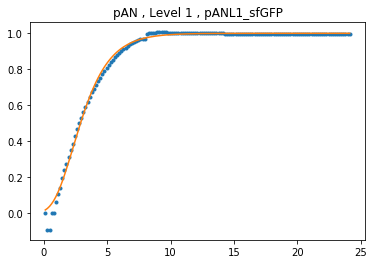

[1.97273712 0.21671594 0.53987598]
7.190330406207389 1.7157940500986282


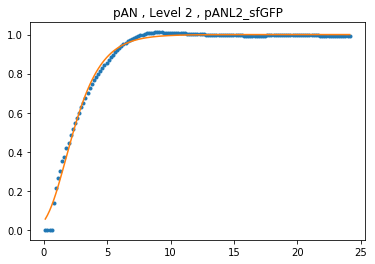

[1.84420995 0.56810629 0.44192741]
6.323102276390231 1.555702804727539


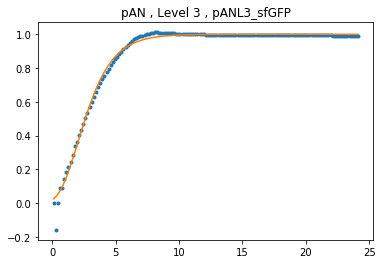

[2.01499815 0.16196986 0.5193369 ]
7.500713542334945 1.6809126736652624


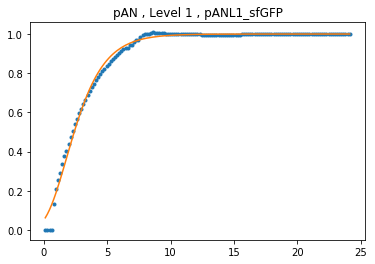

[1.97820271 0.06108447 0.50008162]
7.229737330958826 1.6488558405586924


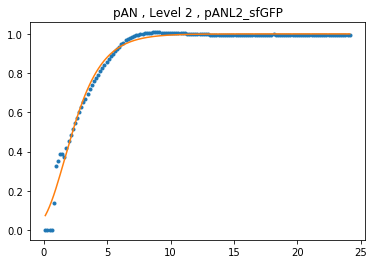

[1.98911218 0.22324215 0.59118951]
7.309041772561424 1.8061355508777739


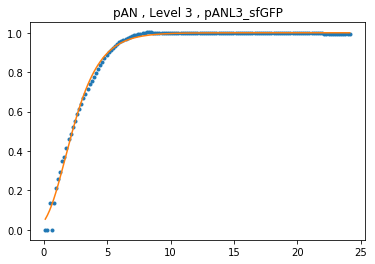

[ 1.98376747 -0.04180731  0.48394258]
7.270081264003082 1.6224584790375969


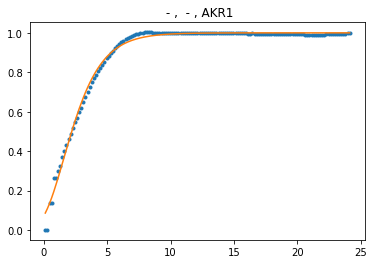

[1.83740474 0.30427848 0.33663587]
6.280218299203299 1.4002290995079854


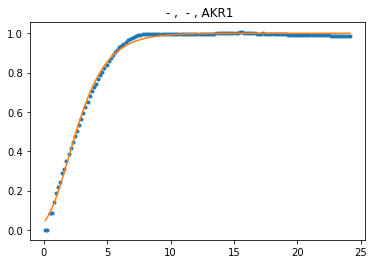

[1.83508194 0.33070333 0.35938004]
6.265647550451512 1.4324410794998885


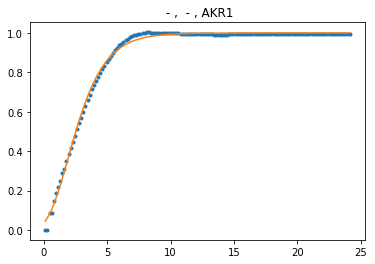

[ 1.9788562  -0.06587021  0.48178194]
7.2344634935244345 1.6189567194495518


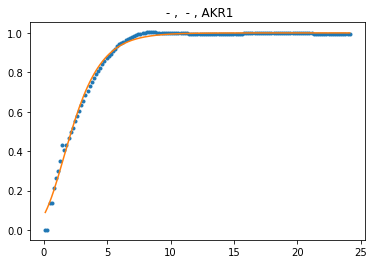

[ 1.9755186  -0.10291986  0.48195206]
7.210357968767289 1.6192321552643805


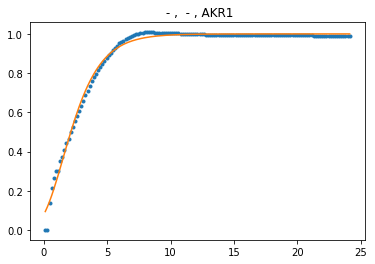

[1.83042385 0.48364558 0.41752306]
6.23652943607118 1.5181964078584385


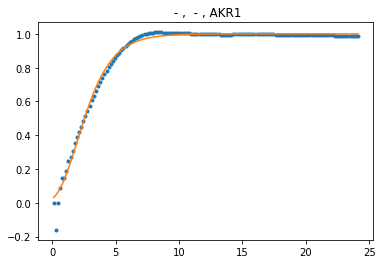

[1.98079339 0.39891033 0.54647512]
7.248491614088068 1.7271542715051602


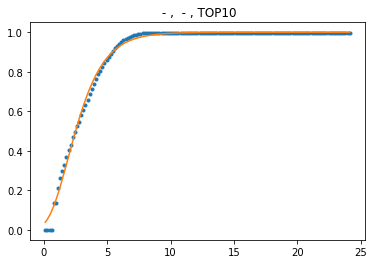

[1.98058321 0.51968781 0.58980453]
7.246968269808689 1.803635830502748


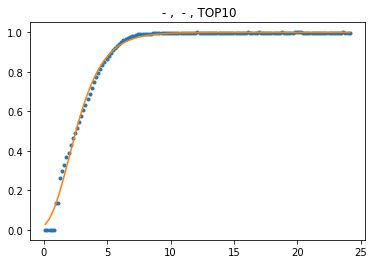

[1.98315459 0.39717694 0.54517645]
7.265626943955367 1.7249127111161253


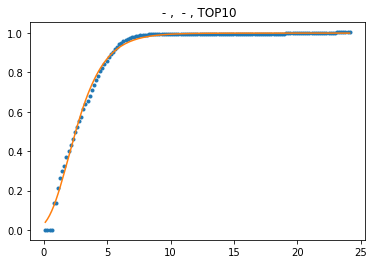

[ 1.98704262 -0.1754938   0.39229878]
7.2939309429030565 1.480379951361029


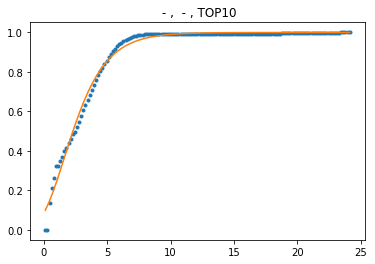

[1.98465586 0.41346878 0.56706197]
7.276542782405333 1.7630794620456967


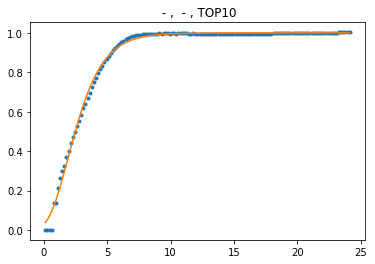

[1.9915688  0.13053502 0.48440355]
7.327019365870433 1.6232065653355119


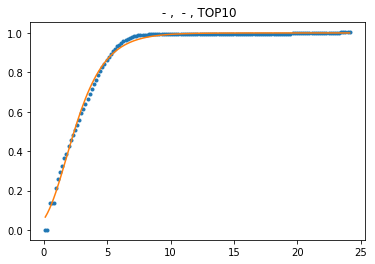

[1.8135445  0.34353153 0.16284149]
6.1321443247855365 1.1768501313087176


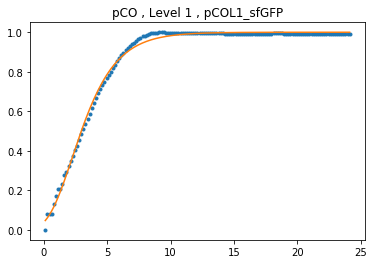

[1.81216486 0.74152287 0.3111284 ]
6.123690035023713 1.3649644672022598


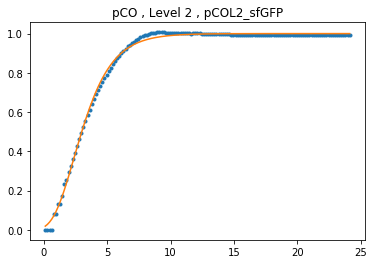

[1.96860834 0.21054775 0.35223474]
7.160704314631283 1.4222423483748043


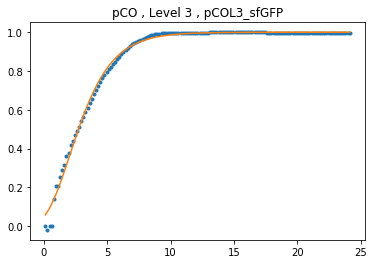

[1.72083628 0.81869047 0.1638383 ]
5.589200627881707 1.1780238088869188


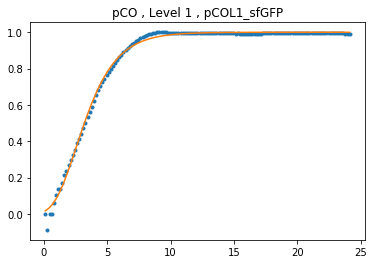

[1.98118827 0.5281015  0.5240475 ]
7.251354400817313 1.6888494445027227


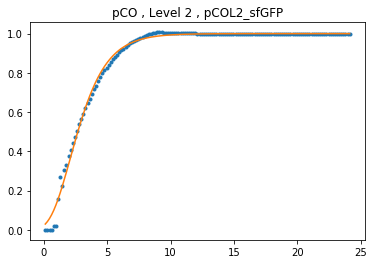

[1.96979152 0.03122135 0.32453901]
7.169181698103346 1.3833927728210118


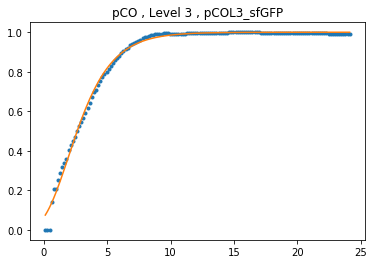

[1.96360872 0.12866638 0.34767504]
7.124992800073797 1.4157721078348708


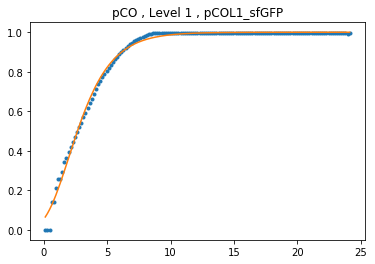

[1.96895919 0.56098069 0.50612447]
7.163217082328023 1.6588497971532212


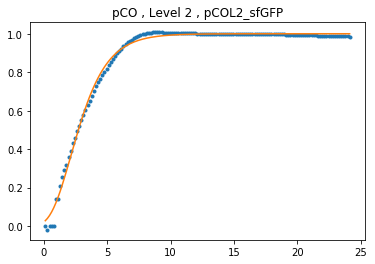

[1.82073931 0.49120864 0.19265783]
6.1764230398923194 1.2124678498063528


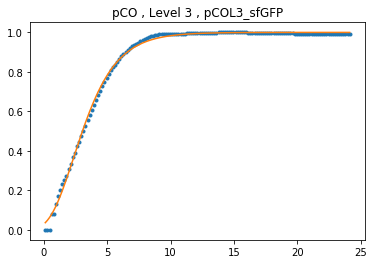

[1.96402274 0.08344792 0.350086  ]
7.1279433161926775 1.4191895888274904


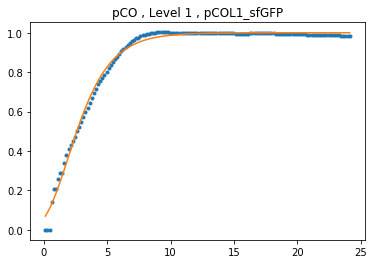

[1.98360579 0.45644445 0.49707665]
7.268905965186128 1.6439085250955747


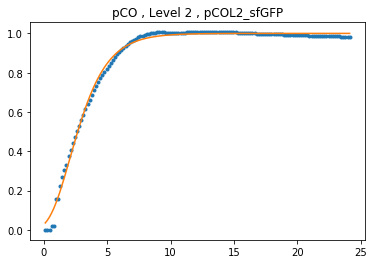

[1.81817773 0.64391457 0.25080921]
6.160621887634919 1.2850648790941674


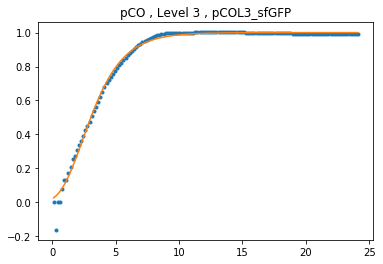

[1.73701392 0.71395261 0.14722609]
5.680356056323595 1.1586158807156357


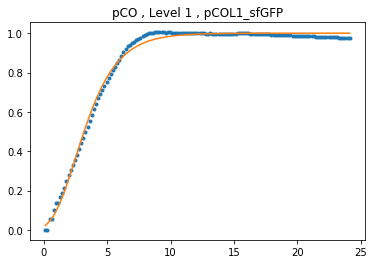

[1.95924455 0.51483364 0.49491472]
7.0939658904079295 1.6403583484595503


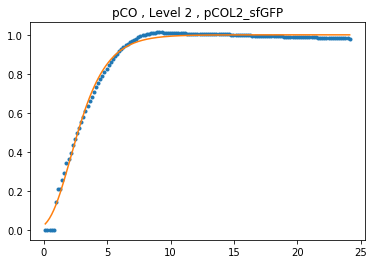

[1.5870808  1.4320384  0.06165974]
4.889454769054682 1.0636003855038467


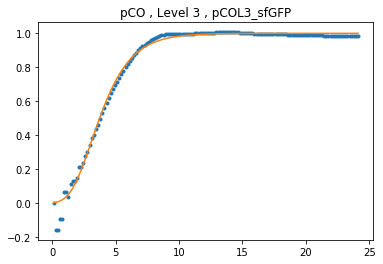

[1.98830082 0.23765387 0.39682442]
7.303113909915623 1.4870947973381585


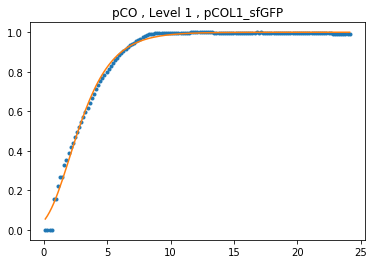

[1.99768111 0.50620096 0.49988896]
7.371941509247081 1.6485382036307041


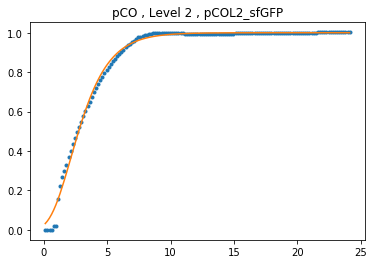

[1.61266417 1.34086526 0.06839793]
5.0161573597878135 1.070791321214803


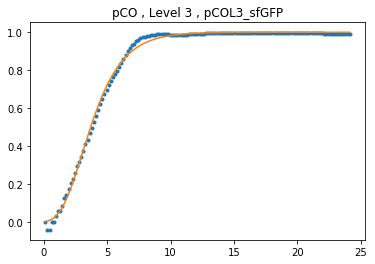

[1.81198034 0.77620313 0.15395794]
6.1225601950483135 1.1664418307450193


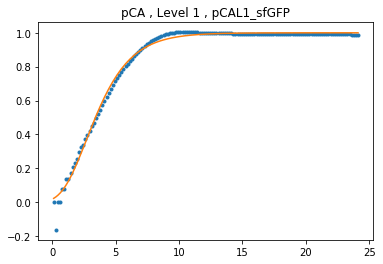

[1.9632276  0.16673247 0.21354548]
7.1222778737132275 1.2380598088805925


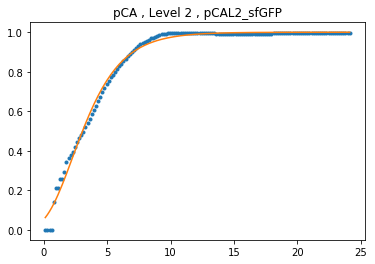

[1.8416665  0.53045649 0.09269853]
6.307040204094541 1.0971309367733764


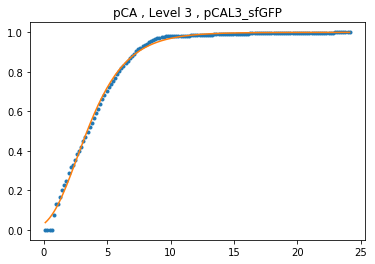

[1.82141683 0.62492315 0.13836046]
6.180609105552528 1.1483894220284308


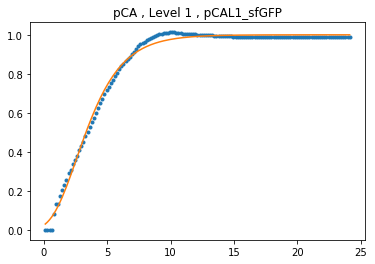

[1.96868849 0.17812685 0.22171724]
7.161278239083153 1.2482183820867234


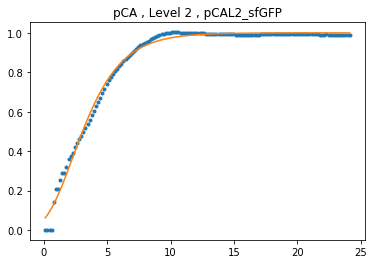

[1.84400711 0.39414827 0.04228562]
6.321819814883733 1.0431923907169016


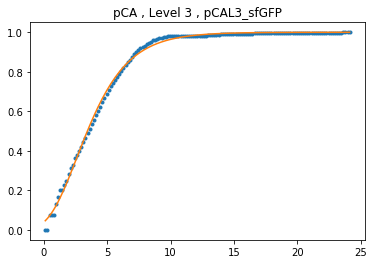

[ 1.58439478  1.39344149 -0.07076872]
4.876339238413795 0.9316773462169206


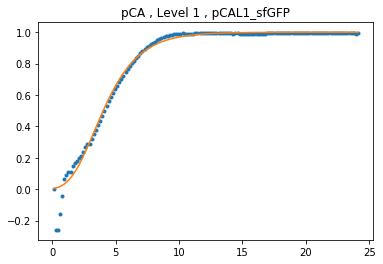

[1.98303846 0.4580089  0.29991346]
7.264783205556806 1.3497419915167752


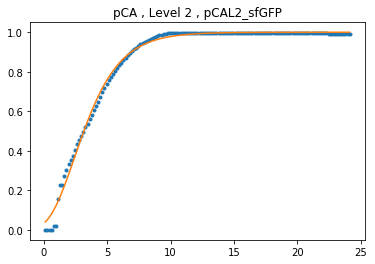

[1.7630215  0.9506551  0.05281319]
5.830026240451177 1.0542326862769107


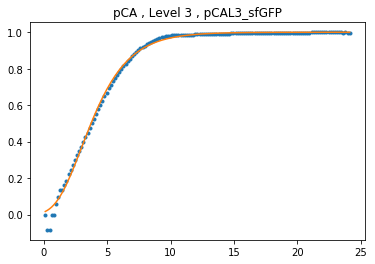

[1.96608162 0.14627224 0.25166686]
7.142634017595611 1.2861674970922687


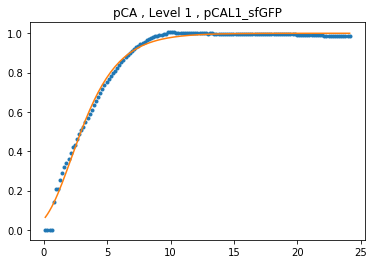

[1.96322061 0.31977017 0.23529824]
7.122228058160874 1.2652860714356227


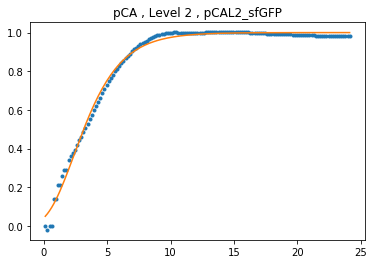

[1.98960489 0.25817456 0.26261668]
7.3126438858474465 1.30032817990471


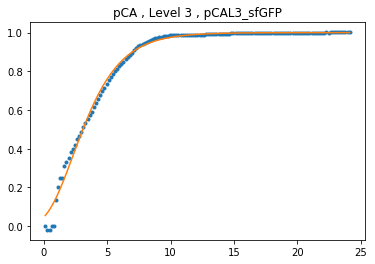

[1.74459468 0.94087209 0.06543443]
5.723581126615172 1.0676227342307654


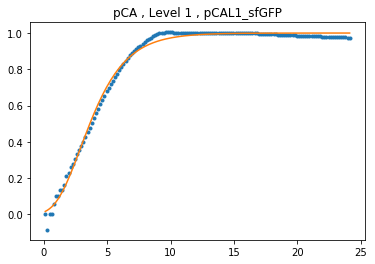

[1.97206585 0.38999373 0.29245033]
7.185505310783695 1.3397061909577728


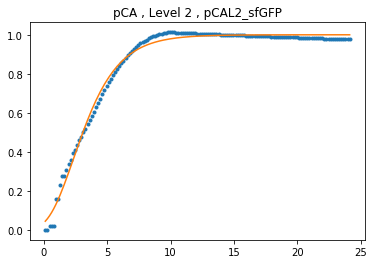

[1.84782177 0.75408    0.14213187]
6.345981466627895 1.152728650645123


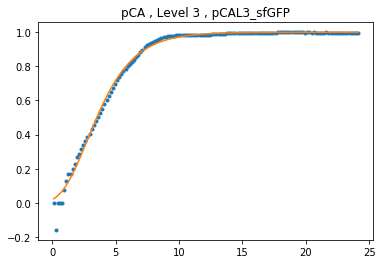

[1.98040641 0.10203967 0.21563415]
7.245687093018726 1.2406484094958303


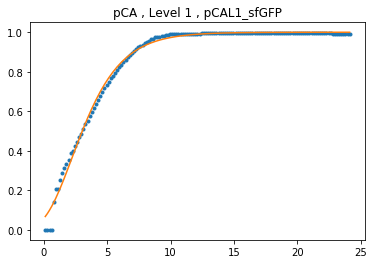

[1.99597187 0.48337241 0.29527695]
7.359351851868899 1.343498393175665


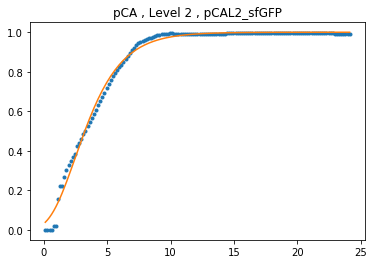

[1.99880234 0.10929647 0.21918566]
7.38021179584617 1.2450624184348789


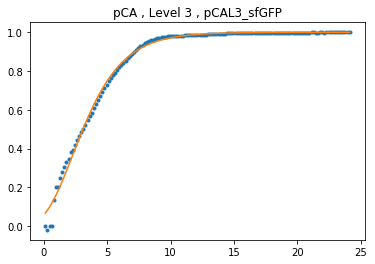

[1.74309714 0.57481824 0.10123867]
5.715016232080126 1.1065407033945616


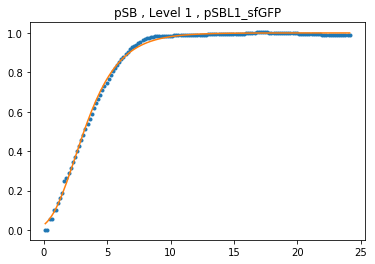

[1.73162634 0.63198234 0.05263608]
5.649835020662767 1.0540459903347719


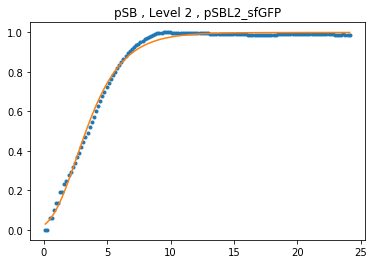

[1.81708488 0.73622608 0.18839692]
6.153892915606747 1.2073126317872467


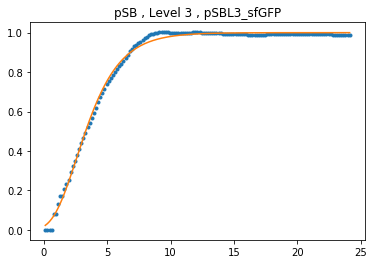

[1.82168591 0.32815022 0.08309524]
6.182272439953011 1.0866452993897289


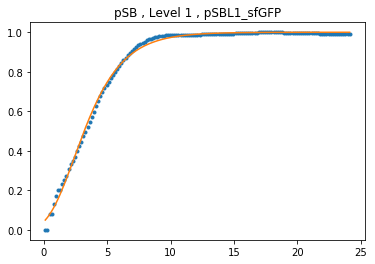

[ 1.96907898 -0.0912568   0.26088596]
7.164075227747731 1.298079621303662


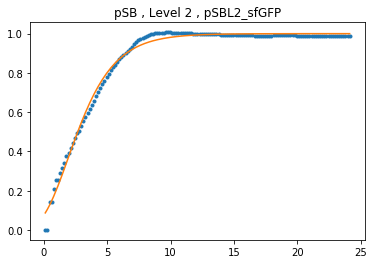

[1.96424689 0.28104226 0.31395754]
7.12954123831757 1.3688316091400483


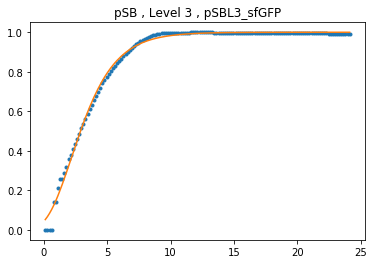

[1.8243795  0.4598697  0.11556079]
6.198947355694741 1.1225027480150274


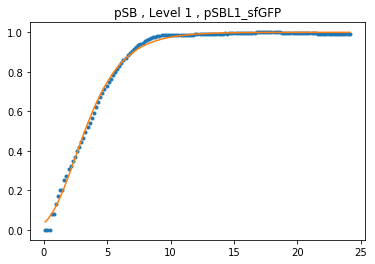

[1.81980747 0.42007691 0.13196307]
6.170670279954331 1.1410661798971866


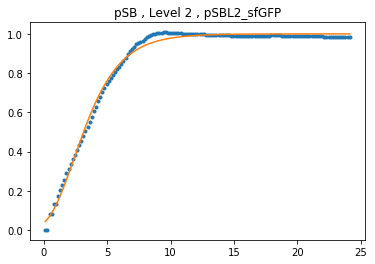

[1.9818879  0.49939954 0.40896713]
7.256429465785286 1.505262236321634


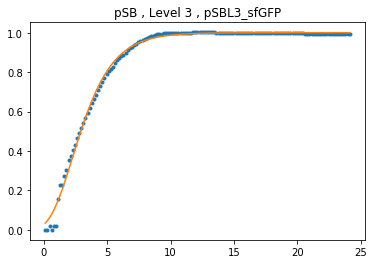

[ 1.63543571  0.73363109 -0.11814921]
5.131693463419225 0.8885634585810916


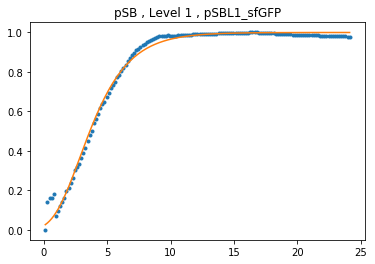

[1.8116733  0.62824394 0.18084086]
6.12068058860176 1.1982244793012844


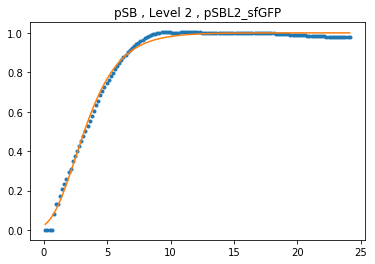

[1.96150822 0.47566769 0.36693578]
7.110042460947607 1.4433052247228828


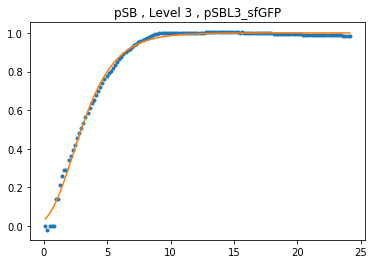

[1.82207936 0.54829878 0.12737011]
6.184705304878108 1.1358373243785544


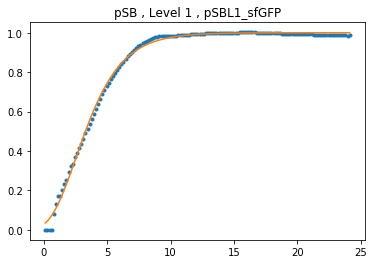

[1.95865266 0.03502896 0.27892766]
7.0897682892046285 1.3217117301743602


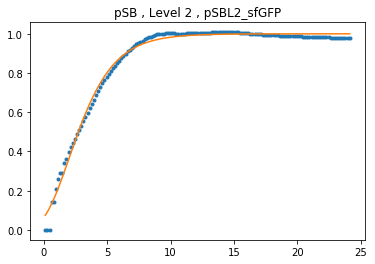

[1.97516249 0.38305414 0.37013049]
7.2077907250951245 1.447923537592888


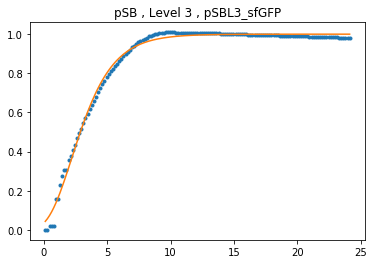

[1.83063256 0.38629331 0.10666197]
6.237831234980323 1.11255811298307


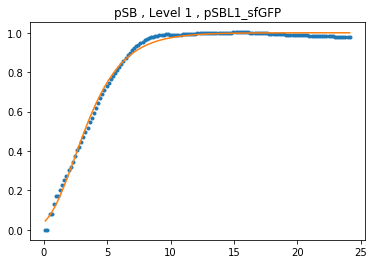

[1.82695234 0.45457785 0.10952644]
6.214916842825864 1.1157495754030364


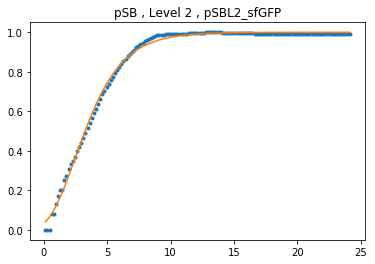

[2.00041606 0.4638464  0.38415417]
7.392131046201224 1.4683718000680492


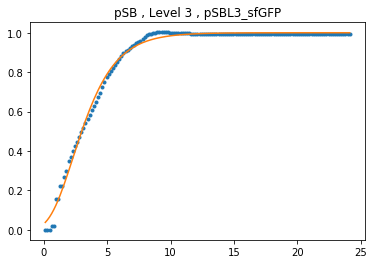

[1.73410561 0.95952926 0.16306328]
5.663859822934602 1.1771111714223395


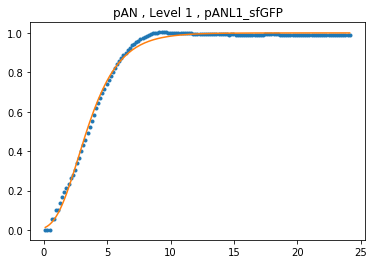

[1.66898902 1.01326251 0.21404296]
5.306800023847472 1.2386758656223562


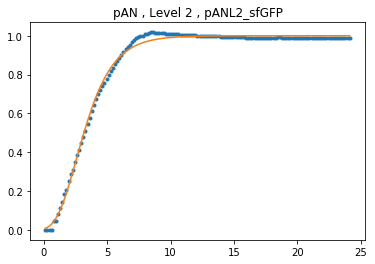

[1.66477465 0.84931797 0.10497722]
5.284482267069936 1.1106853060379065


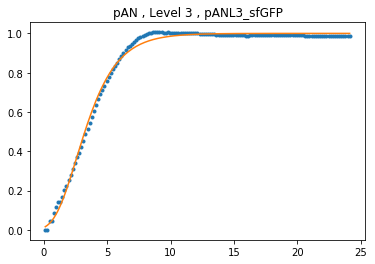

[1.73414016 1.10220767 0.20664751]
5.664055517313578 1.229549094665426


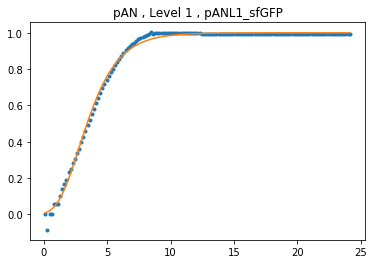

[1.80949443 0.59227961 0.31754803]
6.107358952622641 1.3737552183086401


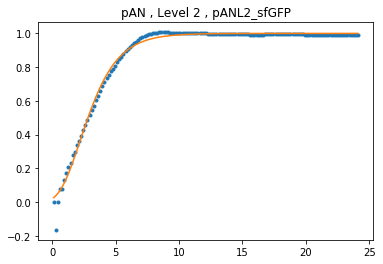

[1.80984265 0.65905554 0.27355092]
6.109486039735931 1.3146242948650906


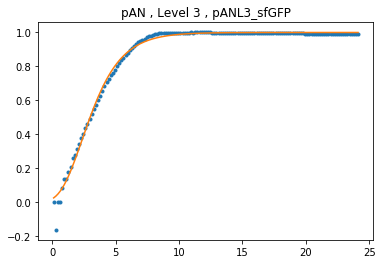

[1.96829802 0.42271896 0.393581  ]
7.158482490092285 1.4822793455681378


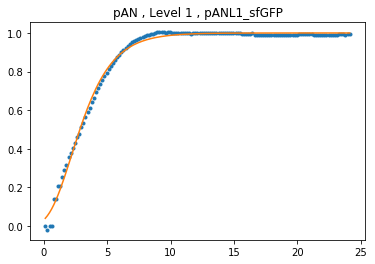

[1.8034626  0.44550553 0.26156852]
6.070631262788664 1.2989659415938544


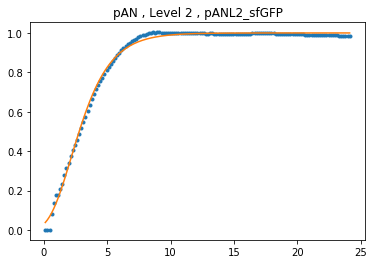

[1.81708155 0.55331242 0.22636333]
6.1538724494094525 1.2540312048403337


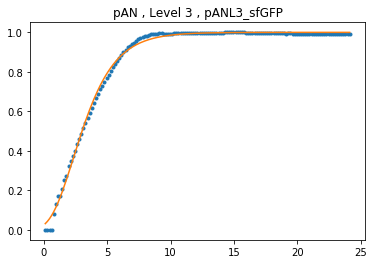

[1.96958935 0.25230179 0.34252478]
7.167732454581456 1.4084992509578895


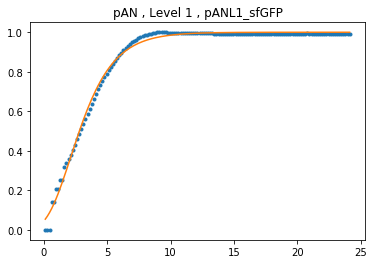

[1.80484264 0.62176409 0.32887429]
6.079014752150653 1.3894031821811226


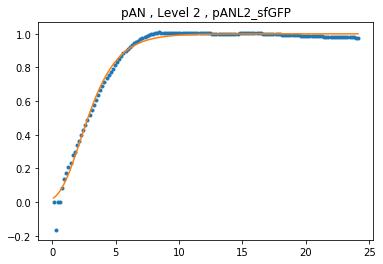

[1.8126812  0.50370906 0.23186431]
6.126852735322404 1.2609486221519441


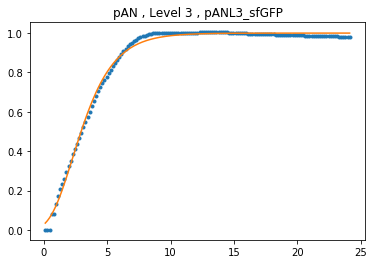

[1.96989762 0.13795155 0.31416885]
7.169942378241925 1.3691208865327336


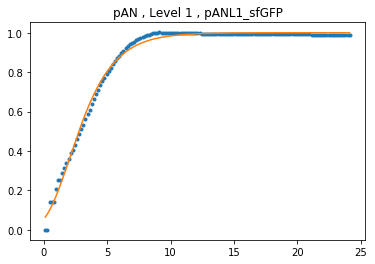

[1.71954289 0.81832671 0.25149799]
5.581976302256611 1.2859503182320797


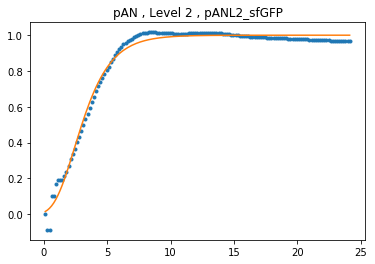

[1.8019139  0.67979512 0.27900464]
6.06123699541829 1.3218134815596


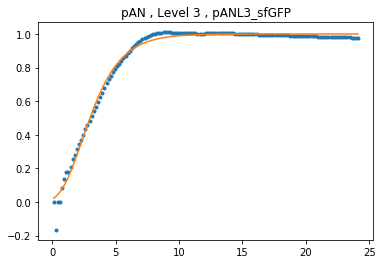

[1.9917657  0.4629992  0.43294199]
7.3284622075940025 1.5417867790208446


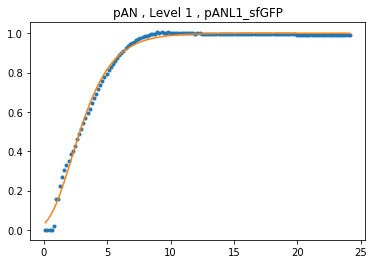

[1.82747817 0.52030382 0.28867321]
6.218185686336342 1.3346555099323034


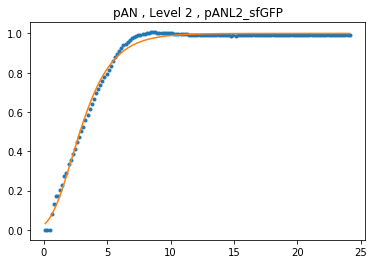

[1.82728976 0.65997215 0.27090453]
6.217014234519201 1.3111498847230703


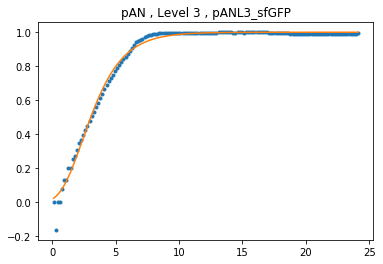

[1.97236794 0.57898196 0.63949076]
7.187676315464812 1.8955153688031046


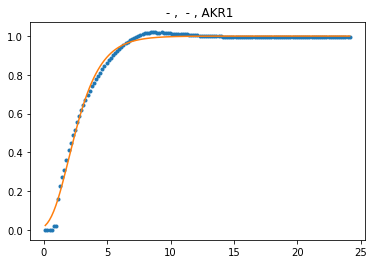

[1.79930705 0.69117067 0.39147423]
6.045456809734399 1.479159811660187


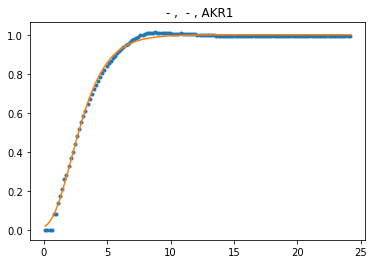

[1.95547571 0.6670388  0.62653084]
7.067280232972402 1.8711081288910982


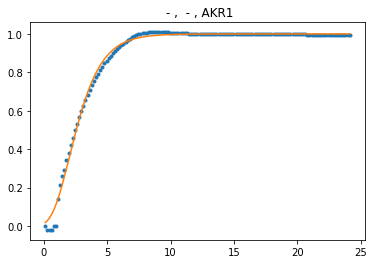

[1.71626161 0.95616447 0.34231563]
5.563690312375953 1.4082047028122446


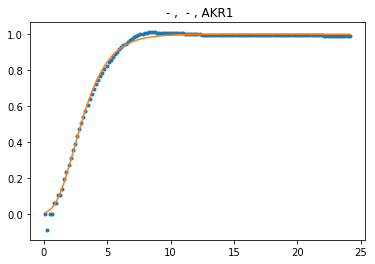

[1.97970918 0.56050344 0.63177577]
7.240636922194389 1.880947748400188


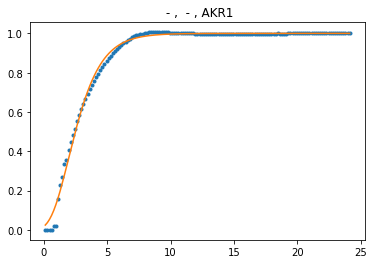

[1.96882066 0.33132838 0.53691902]
7.162224797049481 1.7107280134527345


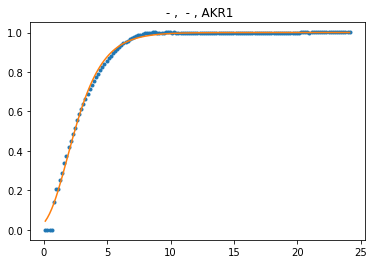

[1.80447365 0.75365509 0.33862074]
6.076772091847704 1.4030111442739903


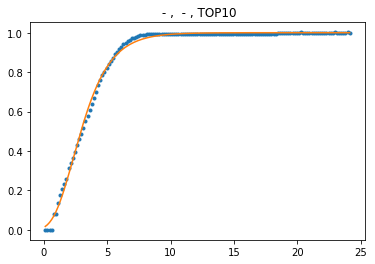

[1.72623954 1.04430792 0.30424594]
5.61948226043363 1.3556024151762611


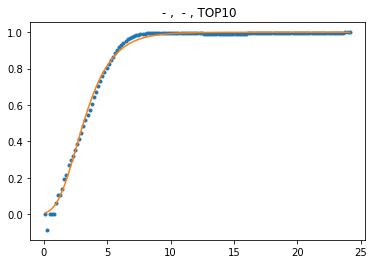

[1.72337343 0.94620758 0.24819693]
5.603399317701668 1.2817123209323944


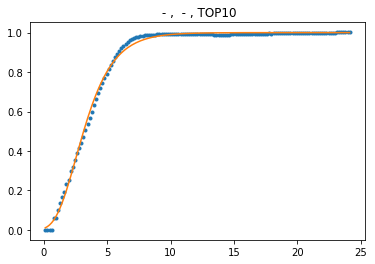

[1.72600716 1.0266737  0.28289974]
5.618176575019749 1.3269721116869737


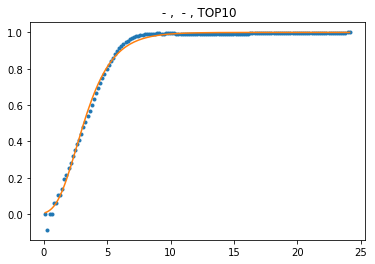

[1.98179962 0.56040763 0.55047864]
7.25578888524919 1.7340828215933137


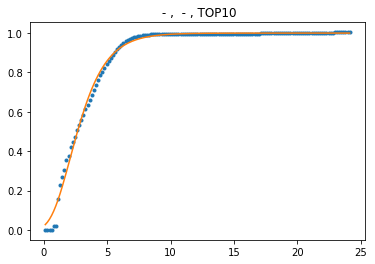

[1.9626234  0.43768821 0.49414686]
7.117975925744005 1.6390992602333305


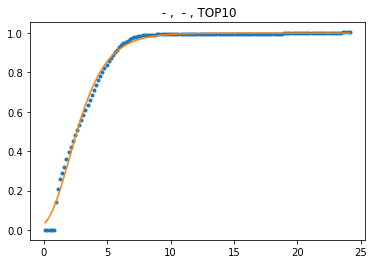

[1.71966615 0.77369636 0.08377238]
5.582664395582235 1.0873813534436418


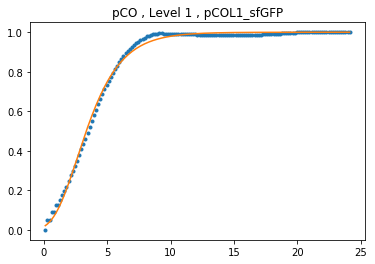

[1.79175829 0.82022554 0.24044858]
5.999992933895317 1.2718195366953493


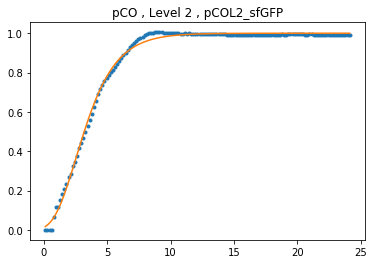

[1.91336325 0.41702703 0.22447897]
6.775839336307725 1.251670389082172


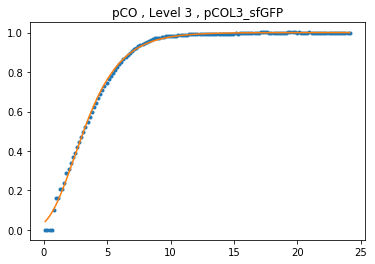

[1.90734083 0.40245525 0.32838347]
6.735155058636945 1.3887213971677472


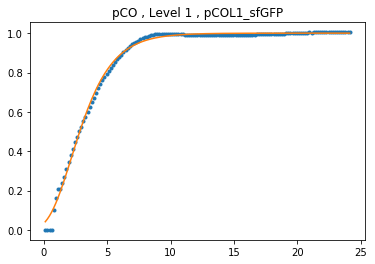

[1.89752036 0.60686909 0.33924986]
6.669336365371223 1.4038940752996216


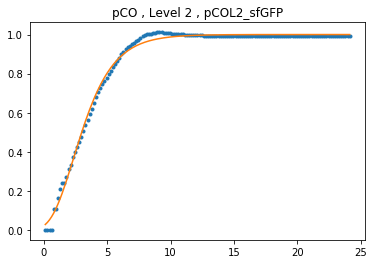

[1.90317208 0.47106933 0.26079175]
6.7071362963907974 1.2979573352475489


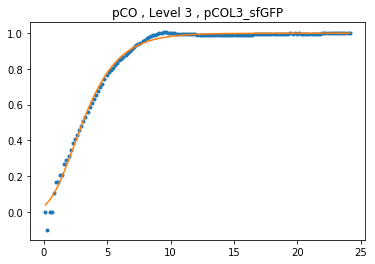

[1.80582619 0.59248155 0.2231066 ]
6.084996747447438 1.249953816595805


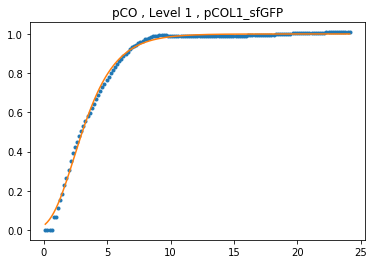

[1.89384291 0.40499761 0.26433776]
6.644855239632941 1.3025680719372448


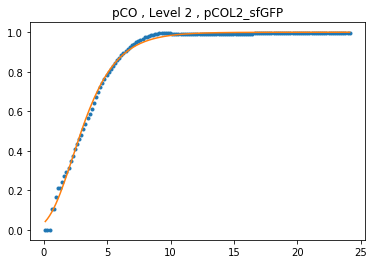

[ 1.90476787 -0.62460806  0.05679458]
6.717848053817022 1.0584383684158045


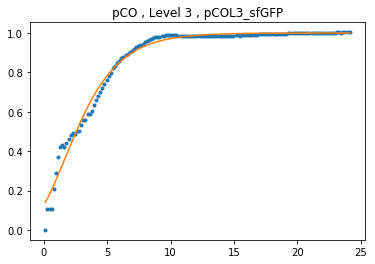

[1.91609328 0.33856713 0.33644244]
6.794362865172753 1.3999582820452827


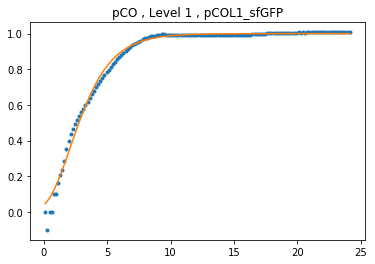

[1.9044417  0.55861628 0.3351499 ]
6.715657235030576 1.3981499540593185


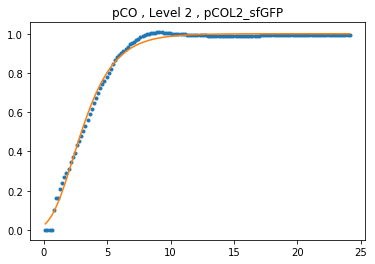

[1.79332245 0.49594377 0.085215  ]
6.00938520169006 1.0889511627934565


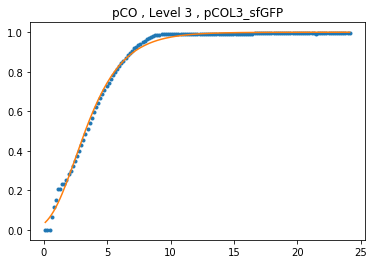

[1.91967009 0.25731283 0.33207902]
6.818708540986478 1.3938629819541624


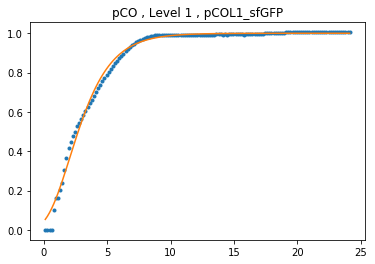

[1.90463804 0.13238928 0.2043027 ]
6.716975929725736 1.2266694068592696


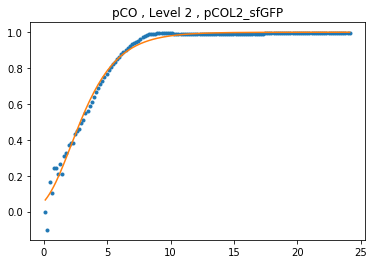

[1.99956892 0.06192955 0.31626508]
7.385871543611783 1.3719938946019195


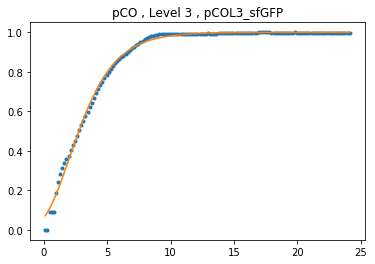

[1.81319335 0.45662203 0.18426968]
6.129991387915515 1.2023400232738282


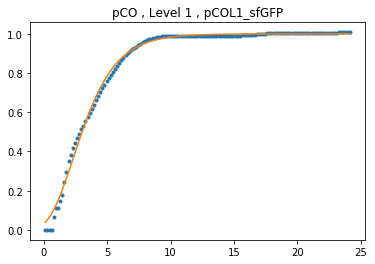

[1.79257955 1.11395253 0.3331098 ]
6.00492251229656 1.3953004929861386


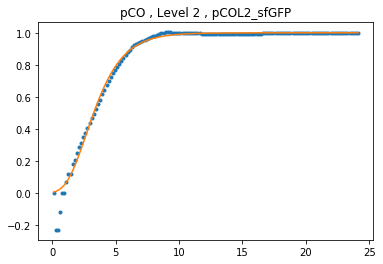

[1.89690622 0.34211749 0.21111711]
6.665241737341449 1.2350569847554624


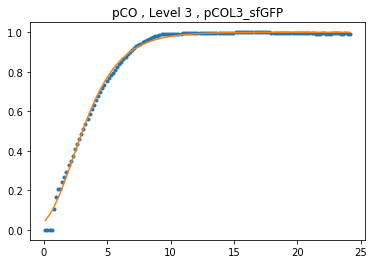

[1.90090067 0.70085012 0.28975356]
6.691918948506528 1.3360981850407705


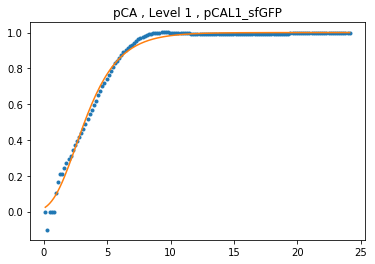

[1.79318255 0.70971474 0.08747667]
6.0085445485432025 1.0914168028260989


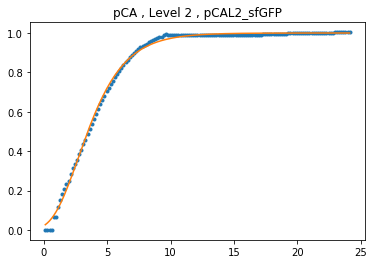

[2.01807775 0.46152934 0.28441771]
7.523848303085757 1.3289879499507082


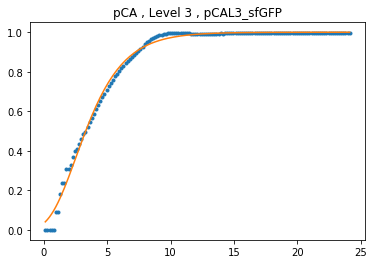

[1.71264388 1.19111739 0.13639946]
5.543598752498608 1.1461396416587808


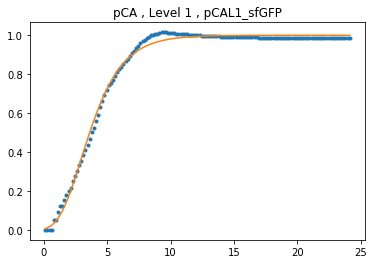

[1.79951175 0.91024749 0.17018764]
6.046694431638355 1.1855272824866159


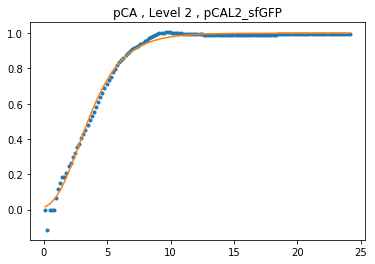

[1.9195291  0.57979382 0.14330933]
6.8177472229369975 1.154086734865806


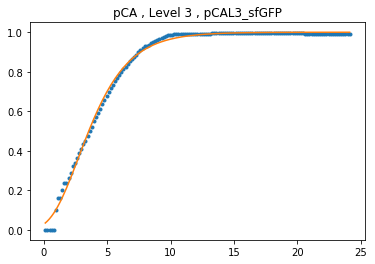

[1.7836858  0.85055443 0.17525509]
5.951753004192486 1.1915501311705403


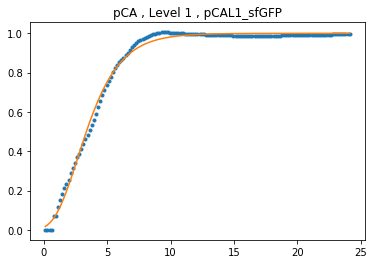

[1.90555897 0.55796772 0.22977901]
6.723164603527465 1.2583219062470161


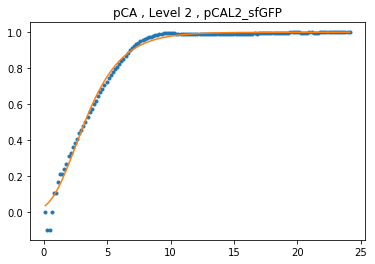

[1.91854251 0.52038289 0.12814202]
6.811024225550933 1.136714426432642


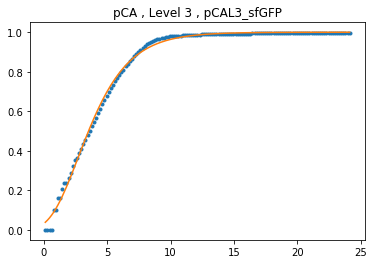

[1.89723283 0.44605377 0.19979618]
6.6674190106448075 1.2211538373959812


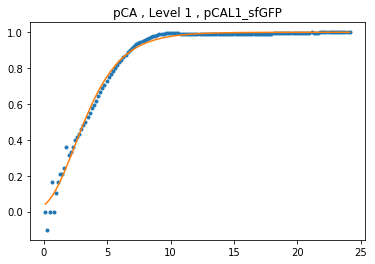

[1.89926015 0.27115252 0.14207605]
6.680949711262338 1.1526643072166365


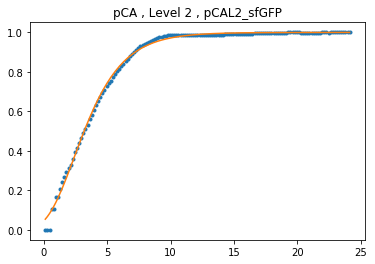

[1.81493464 1.01830677 0.05596103]
6.140674794233203 1.057556474744178


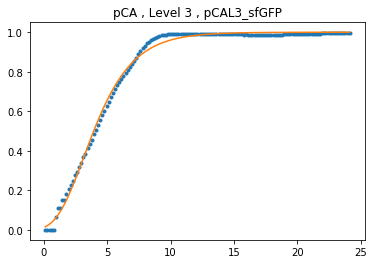

[1.79082242 0.67059444 0.04598327]
5.99438032484685 1.047056896289059


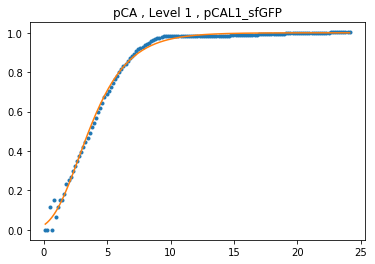

[1.9039184  0.12493337 0.09313455]
6.712143856373375 1.097609405783896


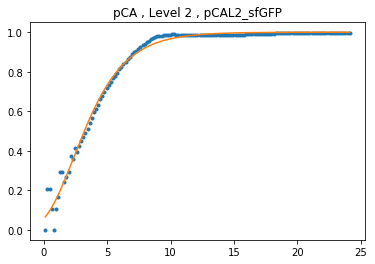

[1.9207374  0.58343614 0.14617591]
6.82599010299492 1.1573997647175729


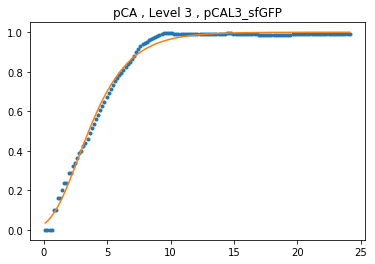

[1.9080297  0.39700746 0.18883272]
6.7397962931094675 1.2078388830727456


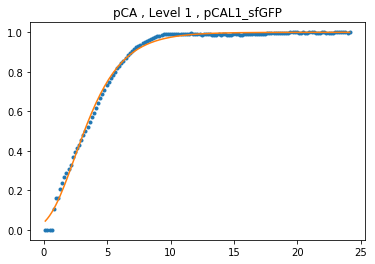

[1.79113838 0.60417804 0.0666381 ]
5.996274624415012 1.0689085667018614


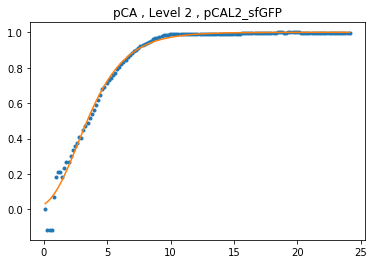

[2.01911596 0.16633251 0.22686416]
7.531663720028986 1.2546594244019795


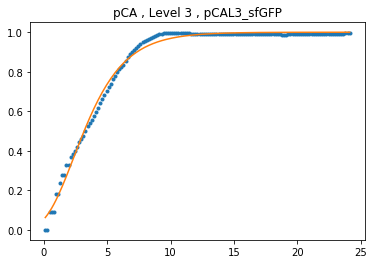

[1.80236245 0.83465713 0.09989874]
6.063956332900126 1.1050590099454727


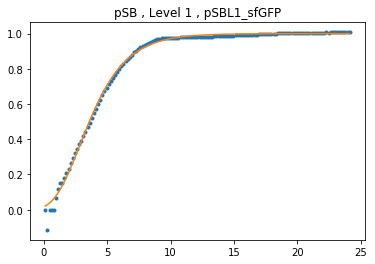

[1.79871925 0.74910416 0.10009893]
6.041904357793796 1.1052802619689976


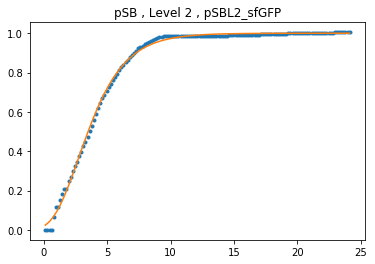

[2.00715343 0.18081124 0.18477931]
7.442102698179314 1.2029529255726439


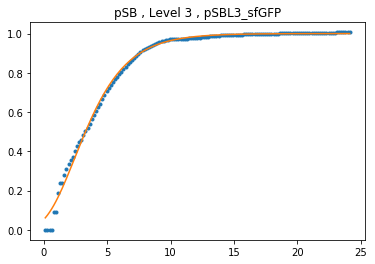

[1.79634025 0.69400498 0.09012851]
6.027547733138284 1.0943149016693692


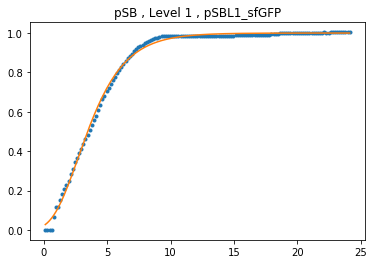

[1.90934001 0.35791558 0.19748526]
6.7486332669063955 1.2183351119807402


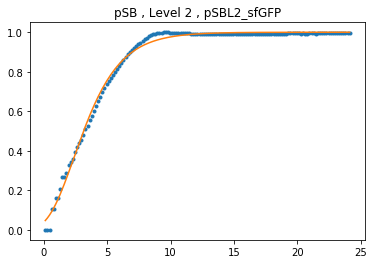

[ 1.62027154  1.69073915 -0.03729488]
5.054462629220949 0.9633920111998563


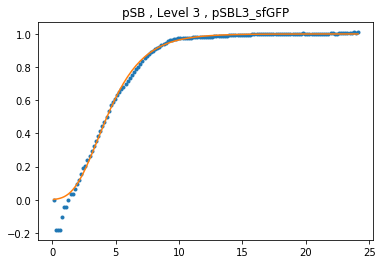

[1.73328849 0.86423851 0.06658277]
5.6592337033438245 1.068849427384817


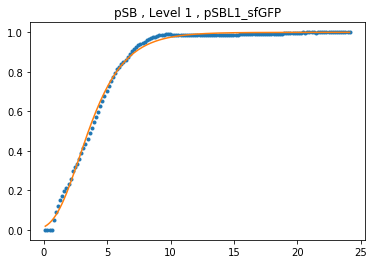

[ 1.80447919  0.12322888 -0.0578165 ]
6.0768057550435355 0.9438231209158674


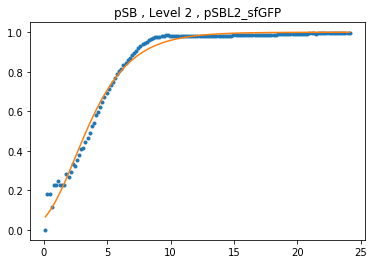

[ 1.80032933  0.7126708  -0.00588903]
6.051640146776857 0.9941282718823632


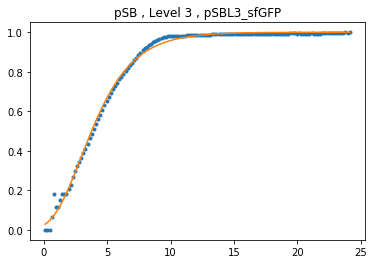

[ 1.74274946  0.4589202  -0.01696891]
5.713029570048821 0.9831742531549371


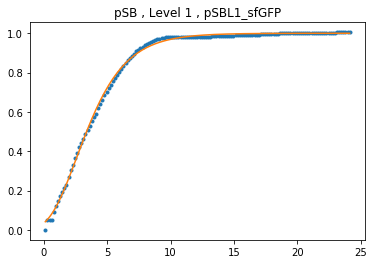

[ 1.81456471 -0.15210873 -0.0720625 ]
6.138403606994081 0.9304727378275316


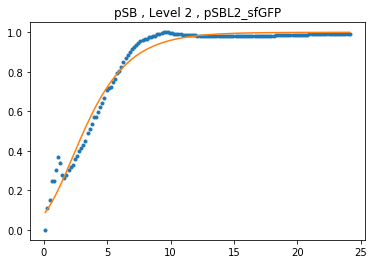

[1.99529565 0.30547819 0.22081925]
7.354377035301427 1.2470979990282418


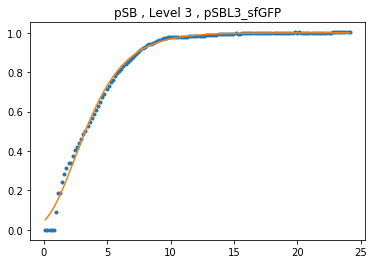

[1.81491068 0.42346155 0.09342389]
6.140527708889201 1.0979270390870952


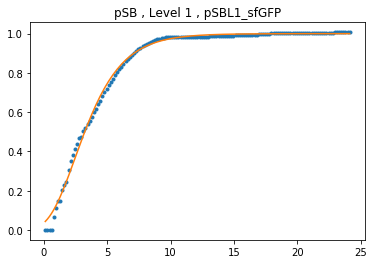

[1.80010383 0.9468698  0.14420725]
6.050275617153862 1.155123488411428


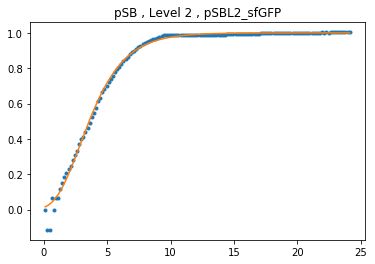

[1.91140304 0.33420638 0.0849764 ]
6.762570327816406 1.0886913736542407


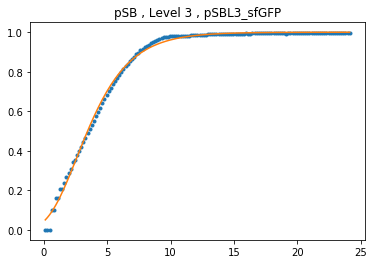

[1.74312771 0.64588307 0.04509515]
5.715190935296349 1.0461273912339115


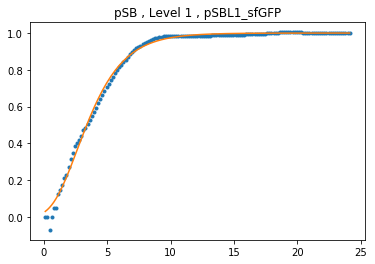

[1.90967461 0.34042734 0.18483215]
6.750891771404151 1.2030164924733924


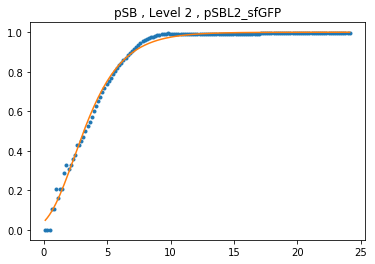

[1.79316705 0.79426599 0.02001166]
6.008451411834796 1.0202132379400544


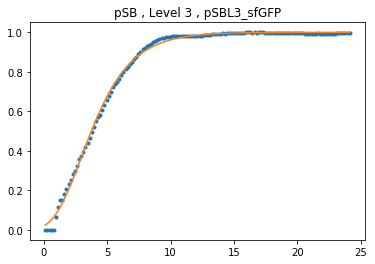

[1.90482216 0.59607989 0.368885  ]
6.7182127318715175 1.4461212924363034


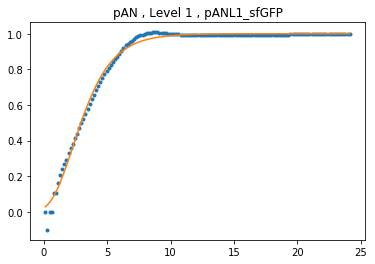

[1.89448507 0.68315129 0.31913685]
6.6491237213047 1.375939604859013


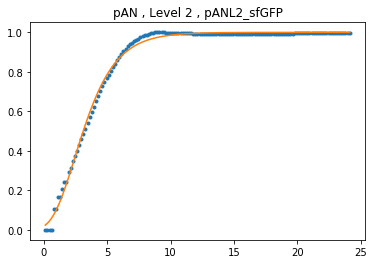

[ 2.00543235 -0.05185855  0.32180302]
7.429305292067181 1.3796129917491156


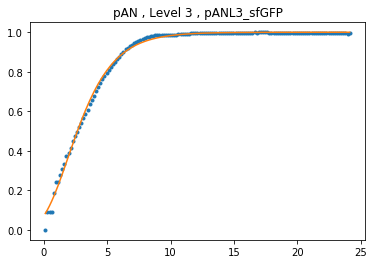

[1.89224958 0.6358762  0.35792472]
6.634276263805111 1.4303579421106822


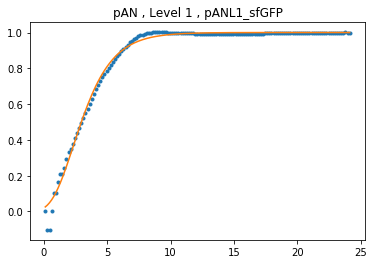

[ 1.99690501 -0.00805476  0.30024604]
7.366222371338815 1.3501909634192204


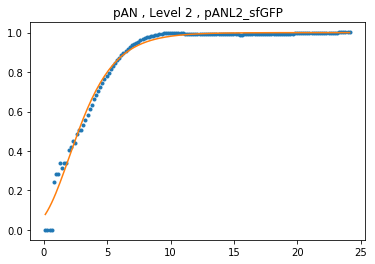

[1.90105989 0.42066587 0.28136577]
6.6929845310827645 1.32493813526464


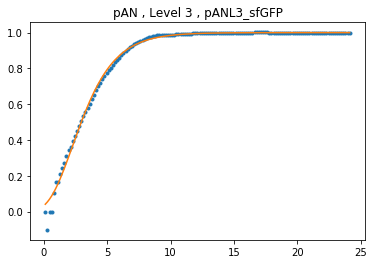

[1.89576776 0.52196926 0.32583607]
6.657657914565244 1.3851882732389083


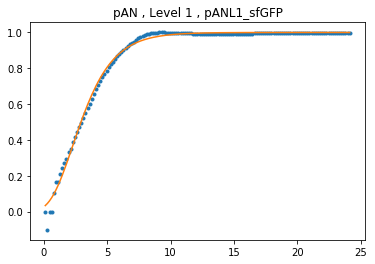

[1.98919458 0.55053287 0.44200042]
7.309644034790085 1.5558163878529903


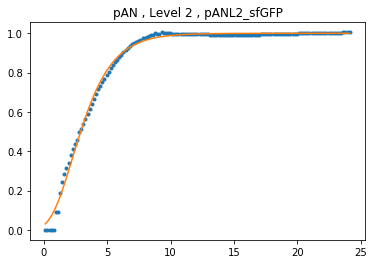

[1.88874749 0.28696342 0.23396506]
6.61108307069959 1.263600344842559


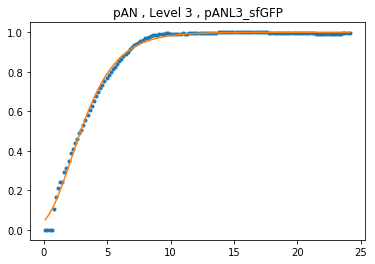

[1.80105446 0.56799754 0.17297605]
6.056029918080394 1.18883763521513


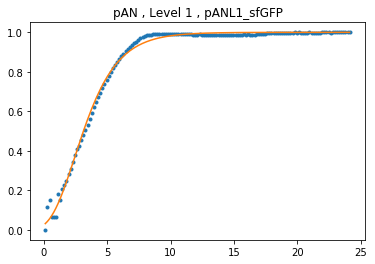

[ 1.99908765 -0.27545814  0.22892291]
7.382317803848036 1.257245117738742


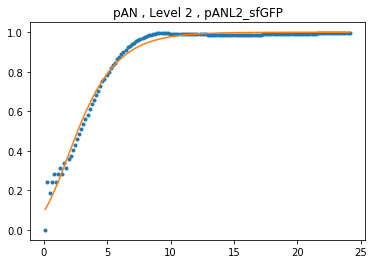

[1.8935585  0.18470183 0.2363237 ]
6.64296563347503 1.2665842399173957


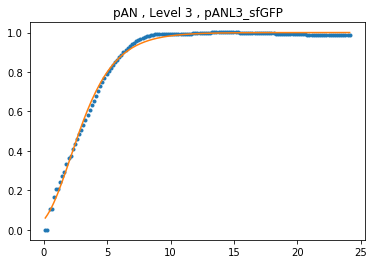

[1.8100331  0.70328996 0.26264199]
6.110649692670045 1.3003610883370464


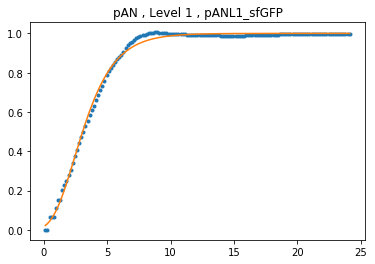

[1.66530484 1.73491884 0.25044414]
5.287284800021142 1.2845958323560622


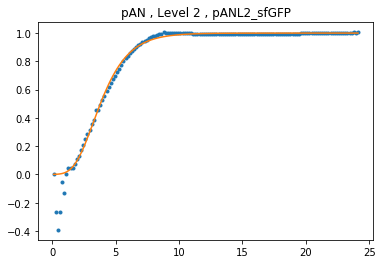

[1.71038593 0.89014694 0.11071712]
5.531095695405289 1.1170788612169247


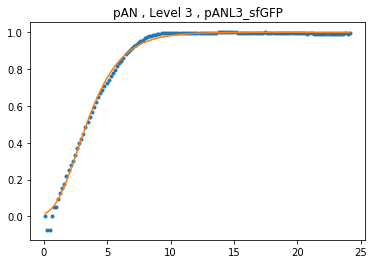

[1.91177053 0.45250985 0.35358894]
6.765055905129339 1.4241696473611383


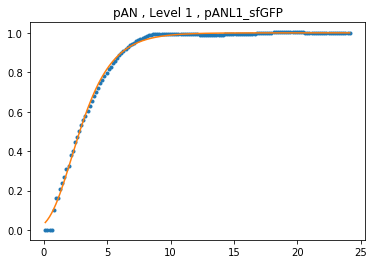

[1.79107209 1.17120586 0.29458426]
5.995877122356194 1.3425680827855346


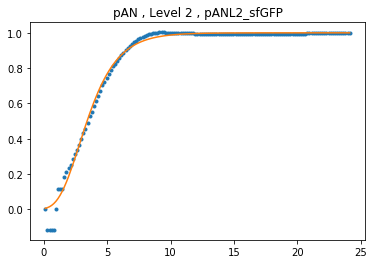

[1.64401635 1.3251143  0.13861711]
5.175916128691228 1.1486841935312386


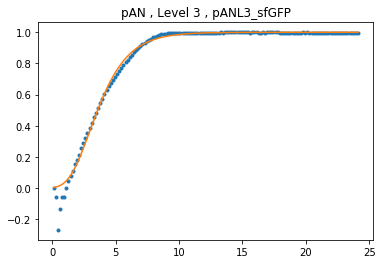

[1.91516542 0.71389878 0.41940488]
6.788061607965381 1.5210560826050121


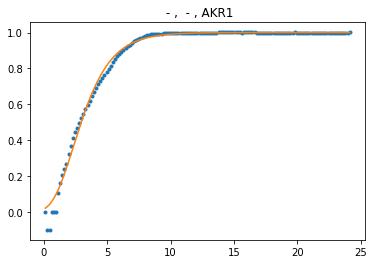

[1.90834149 0.80370686 0.44195509]
6.7418980050932795 1.555745867213082


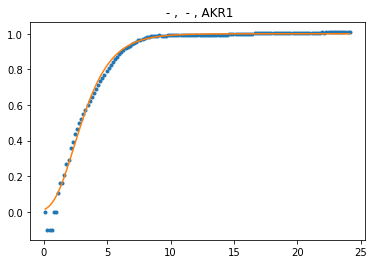

[1.80403401 0.7909105  0.26051215]
6.074101091717936 1.2975944755519793


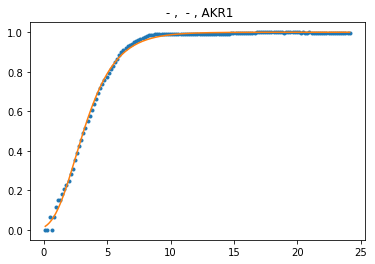

[1.90249074 0.5968591  0.31633445]
6.702568011023902 1.3720890766505283


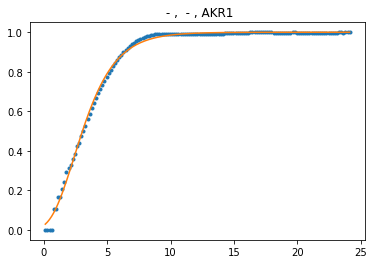

[1.89888212 0.52864572 0.29294248]
6.678424598678378 1.3403656850313392


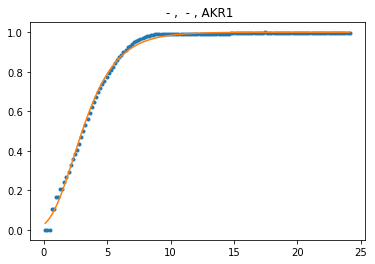

[1.7164944  0.72792306 0.05542432]
5.564985636585025 1.0569890159736899


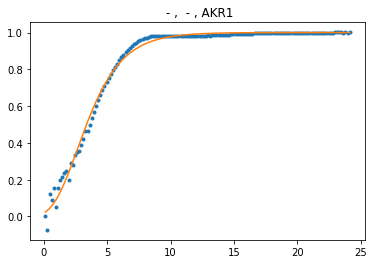

[1.90749381 0.4158551  0.39756558]
6.73618546858647 1.4881973850215797


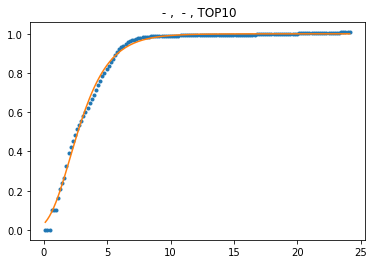

[1.59375598 1.57106528 0.22971855]
4.922201960316 1.2582458288968923


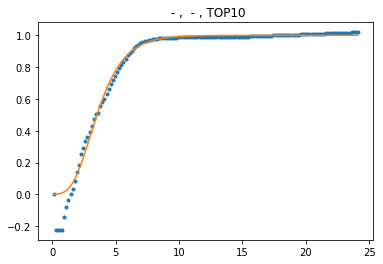

[1.79220221 0.94623913 0.33058276]
6.0026570454009445 1.391778970825911


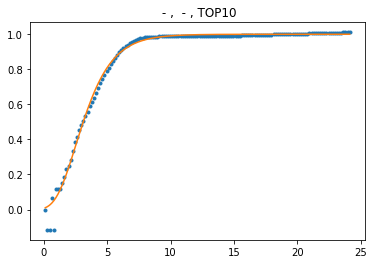

[1.62703547 1.28816624 0.1426843 ]
5.088766512011962 1.1533656304387772


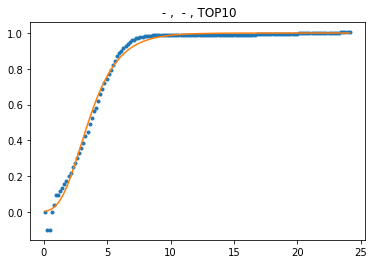

[1.73199263 0.64791752 0.13250497]
5.6519048366397 1.1416846958554934


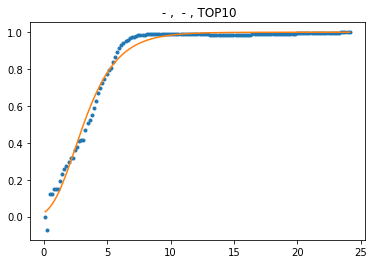

[1.40068768 2.03515942 0.05855787]
4.057989601641568 1.060306346782298


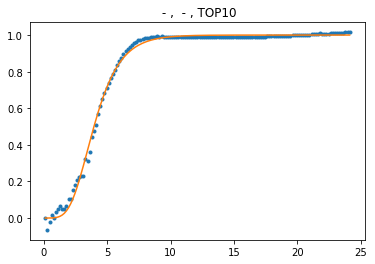

In [118]:
#Perform the fitting
pg0 = [1, 3, 0.5]
params = {}

for cat in book_cats:

    params[cat] = {}
    time = daux[cat]['OD600']['time']
    for i in range(log_AA0[cat].shape[1]):
        well_num=i

        gomp=function_fit(time,log_AA0[cat][:,well_num:well_num+1], func = f_gompertz, param0 = pg0, param_bounds = ([0.1,-1,-2],[2.5,7,2]))
        #[max growth, lac delay, mu]
        params[cat][i] = [np.exp(gomp['z'][0][0]), gomp['z'][0][1], np.exp(gomp['z'][0][2])]
        print(np.exp(gomp['z'][0][0]),np.exp(gomp['z'][0][2]))
        plt.plot(time, log_AA0[cat][:,well_num:well_num+1]/np.exp(gomp['z'][0][0]),'.')
        plt.plot(time, gomp['evalF']/np.exp(gomp['z'][0][0]),'-')
        #plt.ylim([-0.1,1])

        plt.title(well_labels[i])
        plt.show()

Next block is used to make the graphs with the format shown in the supplementary information (i.e. all with the same axis range)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


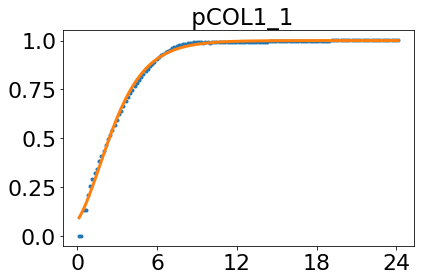

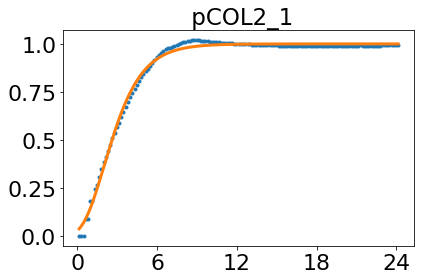

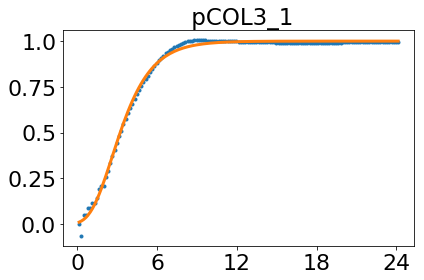

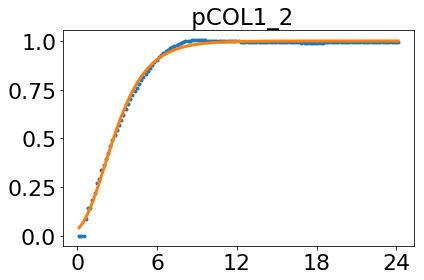

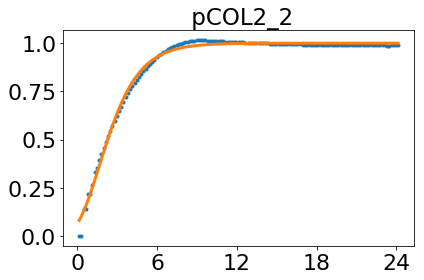

...

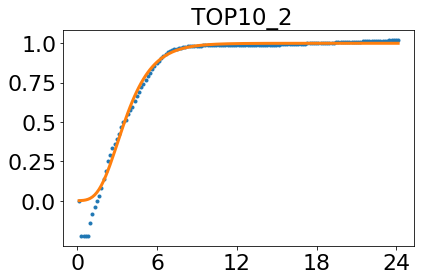

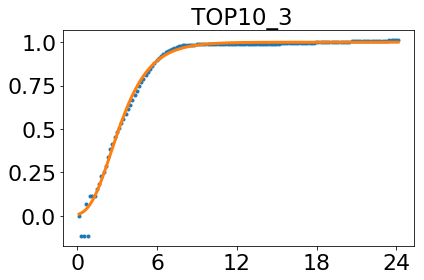

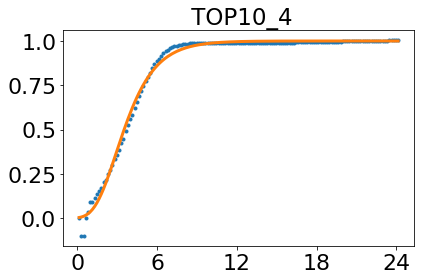

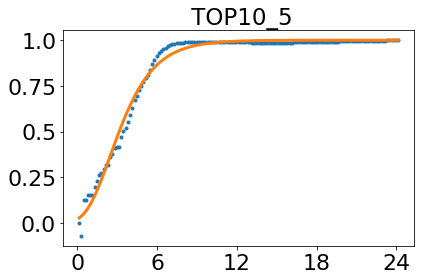

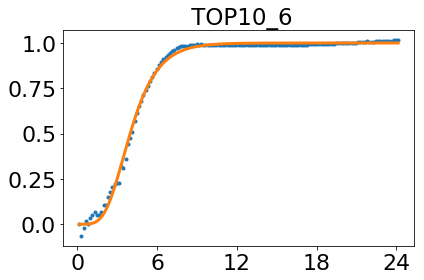

In [119]:
# plot linear fits

data_serie = 'OD600'
xGroup = 'time'
yGroup = 'data'

plasmids = ['pCO', 'pCA', 'pSB', 'pAN', 'AKR1']
fit_name = xGroup+'_'+yGroup+'_linear'

folder = 'V3_Plots/OD600/'  #where to save the image

data_sets = list(s_data.keys())

# find the max and min values to fix the axis of plots

x_max = []
x_min = []
y_max = []
y_min = []

for sets in data_sets:
    x_max.append(s_data[sets]['data_sheets'][data_serie][xGroup].max())
    x_min.append(s_data[sets]['data_sheets'][data_serie][xGroup].min())
    y_max.append(s_data[sets]['data_sheets'][data_serie][yGroup].max())
    y_min.append(s_data[sets]['data_sheets'][data_serie][yGroup].min())  

x_max = max(x_max)
x_min = min(x_min)
y_max = max(y_max)
y_min = min(y_min)

# make the plots

for sets in data_sets:
    
    sub_folder = folder + sets.split('python')[0][0:-2] + '/'
    x_vals = s_data[sets]['data_sheets'][data_serie][xGroup]
    y_vals = s_data[sets]['data_sheets'][data_serie][yGroup]
    vector_counter = {}
    
    #for p in plasmids:
    #    vector_counter[p] = 0
    #plt.figure()
    
    for i in range(y_vals.shape[1]):
        
        x_vals_i = x_vals[:]
        y_vals_i = y_vals[:,i]

        
        vector_id = well_labels[i].split(',')[2].split('_')[0]
        title = vector_id
        
        #counte the number of replicate
        if vector_id in vector_counter.keys():
            vector_counter[vector_id] = vector_counter[vector_id] +1
        else:
            vector_counter[vector_id] = 1
        
        title = title +'_' + str(vector_counter[vector_id])
        
        #for p in plasmids:

            #if p in vector_id: # if plasmid name is in the vector identifier
         #       vector_counter[p] = vector_counter[p] + 1
         #       title = title +'_' + str(vector_counter[p])
        
                
            
        plt.figure()        
        #plt.plot(x_vals_i, y_vals_i,'.')
        
        
        plt.plot(x_vals, log_AA0[sets][:,i]/(params[sets][i][0]),'.')
        
        eval_params = [np.log(params[sets][i][0]), params[sets][i][1], np.log(params[sets][i][2])]
        eval_gomp = f_gompertz(x_vals, *eval_params)
        
        plt.plot(x_vals, eval_gomp/(params[sets][i][0]),'-', linewidth = 3)
        

        #plt.xticks(rotation = 45)
        #plt.ylabel('OD600 [A.U.]')
        #plt.xlabel('Time [h]')
        #plt.ylim([-20000, y_max*1.05])
        #plt.xlim([-5000, x_max*1.03])
        plt.xticks(np.arange(0,25,6), np.arange(0,25,6), fontsize = 22)
        plt.yticks(np.arange(0,1.1,0.25), np.arange(0,1.1,0.25), fontsize = 22 )
        plt.title(title, fontsize = 23)
        plt.tight_layout()  # to avoid axis text keep out the image
        #plt.show()
        #plt.savefig(sub_folder+title+".png", transparent=True)

In [120]:
#### this block is to manipulate the well label list to make the specific plot which mix strain label with plasmid
new_label_list = []
for label in well_labels:
    s_label = label.split(',')
    
    if s_label[0] == ' - ':
        n_label = s_label[2] + ',' + s_label[0]
    else:
        n_label = s_label[0] + ',' + s_label[1]
        
    new_label_list.append(n_label)

    
well_labels = new_label_list

nr_wellList = non_redundant_list(well_labels)
colors_labels = plt.cm.jet(np.linspace(0, 1, len(nr_wellList)))

print('Current categories are: ')
nr_wellList

Current categories are: 


['pCO , Level 1 ',
 'pCO , Level 2 ',
 'pCO , Level 3 ',
 'pCA , Level 1 ',
 'pCA , Level 2 ',
 'pCA , Level 3 ',
 'pSB , Level 1 ',
 'pSB , Level 2 ',
 'pSB , Level 3 ',
 'pAN , Level 1 ',
 'pAN , Level 2 ',
 'pAN , Level 3 ',
 ' AKR1, - ',
 ' TOP10, - ']

In [121]:
get_dict_cathegories(params[book_cats[0]])
mu_list = []

for cat in book_cats:
    fit_wells=get_dict_cathegories(params[cat])
    for well in fit_wells:
        w_p = params[cat][well]
        mu = w_p[2]
        mu_list.append(mu)

mu_arr=np.zeros(len(mu_list))
for i in range(len(mu_list)):
    mu_arr[i]=mu_list[i]



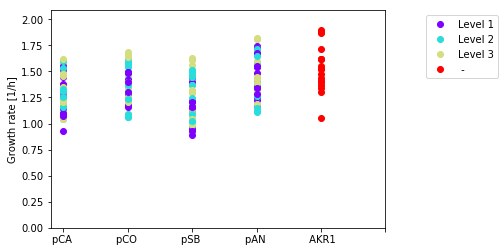

In [322]:
plasmids = ['pCA ', 'pCO ', 'pSB ', 'pAN ', ' AKR1']
lvls = ['Level 1', 'Level 2', 'Level 3', ' - ']
colors_labels = plt.cm.rainbow(np.linspace(0, 1, len(lvls))) # el tercer elemento es el número de colores

# "tokens" are to make sure only add each legend one time
token = []
token_aux = []

for i in range(len(lvls)):
    token.append(True)
    token_aux.append(True)
    
plot_aux = []
dot_labels = []
# to compute mean and std_dev
mu_organized = {}

for setn in data_sets:
    
    mu_organized[setn] = {}
    wells = s_data[setn]['Labels']          
            
    for j in range(len(plasmids)):
        mu_organized[setn][plasmids[j]] = {}
        
        for lvl in lvls:
            mu_organized[setn][plasmids[j]][lvl] = {}
            mu_organized[setn][plasmids[j]][lvl]['values'] = []

        for i in range(len(wells)):
            
            mu_i = params[setn][i][2]
            add_aux = False
            if plasmids[j] in wells[i]:       

                for m in range(len(lvls)):
                    if lvls[m] in wells[i]:
                        mu_organized[setn][plasmids[j]][lvls[m]]['values'].append(mu_i)
                        colord = colors_labels[m]
                        token[m] = False
                        label_aux = lvls[m]


                p, = plt.plot(j,mu_i, 'o', color=colord)             

                for n in range(len(token)):
                    if token[n] != token_aux[n]:
                        add_aux = True
                        token_aux[n] = False

                if add_aux == True:
                    plot_aux.append(p)
                    dot_labels.append(label_aux)
                    add_aux = False

    #plt.title()
    plt.ylabel('Growth rate [1/h]')
    plt.legend(plot_aux,dot_labels, loc = 'upper right', bbox_to_anchor=(1.35, 1))
    x_points = np.arange(len(plasmids)+1)
    plt.xticks(x_points,plasmids)
    plt.ylim([0,max(mu_list)*1.1])

Then, compute its statistics

In [323]:
confidence = 0.95
CI_name = 'CI_'+str(confidence)

for setn in data_sets:
    
    for plasm in plasmids:

        plasm_values = []    #create the list to save all the ro values for the plasmid

        for lvl in lvls:
            
            plasm_values.extend(mu_organized[setn][plasm][lvl]['values'])
            mu_values = np.asarray(mu_organized[setn][plasm][lvl]['values'])
            
            std_err = sem(mu_values)

            mu_organized[setn][plasm][lvl]['mean'] = np.mean(mu_values) 
            mu_organized[setn][plasm][lvl]['std'] = np.std(mu_values,dtype=np.float64, ddof = 1)
            mu_organized[setn][plasm][lvl]['sem'] = std_err
            mu_organized[setn][plasm][lvl][CI_name] = std_err * t.ppf((1 + confidence) / 2, len(mu_values) - 1)
       
    
        #compute the plasmid statistics
    
        arr_plasm = np.asarray(plasm_values)[~np.isnan(np.asarray(plasm_values))]
        p_mean = np.mean(arr_plasm)
        p_std = np.std(arr_plasm,dtype=np.float64, ddof = 1)
        
        mu_organized[setn][plasm]['mean'] = p_mean
        mu_organized[setn][plasm]['std'] = p_std      
        mu_organized[setn][plasm]['sem'] = sem(arr_plasm)
        mu_organized[setn][plasm][CI_name] = p_std * t.ppf((1 + confidence) / 2, len(arr_plasm) - 1)
        mu_organized[setn][plasm]['CV'] = 100*(p_std/np.abs(p_mean))

for plasm in plasmids:
    mu_organized[plasm] = {}
    plasm_values = []
    
    for lvl in lvls:
        mu_organized[plasm][lvl] = {}
        set_values = []
        
        for setn in data_sets:
            set_values.append(mu_organized[setn][plasm][lvl]['mean'])  #set value
        
        plasm_values.extend(set_values)
        
        mu_mean = np.mean(np.asarray(set_values))
        mu_std = np.std(np.asarray(set_values),dtype=np.float64, ddof = 1)
        mu_sem = sem(set_values)
        
        mu_organized[plasm][lvl]['mean'] = mu_mean
        mu_organized[plasm][lvl]['std'] = mu_std
        mu_organized[plasm][lvl]['sem'] = mu_sem
        mu_organized[plasm][lvl][CI_name] = mu_sem * t.ppf((1 + confidence) / 2, len(set_values) - 1)
    
    #by plasmid
    plasm_values = np.asarray(plasm_values)[~np.isnan(np.asarray(plasm_values))] # eliminate nan values
    
    p_mean = np.mean(plasm_values)
    p_std = np.std(plasm_values,dtype=np.float64, ddof = 1)
    p_sem = sem(plasm_values)

    mu_organized[plasm]['mean'] = p_mean
    mu_organized[plasm]['std'] = p_std
    mu_organized[plasm]['CV'] = 100*(p_std/np.abs(p_mean))
    mu_organized[plasm]['sem'] = p_sem
    mu_organized[plasm][CI_name] = p_sem * t.ppf((1 + confidence) / 2, len(plasm_values) - 1)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


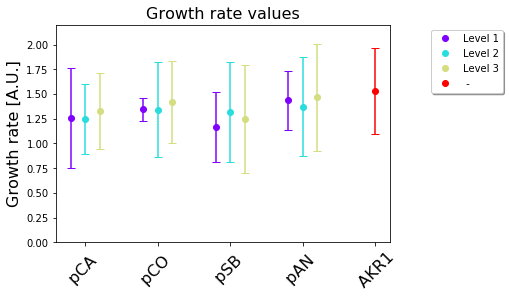

In [324]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(lvls)):
        mean_val = mu_organized[plasmids[j]][lvls[i]]['mean']
        std_val = mu_organized[plasmids[j]][lvls[i]]['std']
        #std_err = mu_organized[plasmids[j]][lvls[i]]['sem']
        ci= mu_organized[plasmids[j]][lvls[i]][CI_name]
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this example
            pos = j+ 1*separation 
            
        p, = plt.plot(pos,mean_val, 'o', color=colors_labels[i])
        #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_val, color=colors_labels[i],capsize = 4)
        #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
        plt.errorbar(pos, mean_val, yerr=ci, color=colors_labels[i],capsize = 4)   # error dado por CI
        #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
        
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('Growth rate [A.U.]', fontsize=16)
lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(mu_list),1.8]) #for STD plot
plt.ylim([0,2.2])   # for CI plot
plt.title('Growth rate values', fontsize=16)
filename = 'V3_Plots\OD600\mu_CI95_dotplot_N3'
#plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

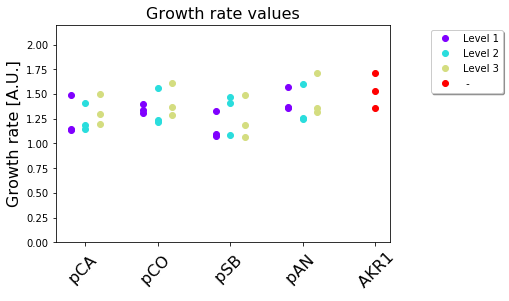

In [325]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(lvls)):
        mean_val = mu_organized[plasmids[j]][lvls[i]]['mean']
        std_val = mu_organized[plasmids[j]][lvls[i]]['std']
        #std_err = mu_organized[plasmids[j]][lvls[i]]['sem']
        ci= mu_organized[plasmids[j]][lvls[i]][CI_name]
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this example
            pos = j+ 1*separation 
        
                
        days = list(mu_organized.keys())[0:3]
               
        for day in days:
            mu_value = mu_organized[day][plasmids[j]][lvls[i]]['mean']
            p, = plt.plot(pos,mu_value, 'o', color=colors_labels[i])   
            
        #p, = plt.plot(pos,mean_val, 'o', color=colors_labels[i])
        #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_val, color=colors_labels[i],capsize = 4)
        #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=ci, color=colors_labels[i],capsize = 4)   # error dado por CI
        #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
        
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('Growth rate [A.U.]', fontsize=16)
lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(mu_list),1.8]) #for STD plot
plt.ylim([0,2.2])   # for CI plot
plt.title('Growth rate values', fontsize=16)
filename = 'V3_Plots\OD600\mu_dots_N3'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

#### Save the data

In [600]:
## add the values to the database object
database['Growth_rate'] = mu_organized


In [601]:
## save them in the folder
folder = 'data'
save_obj(database, 'kinetic_data', folder)

** ANOVA test **

In order to test if there is evidence of differences in the growth rate due to assembly level (plasmid size) ANOVA test was conducted. 

In [525]:
df = {}

for plasmid in plasmids[0:-1]:
    
    days = list(mu_organized.keys())[0:3]
    
    plasm_means = []
    
    count = 1
    for day in days:
        
        for lvl in lvls[0:-1]:
            
            mean_val = mu_organized[day][plasmid][lvl]['mean']
            plasm_means.append([mean_val, lvl, 'day '+str(count)])
        count +=1
    
    #create the pandas data frame
    df[plasmid] = pd.DataFrame(plasm_means, columns = ['value', 'Level', 'day']) 
    
    print('\n'+str(plasmid))
    print(df[plasmid])


pCA 
      value    Level    day
0  1.491788  Level 1  day 1
1  1.411823  Level 2  day 1
2  1.495941  Level 3  day 1
3  1.140158  Level 1  day 2
4  1.148779  Level 2  day 2
5  1.297418  Level 3  day 2
6  1.142408  Level 1  day 3
7  1.181567  Level 2  day 3
8  1.191640  Level 3  day 3

pCO 
      value    Level    day
0  1.397189  Level 1  day 1
1  1.564361  Level 2  day 1
2  1.368802  Level 3  day 1
3  1.305924  Level 1  day 2
4  1.239593  Level 2  day 2
5  1.607578  Level 3  day 2
6  1.333067  Level 1  day 3
7  1.217345  Level 2  day 3
8  1.287036  Level 3  day 3

pSB 
      value    Level    day
0  1.331500  Level 1  day 1
1  1.466440  Level 2  day 1
2  1.491085  Level 3  day 1
3  1.075441  Level 1  day 2
4  1.406835  Level 2  day 2
5  1.188146  Level 3  day 2
6  1.092675  Level 1  day 3
7  1.086079  Level 2  day 3
8  1.065909  Level 3  day 3

pAN 
      value    Level    day
0  1.574033  Level 1  day 1
1  1.604297  Level 2  day 1
2  1.716416  Level 3  day 1
3  1.368058  Level 1  da

In [526]:
results = {}
for plasmid in plasmids[0:-1]:
    results[plasmid] = ols('value ~ C(Level)', data=df[plasmid]).fit()
    print('\n'+ plasmid)
    print(results[plasmid].summary())
    aov_table = sm.stats.anova_lm(results[plasmid])
    print('\nAnova Table')
    print(aov_table)
    print('\n\n')


pCA 
                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                 -0.249
Method:                 Least Squares   F-statistic:                    0.2038
Date:                Fri, 26 Jul 2019   Prob (F-statistic):              0.821
Time:                        16:50:42   Log-Likelihood:                 5.0715
No. Observations:                   9   AIC:                            -4.143
Df Residuals:                       6   BIC:                            -3.551
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               1.25

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1390: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=9
  "anyway, n=%i" % int(n))
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.083
Model:                            OLS   Adj. R-squared:                 -0.222
Method:                 Least Squares   F-statistic:                    0.2721
Date:                Fri, 26 Jul 2019   Prob (F-statistic):              0.771
Time:                        16:50:42   Log-Likelihood:                 6.1170
No. Observations:                   9   AIC:                            -6.234
Df Residuals:                       6   BIC:                            -5.642
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               1.3454    

In any of the plasmids there is a significant difference in the growth rate by the level (under 95% confidence)

Similarly we can compare them by plasmid considering AKR1 too. (This is not totally correct because there is a difference in the number of samples. AKR1 has just three and each of the other has nine samples).

In [535]:
plasm_means = []


for plasmid in plasmids:
    days = list(mu_organized.keys())[0:3]
    
    count = 1
    for day in days:
        
        if plasmid == plasmids[-1]:
            lvl = lvls[-1]
            mean_val = mu_organized[day][plasmid][lvl]['mean']
            plasm_means.append([mean_val, lvl, 'day '+str(count), plasmid])
        
        else:
            for lvl in lvls[0:-1]:

                mean_val = mu_organized[day][plasmid][lvl]['mean']
                plasm_means.append([mean_val, lvl, 'day '+str(count), plasmid])       
        
        count +=1
            
df = pd.DataFrame(plasm_means, columns = ['value', 'Level', 'day', 'plasmid']) 

print(df)

       value    Level    day plasmid
0   1.491788  Level 1  day 1    pCA 
1   1.411823  Level 2  day 1    pCA 
2   1.495941  Level 3  day 1    pCA 
3   1.140158  Level 1  day 2    pCA 
4   1.148779  Level 2  day 2    pCA 
5   1.297418  Level 3  day 2    pCA 
6   1.142408  Level 1  day 3    pCA 
7   1.181567  Level 2  day 3    pCA 
8   1.191640  Level 3  day 3    pCA 
9   1.397189  Level 1  day 1    pCO 
10  1.564361  Level 2  day 1    pCO 
11  1.368802  Level 3  day 1    pCO 
12  1.305924  Level 1  day 2    pCO 
13  1.239593  Level 2  day 2    pCO 
14  1.607578  Level 3  day 2    pCO 
15  1.333067  Level 1  day 3    pCO 
16  1.217345  Level 2  day 3    pCO 
17  1.287036  Level 3  day 3    pCO 
18  1.331500  Level 1  day 1    pSB 
19  1.466440  Level 2  day 1    pSB 
20  1.491085  Level 3  day 1    pSB 
21  1.075441  Level 1  day 2    pSB 
22  1.406835  Level 2  day 2    pSB 
23  1.188146  Level 3  day 2    pSB 
24  1.092675  Level 1  day 3    pSB 
25  1.086079  Level 2  day 3    pSB 
2

In [537]:
results = ols('value ~ C(plasmid)', data=df).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  value   R-squared:                       0.257
Model:                            OLS   Adj. R-squared:                  0.169
Method:                 Least Squares   F-statistic:                     2.935
Date:                Fri, 26 Jul 2019   Prob (F-statistic):             0.0346
Time:                        17:05:43   Log-Likelihood:                 18.914
No. Observations:                  39   AIC:                            -27.83
Df Residuals:                      34   BIC:                            -19.51
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              1.5334      0.092     16.645      0.000       1.346       1.721
C(plasmid)[T.pAN ]    -0.1091      0.106     -1.025      0.312      -0.325       0.107
C(plasmid)[T.pCA ]    -0.2554      0.106     -2.401      0.022      -0.472      -0.039
C(plasmid)[T.pCO ]    -0.1644      0.106     -1.545      0.131      -0.381       0.052
C(plasmid)[T.pSB ]    -0.2885      0.106     -2.712      0.010      -0.505      -0.072
==============================================================================
Omnibus:                       11.477   Durbin-Watson:                   1.539
Prob(Omnibus):                  0.003   Jarque-Bera (JB):                4.087
Skew:                           0.491   Prob(JB):                        0.130
Kurtosis:                       1.754   Cond. No.                         9.13
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [538]:
aov_table = sm.stats.anova_lm(results)
aov_table

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


,df,sum_sq,mean_sq,F,PR(>F)
C(plasmid),4.0,0.298919,0.074730,2.935077,0.034634
Residual,34.0,0.865672,0.025461,NaN,NaN


It propouse some significant difference under 95% confidence. To furhter test it, a Tukey HSD test was performed.

In [539]:
# Set up the data for comparison (creates a specialised object)
MultiComp = MultiComparison(df['value'],
                            df['plasmid'])

# Show all pair-wise comparisons:

# Print the comparisons
THSD = MultiComp.tukeyhsd()
thsd_sum = THSD.summary()
print(thsd_sum)


Multiple Comparison of Means - Tukey HSD,FWER=0.05
group1 group2 meandiff  lower  upper  reject
--------------------------------------------
 AKR1   pAN   -0.1091  -0.4154 0.1972 False 
 AKR1   pCA   -0.2554  -0.5618 0.0509 False 
 AKR1   pCO   -0.1644  -0.4707 0.1419 False 
 AKR1   pSB   -0.2885  -0.5948 0.0178 False 
 pAN    pCA   -0.1464   -0.363 0.0702 False 
 pAN    pCO   -0.0553  -0.2719 0.1613 False 
 pAN    pSB   -0.1794   -0.396 0.0372 False 
 pCA    pCO    0.091   -0.1256 0.3076 False 
 pCA    pSB    -0.033  -0.2496 0.1836 False 
 pCO    pSB   -0.1241  -0.3407 0.0925 False 
--------------------------------------------


In [540]:
p_values = psturng(np.abs(THSD.meandiffs / THSD.std_pairs), len(THSD.groupsunique), THSD.df_total)
print()
print("p values:", p_values)


p values: [0.82285003 0.13942638 0.5364849  0.07305239 0.31365929 0.9
 0.1439413  0.72098257 0.9        0.47815432]


It seem to not shown a really significant difference under 95% confidence

Finally, we can compare them by vector set and plasmid (13 groups of N=3 each one) to see if they shows some significant difference

In [585]:
plasm_means = []


for plasmid in plasmids:
    days = list(mu_organized.keys())[0:3]
    
    count = 1
    for day in days:
        
        if plasmid == plasmids[-1]:
            lvl = lvls[-1]
            mean_val = mu_organized[day][plasmid][lvl]['mean']
            plasm_means.append([mean_val, lvl + ' '+plasmid, 'day '+str(count)])
        
        else:
            for lvl in lvls[0:-1]:

                mean_val = mu_organized[day][plasmid][lvl]['mean']
                plasm_means.append([mean_val, lvl +' '+ plasmid, 'day '+str(count)])       
        
        count +=1
            
df = pd.DataFrame(plasm_means, columns = ['value', 'Level_Plasmid', 'day']) 

print(df)

       value Level_Plasmid    day
0   1.491788  Level 1 pCA   day 1
1   1.411823  Level 2 pCA   day 1
2   1.495941  Level 3 pCA   day 1
3   1.140158  Level 1 pCA   day 2
4   1.148779  Level 2 pCA   day 2
5   1.297418  Level 3 pCA   day 2
6   1.142408  Level 1 pCA   day 3
7   1.181567  Level 2 pCA   day 3
8   1.191640  Level 3 pCA   day 3
9   1.397189  Level 1 pCO   day 1
10  1.564361  Level 2 pCO   day 1
11  1.368802  Level 3 pCO   day 1
12  1.305924  Level 1 pCO   day 2
13  1.239593  Level 2 pCO   day 2
14  1.607578  Level 3 pCO   day 2
15  1.333067  Level 1 pCO   day 3
16  1.217345  Level 2 pCO   day 3
17  1.287036  Level 3 pCO   day 3
18  1.331500  Level 1 pSB   day 1
19  1.466440  Level 2 pSB   day 1
20  1.491085  Level 3 pSB   day 1
21  1.075441  Level 1 pSB   day 2
22  1.406835  Level 2 pSB   day 2
23  1.188146  Level 3 pSB   day 2
24  1.092675  Level 1 pSB   day 3
25  1.086079  Level 2 pSB   day 3
26  1.065909  Level 3 pSB   day 3
27  1.574033  Level 1 pAN   day 1
28  1.604297  

In [586]:
results = ols('value ~ Level_Plasmid', data=df).fit()
results.summary()
aov_table = sm.stats.anova_lm(results)
aov_table

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


,df,sum_sq,mean_sq,F,PR(>F)
Level_Plasmid,12.0,0.371836,0.030986,1.016257,0.462815
Residual,26.0,0.792756,0.030491,NaN,NaN


There is no significant evidence to show a difference in the maximum growth rate expression under 95% confidence

# Loading the computed data

Next lines are to load and explore the saved data. Also to save CSV files with them

In [25]:
folder = 'data'
ready_dtb = load_obj('kinetic_data', folder)

In [26]:
cats = list(ready_dtb.keys())
exp = list(ready_dtb[cats[0]].keys())
plasmids = list(ready_dtb[cats[0]][exp[0]].keys())[0:5]
levels = list(ready_dtb[cats[0]][exp[0]][plasmids[0]].keys())[0:3]

#ready_dtb[cats[0]][plasmids[0]].keys()

In [27]:
print(cats)
print(exp)
print(plasmids)
print(levels)

['Fluorescence ratio', 'Growth_rate']
['Placa v2 - 01- python.xlsx', 'Placa v2 - 02- python.xlsx', 'Placa v2 - 03- python.xlsx', 'pCA ', 'pCO ', 'pSB ', 'pAN ', ' AKR1']
['pCA ', 'pCO ', 'pSB ', 'pAN ', ' AKR1']
['Level 1', 'Level 2', 'Level 3']


In [118]:
levels = list(ready_dtb[cats[0]][exp[0]][plasmids[0]].keys())[0:4]
colors_labels = plt.cm.rainbow(np.linspace(0, 1, len(levels)))

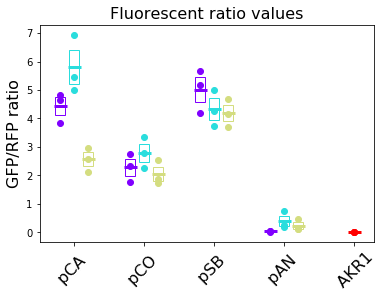

In [169]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(levels)):
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this example
            pos = j+ 1*separation 
        
                
        days = list(ready_dtb[cats[0]].keys())[0:3]
               
        for day in days:
            mu_value = ready_dtb[cats[0]][day][plasmids[j]][levels[i]]['mean']
            p, = plt.plot(pos,mu_value, 'o', color=colors_labels[i])   
        
        mean_val = ready_dtb[cats[0]][plasmids[j]][levels[i]]['mean']
        #std_val = ready_dtb[cats[0]][plasmids[j]][levels[i]]['std']
        sem_val = ready_dtb[cats[0]][plasmids[j]][levels[i]]['sem']
        
        plt.plot(pos,mean_val, '_', ms = 13, mew=3, color=colors_labels[i])
            
        #plt.errorbar(pos, mean_val, yerr=sem_val, color=colors_labels[i], capsize = 5)
        plt.bar(pos, 2*sem_val, width = 0.15, bottom=mean_val-sem_val, edgecolor=colors_labels[i], facecolor="None")
        
        if j == 0:
            plot_aux.append(p)

                

plt.ylabel('Growth rate [A.U.]', fontsize=16)
#lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
plt.ylabel('GFP/RFP ratio', fontsize=16)
plt.title('Fluorescent ratio values', fontsize=16)

filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_mean_dots_plasm'

plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

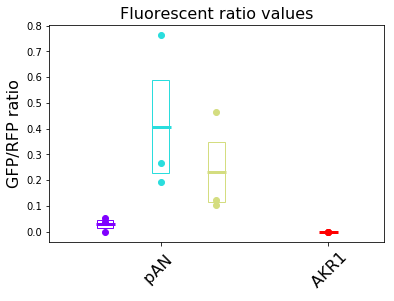

In [170]:
plasmids2 = plasmids[3:]

plt.figure()

plot_aux = []

for j in range(len(plasmids2)):
   
    for i in range(len(levels)):
        
        separation = 0.1
        pos = j*0.8+i*separation
         
        if i == 3 :               #this is a particular solution for this example
            pos = j*0.3+ 1*separation 
        
                
        days = list(ready_dtb[cats[0]].keys())[0:3]
               
        for day in days:
            mu_value = ready_dtb[cats[0]][day][plasmids2[j]][levels[i]]['mean']
            p, = plt.plot(pos,mu_value, 'ko', color=colors_labels[i])   
        
        mean_val = ready_dtb[cats[0]][plasmids2[j]][levels[i]]['mean']
        #std_val = ready_dtb[cats[0]][plasmids[j]][levels[i]]['std']
        sem_val = ready_dtb[cats[0]][plasmids2[j]][levels[i]]['sem']
        
        plt.plot(pos,mean_val, '_', ms = 19, mew=3, color=colors_labels[i])
            
        #plt.errorbar(pos, mean_val, yerr=sem_val, color=colors_labels[i], capsize = 5)
        plt.bar(pos, 2*sem_val, width = 0.03, bottom=mean_val-sem_val, edgecolor=colors_labels[i], facecolor="None")
        
        if j == 0:
            plot_aux.append(p)

                

plt.ylabel('Growth rate [A.U.]', fontsize=16)
#lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids2))
plt.xticks(x_points*0.3+separation,plasmids2,fontsize=16, rotation = 45)
plt.ylabel('GFP/RFP ratio', fontsize=16)
plt.title('Fluorescent ratio values', fontsize=16)
plt.xlim([-0.1,0.5])
#plt.ylim([-0.05,0.8])  # for std plot
#plt.ylim([-0.2,1])    # for CI plot

filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_mean_dotsN3_zoom'

plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

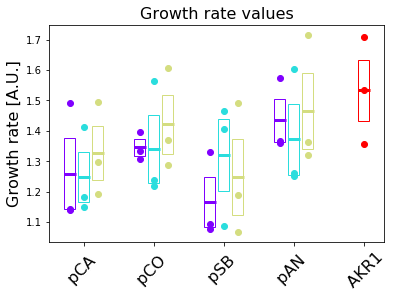

In [171]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
   
    for i in range(len(levels)):
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this example
            pos = j+ 1*separation 
        
                
        days = list(ready_dtb[cats[1]].keys())[0:3]
               
        for day in days:
            mu_value = ready_dtb[cats[1]][day][plasmids[j]][levels[i]]['mean']
            p, = plt.plot(pos,mu_value, 'ko', color=colors_labels[i])   
        
        mean_val = ready_dtb[cats[1]][plasmids[j]][levels[i]]['mean']
        #std_val = ready_dtb[cats[1]][plasmids[j]][levels[i]]['std']
        sem_val = ready_dtb[cats[1]][plasmids[j]][levels[i]]['sem']
        
        plt.plot(pos,mean_val, 'k_', ms = 12, mew=3, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=sem_val, color=colors_labels[i], capsize = 5)
        plt.bar(pos, 2*sem_val, width = 0.15, bottom=mean_val-sem_val, edgecolor=colors_labels[i], facecolor="None")
        
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('Growth rate [A.U.]', fontsize=16)
#lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(mu_list),1.8]) #for STD plot
#plt.ylim([0,2.2])   # for CI plot
plt.title('Growth rate values', fontsize=16)

filename = 'V3_Plots\OD600\mu_dots_N3_mean'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

In [ ]:
levels = list(ready_dtb[cats[0]][exp[0]][plasmids[0]].keys())[0:3]

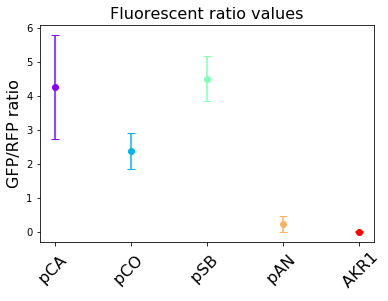

In [263]:
colors_labels = plt.cm.rainbow(np.linspace(0, 1, len(plasmids))) 

plt.figure()
plot_aux = []

for j in range(len(plasmids)):
   
    mean_val = ready_dtb[cats[0]][plasmids[j]]['mean']
    std_val = ready_dtb[cats[0]][plasmids[j]]['std']
    std_err = ready_dtb[cats[0]][plasmids[j]]['sem']
    ci= ready_dtb[cats[0]][plasmids[j]]['CI_0.95']

    #separation = 0.2
    #pos = j+i*separation

    #if i == 3 :               #this is a particular solution for this graph instance
        #pos = j+ 1*separation 

    p, = plt.plot(j,mean_val, 'o', color=colors_labels[j])
    #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
    plt.errorbar(j, mean_val, yerr=std_val, color=colors_labels[j], capsize = 4)
    #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
    #plt.errorbar(j, mean_val, yerr=ci, color=colors_labels[j], capsize = 4)   # error dado por CI
    #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
    plot_aux.append(p)

                
#plt.title()
plt.ylabel('GFP/RFP ratio', fontsize=16)
#lgd = plt.legend(plot_aux,plasmids, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(range(len(plasmids)),plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(ro_list),max(ro_list)])
plt.title('Fluorescent ratio values', fontsize=16)

filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_std_dot_plasmids_v2'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

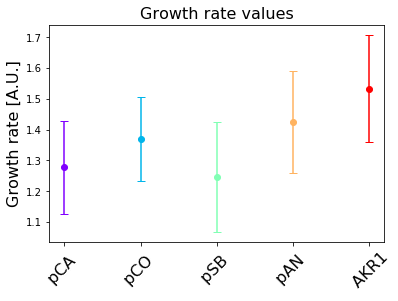

In [259]:
colors_labels = plt.cm.rainbow(np.linspace(0, 1, len(plasmids))) 

plt.figure()
plot_aux = []

for j in range(len(plasmids)):
   
    mean_val = ready_dtb[cats[1]][plasmids[j]]['mean']
    std_val = ready_dtb[cats[1]][plasmids[j]]['std']
    std_err = ready_dtb[cats[1]][plasmids[j]]['sem']
    ci= ready_dtb[cats[1]][plasmids[j]]['CI_0.95']

    #separation = 0.2
    #pos = j+i*separation

    #if i == 3 :               #this is a particular solution for this graph instance
        #pos = j+ 1*separation 

    p, = plt.plot(j,mean_val, 'o', color=colors_labels[j])
    #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
    plt.errorbar(j, mean_val, yerr=std_val, color=colors_labels[j], capsize = 4)
    #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
    #plt.errorbar(j, mean_val, yerr=ci, color=colors_labels[j], capsize = 4)   # error dado por CI
    #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
    plot_aux.append(p)

                
#plt.title()
plt.ylabel('Growth rate [A.U.]', fontsize=16)
#lgd = plt.legend(plot_aux,plasmids, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(range(len(plasmids)),plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(ro_list),max(ro_list)])
plt.title('Growth rate values', fontsize=16)

filename = 'V3_Plots\OD600\mu_SD_dotplot_plasmids'
plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

In [252]:
ready_dtb[cats[1]][' AKR1'].keys()

dict_keys(['Level 1', 'Level 2', 'Level 3', ' - ', 'mean', 'std', 'CV', 'sem', 'CI_0.95'])

In [253]:
ready_dtb[cats[1]][' AKR1']

{' - ': {'CI_0.95': 0.4351200475936545,
  'mean': 1.5333898843146125,
  'sem': 0.10112832127231128,
  'std': 0.17515939052779161},
 'CI_0.95': 0.4351200475936545,
 'CV': 11.423017219530148,
 'Level 1': {'CI_0.95': nan, 'mean': nan, 'sem': nan, 'std': nan},
 'Level 2': {'CI_0.95': nan, 'mean': nan, 'sem': nan, 'std': nan},
 'Level 3': {'CI_0.95': nan, 'mean': nan, 'sem': nan, 'std': nan},
 'mean': 1.5333898843146125,
 'sem': 0.10112832127231128,
 'std': 0.17515939052779161}

Text(0.5,1,'Fluorescent ratio values')

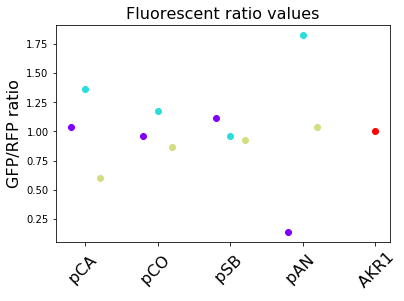

In [173]:
plt.figure()

plot_aux = []

for j in range(len(plasmids)):
    
    p_mean_val = ready_dtb[cats[0]][plasmids[j]]['mean']
    
    for i in range(len(levels)):
        
        mean_val = ready_dtb[cats[0]][plasmids[j]][levels[i]]['mean']/p_mean_val
        std_val = ready_dtb[cats[0]][plasmids[j]][levels[i]]['std']
        std_err = ready_dtb[cats[0]][plasmids[j]][levels[i]]['sem']
        ci= ready_dtb[cats[0]][plasmids[j]][levels[i]]['CI_0.95']
        
        separation = 0.2
        pos = j+i*separation
         
        if i == 3 :               #this is a particular solution for this graph instance
            pos = j+ 1*separation 
            
        p, = plt.plot(pos,mean_val, 'o', color=colors_labels[i])
        #plt.bar(j, mean_val,0, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_val, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=std_err, color=colors_labels[i])
        #plt.errorbar(pos, mean_val, yerr=ci, color=colors_labels[i], capsize = 4)   # error dado por CI
        #plt.bar(pos, mean_val,separation, yerr=ci, color=colors_labels[i], capsize = 4)
        if j == 0:
            plot_aux.append(p)

                
#plt.title()
plt.ylabel('GFP/RFP ratio', fontsize=16)
#lgd = plt.legend(plot_aux,lvls, loc = 'upper right', bbox_to_anchor=(1.35, 1),fancybox=True, shadow=True,scatterpoints = 1)
x_points = np.arange(len(plasmids))
plt.xticks(x_points+separation,plasmids,fontsize=16, rotation = 45)
#plt.ylim([min(ro_list),max(ro_list)])
plt.title('Fluorescent ratio values', fontsize=16)

#filename = 'V3_Plots/Fluorescence/GFPvsRFP/fixed_ax/ro_CI_dot_v2'
#plt.savefig(filename+".pdf", bbox_extra_artists=(lgd,), bbox_inches='tight', transparent=True)

In [4]:


# display the statistic you are interested in:

#stat = 'CV'   # asign a "stat" variable one of those: ['mean', 'std', 'sem, 'CV']
levels = ['Level 1', 'Level 2', 'Level 3']
stats = ['mean','std','CV']

for cat in cats:
    plasmids = list(ready_dtb[cat].keys())
    print('These are the values of '+str(cat)+ '\n')
    for plasm in plasmids:
        for stat in stats:
            print('\n'+stat +' value plasmid '+ plasm +'- All' +' is '+ str(ready_dtb[cat][plasm][stat]))
            
            for level in levels:
            
                print(stat +' value plasmid '+ plasm +'- '+ level +' is '+ str(ready_dtb[cat][plasm][level][stat]))
    
    print('\n')
            

These are the values of Fluorescence ratio


mean value plasmid pCA - All is 4.268661604236781
mean value plasmid pCA - Level 1 is 4.433514679697565
mean value plasmid pCA - Level 2 is 5.806118060608506
mean value plasmid pCA - Level 3 is 2.5663520724042717

std value plasmid pCA - All is 1.456290047063649
std value plasmid pCA - Level 1 is 0.4734010745842654
std value plasmid pCA - Level 2 is 0.8424528402667023
std value plasmid pCA - Level 3 is 0.37376477113709405

CV value plasmid pCA - All is 34.115846653626406


KeyError: 'CV'

### Saving a CSV file

In [267]:
import csv

cats = list(ready_dtb.keys())

# display the statistic you are interested in:

#stat = 'CV'   # asign a "stat" variable one of those: ['mean', 'std', 'sem', 'CV']
levels = ['Level 1', 'Level 2', 'Level 3']
stats = ['mean', 'std', 'sem','CI_0.95']

with open('f_values.csv', 'w') as csvfile:
    filewriter = csv.writer(csvfile, delimiter=',',
                            quotechar='|', quoting=csv.QUOTE_MINIMAL)

    for cat in cats:
        cats = list(ready_dtb.keys())
        exp = list(ready_dtb[cats[0]].keys())
        plasmids = list(ready_dtb[cats[0]][exp[0]].keys())[0:5]

        token = 0
        #print('These are the values of '+str(cat)+ '\n')
        for plasm in plasmids:
                for level in levels:              
                    
                    if token == 0:
                        filewriter.writerow(['Parameter', 'Plasmid', 'Level']+stats)
                        token = 1
                    
                    sts_vals = []
                    for stat in stats:
                         sts_vals.append(str(ready_dtb[cat][plasm][level][stat]))
                    
                    filewriter.writerow([cat, plasm, level]+ sts_vals)
                    #print(stat +' value plasmid '+ plasm +'- '+ level +' is '+ str(ready_dtb[cat][plasm][level][stat]))
                
                #Write whole plasmid info (non for level)

                sts_vals = []
                for stat in stats:
                     sts_vals.append(str(ready_dtb[cat][plasm][stat]))

                filewriter.writerow([cat, plasm, 'All']+ sts_vals)
        #print('\n')


In [ ]:
cats = list(ready_dtb.keys())

# display the statistic you are interested in:

#stat = 'CV'   # asign a "stat" variable one of those: ['mean', 'std', 'sem, 'CV']
stats = ['mean','CI_0.95']

for cat in cats:
    plasmids = list(ready_dtb[cat].keys())
    print('These are the values of '+str(cat)+ '\n')
    for plasm in plasmids:
        for stat in stats:
                        
            print(stat +' value plasmid '+ plasm +'- '+ level +' is '+ str(ready_dtb[cat][plasm][stat]))
    
    print('\n')